# Transactions Fraud Detection

**Authors:** [Peter Macinec](https://github.com/pmacinec), [Timotej Zatko](https://github.com/timzatko)

## Nature Inspired Algorithms - feature selection on sample of the dataset

Since the feature selection took too long on the full dataset (which was also undersampled), for research purposes we will do a featue selection only on the fraction of it, to examine the differences between the NIA algorithms and its configurations.

In this notebook we will compare the following algorithms from __Xin-She Yang__: Firefly Algorithm, Cuckoo Search Algorithm, Bat Algorithm, Flower Pollination Algorithm + Grey Wolf Algorithm.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('..')

In [3]:
from src.helpers import split_pascal_case_string

import seaborn as sns

import matplotlib.pyplot as plt

sns.set(style="whitegrid")

plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams.update({'font.size': 15})

%config InlineBackend.figure_format='retina'

## Load the data

In [4]:
from src.dataset import load_processed_data

x_train, y_train, x_test, y_test = load_processed_data()

Number of records:
  x_train - 472432
  y_train - 472432
  x_test - 118108
  y_test - 118108


We will firstly undersample the predicted classes to shrink the dataset size.

In [5]:
from src.data_balancing import random_undersample

x_train, y_train = random_undersample(x_train, y_train)

len(x_train), len(y_train)

(32842, 32842)

Then we shrink the dataset egain to 5% of the size, so the training won't take that much time. 

In [6]:
from src.dataset import shrink_data

frac = 0.05

n_train = int(len(x_train) * frac)

x_train = shrink_data(x_train, n_train, random_state=420)
y_train = shrink_data(y_train, n_train, random_state=420)

len(x_train), len(y_train)

(1642, 1642)

Also shrink the test dataset size, since the train was random undersampled and then shrank, we need to recalculate the test size.

In [7]:
n_test = int(0.2 / 0.8 * len(x_train))

x_test = shrink_data(x_test, n_test, random_state=420)
y_test = shrink_data(y_test, n_test, random_state=420)

len(x_test), len(y_test)

(410, 410)

## Experiments

As in the previous experiments, we will use decision tree as our classifier.

We won't set any hyper-parameters and leave it as it is.

In [8]:
from sklearn.tree import DecisionTreeClassifier


def model_fn():
    return DecisionTreeClassifier(random_state=42)

### Baseline model

Firstly, compare to the baseline mode.

#### All features

In [9]:
from src.evaluation import custom_classification_report

In [10]:
%%time

clf = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf = clf.fit(x_train, y_train)

CPU times: user 46.8 ms, sys: 1.57 ms, total: 48.4 ms
Wall time: 47.4 ms


not fraud
precision: 0.7416879795396419
recall: 0.9797297297297297
f1-score: 0.8442503639010189
support: 296


is fraud
precision: 0.6842105263157895
recall: 0.11403508771929824
f1-score: 0.19548872180451127
support: 114


accuracy: 0.7390243902439024


macro avg
precision: 0.7129492529277157
recall: 0.546882408724514
f1-score: 0.5198695428527651
support: 410


weighted avg
precision: 0.7257064437652049
recall: 0.7390243902439024
f1-score: 0.6638629804888192
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.7129492529277157




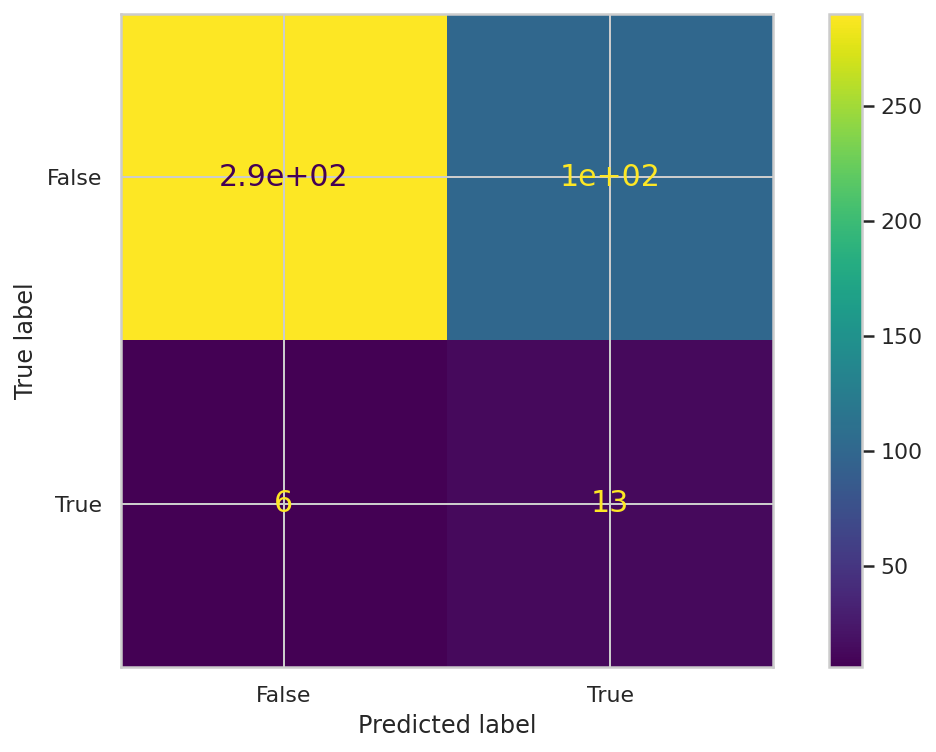

In [11]:
custom_classification_report(clf, x_test, y_test)

#### RFECV

In [12]:
import matplotlib.pyplot as plt

from sklearn.feature_selection import RFECV

Optimal number of features: 112


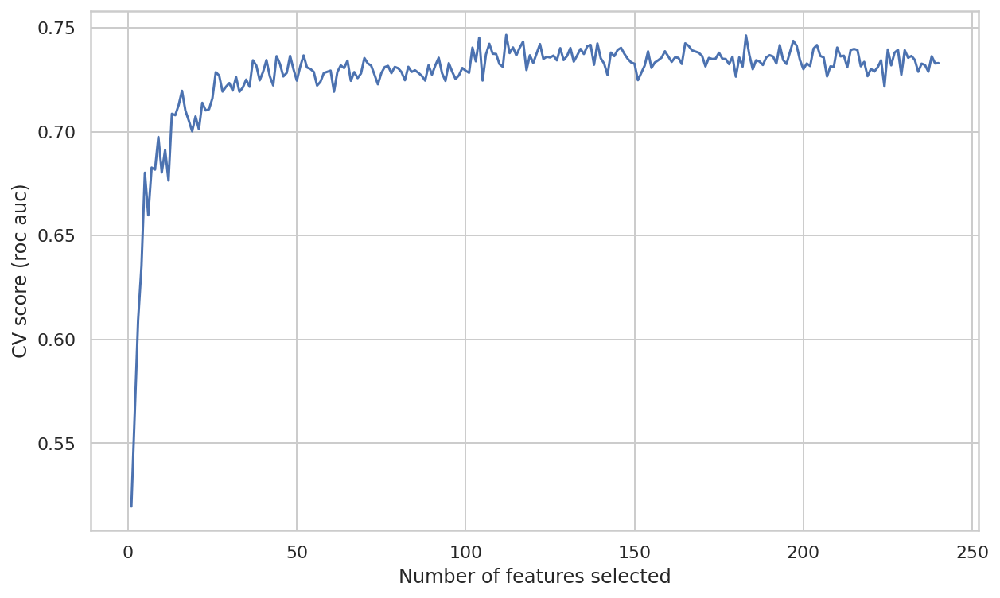

CPU times: user 5.45 s, sys: 84.2 ms, total: 5.53 s
Wall time: 21.3 s


In [13]:
%%time

rfecv = RFECV(estimator=clf, scoring='roc_auc', n_jobs=-1, cv=5)
rfecv.fit(x_train, y_train)

selected_columns = [col for col, selected in zip(x_train.columns, rfecv.support_) if selected]

print(f'Optimal number of features: {rfecv.n_features_}')

plt.figure()
plt.xlabel('Number of features selected')
plt.ylabel('CV score (roc auc)')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [14]:
import numpy as np

print(f"Scores: {max(rfecv.grid_scores_)} (max), {np.mean(rfecv.grid_scores_)} (mean)")

Scores: 0.7465388137503524 (max), 0.7273990010390251 (mean)


not fraud
precision: 0.7007672634271099
recall: 0.982078853046595
f1-score: 0.817910447761194
support: 279


is fraud
precision: 0.7368421052631579
recall: 0.10687022900763359
f1-score: 0.18666666666666668
support: 131


accuracy: 0.7024390243902439


macro avg
precision: 0.7188046843451339
recall: 0.5444745410271143
f1-score: 0.5022885572139304
support: 410


weighted avg
precision: 0.7122936153308228
recall: 0.7024390243902439
f1-score: 0.6162203616066011
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.718804684345134




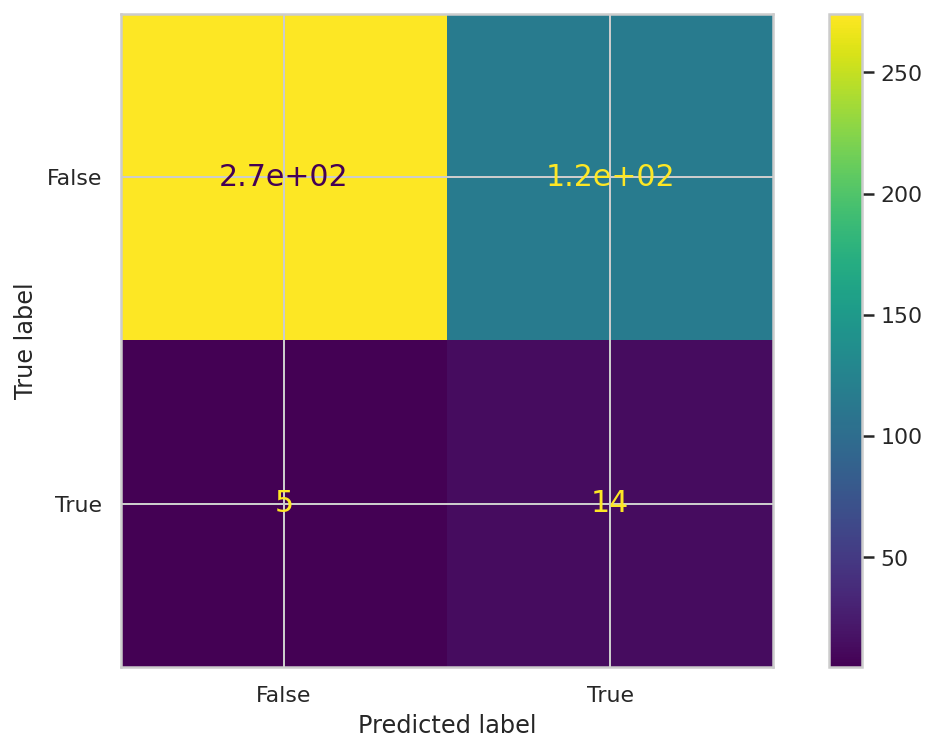

In [15]:
custom_classification_report(rfecv, x_test, y_test)

### Setup

We will setup the classification benchmark which is required by NiaPy library.

In [16]:
from src.classification_benchmark_cv import ClassificationBenchmarkCV

from sklearn.metrics import roc_auc_score


benchmark = ClassificationBenchmarkCV(
    model_fn,
    roc_auc_score,
    x_train,
    y_train,
    random_state=42,
    cv=5,
)

In [17]:
import numpy as np

from NiaPy.task import OptimizationType

from src.tasks import StoppingTaskWithLogging
from src.analysis import show_optimization_run_plot, show_optimization_run_plot_for_multiple_tasks


def run_optimization_once(benchmark, algorithm, nGEN):
    """
    Does feature selection using specified algortithm.
    Returns the optimal columns, model score and the task which was optimized.
    
    :param benchmark: NiaPy.Benchmark to optimize.
    :param algorithm: algorithm object to use for optimization task.
    :param nGEN: number of generations.
    """
    
    # when using OptimizationType.MAXIMIZATION, the library will fail
    # we use OptimizationType.MINIMIZATION instead and invert the score
    task = StoppingTaskWithLogging(
        D=benchmark.get_length(),
        nGEN=nGEN,
        optType=OptimizationType.MINIMIZATION,
        benchmark=benchmark
    )

    solution_vec, score = algorithm.run(task=task)    

    if algorithm.exception is not None:
        raise algorithm.exception
    
    # invert the score
    score = 1 - score
    columns = benchmark.select_columns(solution_vec)
    
    return score, columns, task


def run_optimization(benchmark, algorithm, nGEN, number_of_runs=5):
    """
    Optimize task with provided algorithm.
    
    :param benchmark: NiaPy.Benchmark to optimize.
    :param algorithm: algorithm object to use for optimization task.
    :param nGEN: number of generations.
    :param number_of_runs: number of algorithm runs (defaults to 5).
    """
    best_columns = None
    best_score = 0
    
    scores = []
    tasks = []
    selected_features = []
    
    for i in range(1, number_of_runs + 1):
        print('--------------')
        print(f'Run {i}')
        print('--------------')
        
        score, columns, task = run_optimization_once(benchmark, algorithm, nGEN)
        
        show_optimization_run_plot(task, f'{split_pascal_case_string(type(algorithm).__name__)} run #{i}')
        
        print(f'Score: {score}')
        print(f'Number of features selected: {len(columns)}\n')
        print('\n')
        
        if score > best_score:
            best_score = score
            best_columns = columns
            
        scores.append(score)
        tasks.append(task)
        selected_features.append(len(columns))
    
    show_optimization_run_plot_for_multiple_tasks(tasks, f'{split_pascal_case_string(type(algorithm).__name__)} scores by run')    

    mean_score = np.mean(scores)
    
    print(f'\nMean score of {number_of_runs} runs: {mean_score}\n\n')
    
    print(f'\nBest score of {number_of_runs} runs: {best_score}')
    print(f'Number of features selected: {len(best_columns)}')
    
    return scores, best_score, best_columns, selected_features

__Experiments strategy__

- we will examine the following algorithms: Firefly Algorithm, Cuckoo Search Algorithm, Bat Algorithm, Flower Pollination Algorithm, Grey Wolf Algorithm
- we will train several population sizes (10, 20, 50) each of them up to 50 generations
- we will do 5 runs for each population size and we will report the mean best score from each run

In [18]:
population_sizes = [10, 20, 50]
number_of_generations = 50
number_of_runs = 5

In [19]:
def run_experiment(algorithm):
    overall_best_score = 0
    overall_best_features = None
    overall_best_population_size = None
    
    scores_by_run = {}
    selected_features_by_run = {}

    for population_size in population_sizes:    
        algorithm.setParameters(NP=population_size)

        print('========================================================')
        print(type(algorithm).__name__)
        print(f'population_size={population_size}')
        print(f'number_of_generations={number_of_generations}')
        print('========================================================')

        scores, best_score, best_features, selected_features = run_optimization(benchmark, algorithm, number_of_generations, number_of_runs=number_of_runs)        
        
        scores_by_run[population_size] = scores
        selected_features_by_run[population_size] = selected_features

        if best_score > overall_best_score:
            overall_best_score = best_score
            overall_best_features = best_features
            overall_best_population_size = population_size

        print('\n\n')
        
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    
    print(f'The best score is {best_score} with population_size={overall_best_population_size}\n')
    
    return scores_by_run, overall_best_score, overall_best_features, overall_best_population_size, selected_features_by_run

In [20]:
scores_by_algorithm = {}
selected_features_by_algorithm = {}

### Firefly Algorithm (FA)

[Firefly Algorithm](https://github.com/NiaOrg/NiaPy/blob/master/NiaPy/algorithms/basic/fa.py) default parameters:
- alpha = 1
- betamin = 1
- gamma = 2

FireflyAlgorithm
population_size=10
number_of_generations=50
--------------
Run 1
--------------


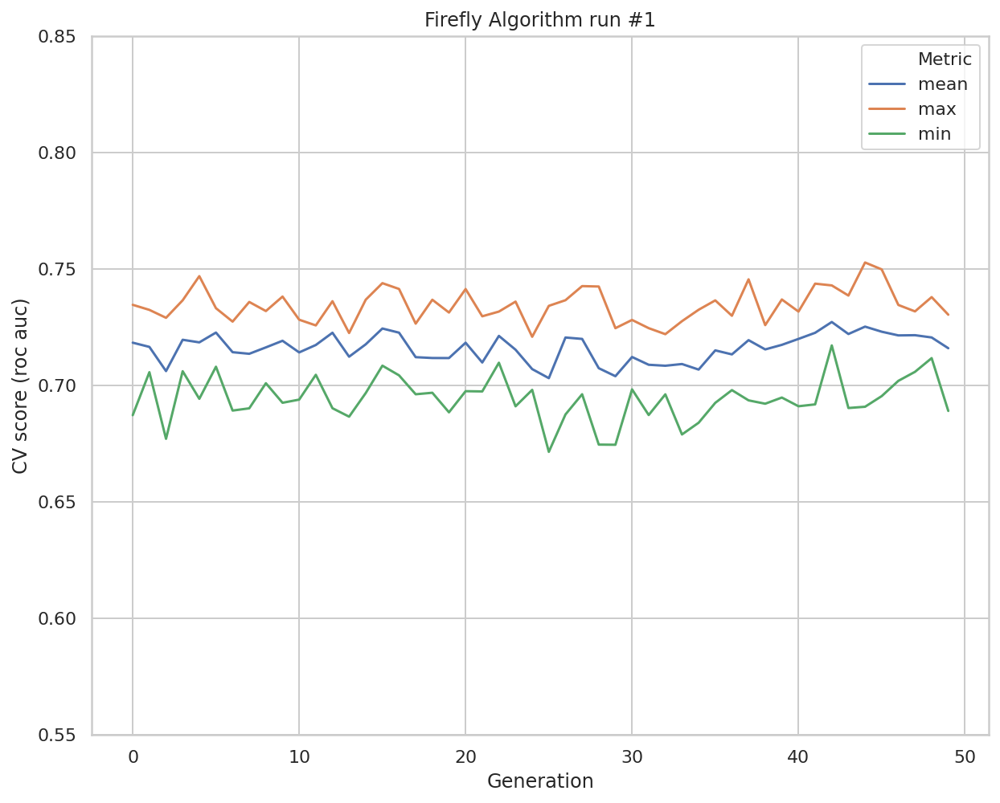

Score: 0.7527140320270265
Number of features selected: 128



--------------
Run 2
--------------


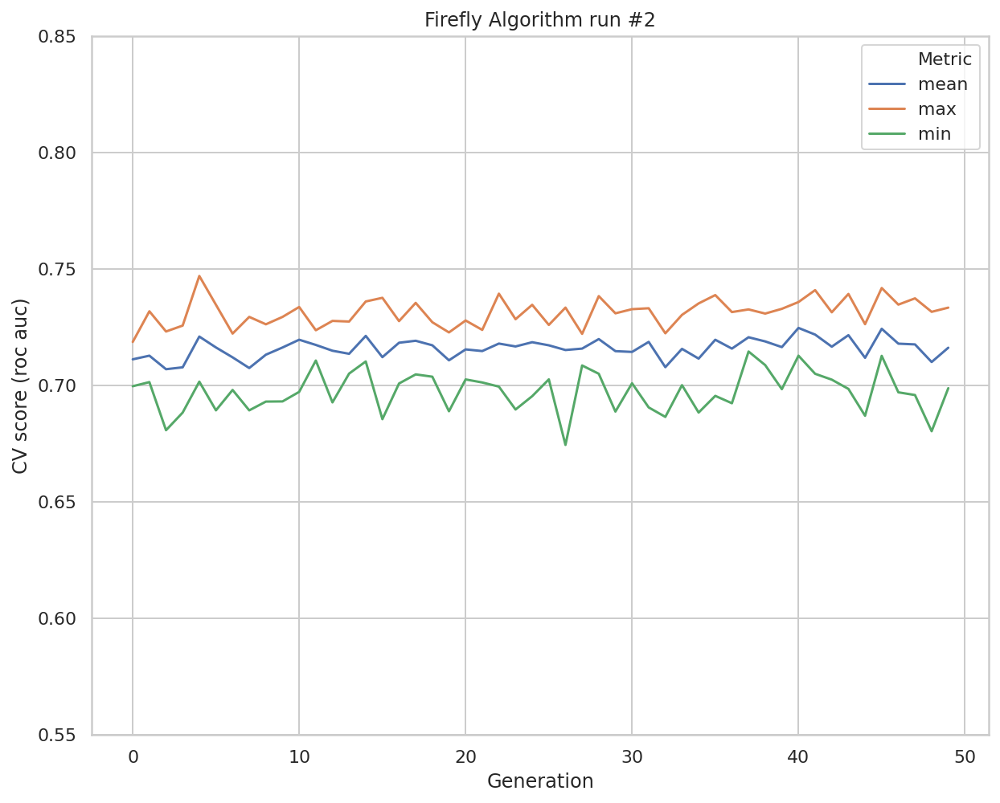

Score: 0.746926810277507
Number of features selected: 107



--------------
Run 3
--------------


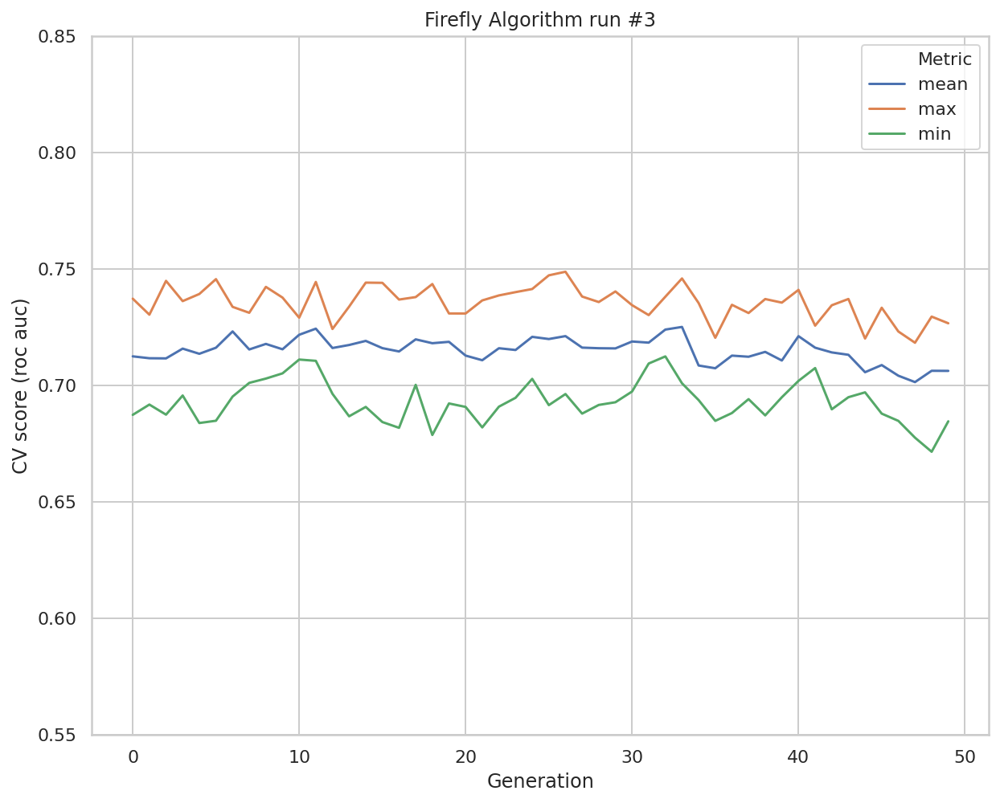

Score: 0.7487409027199018
Number of features selected: 116



--------------
Run 4
--------------


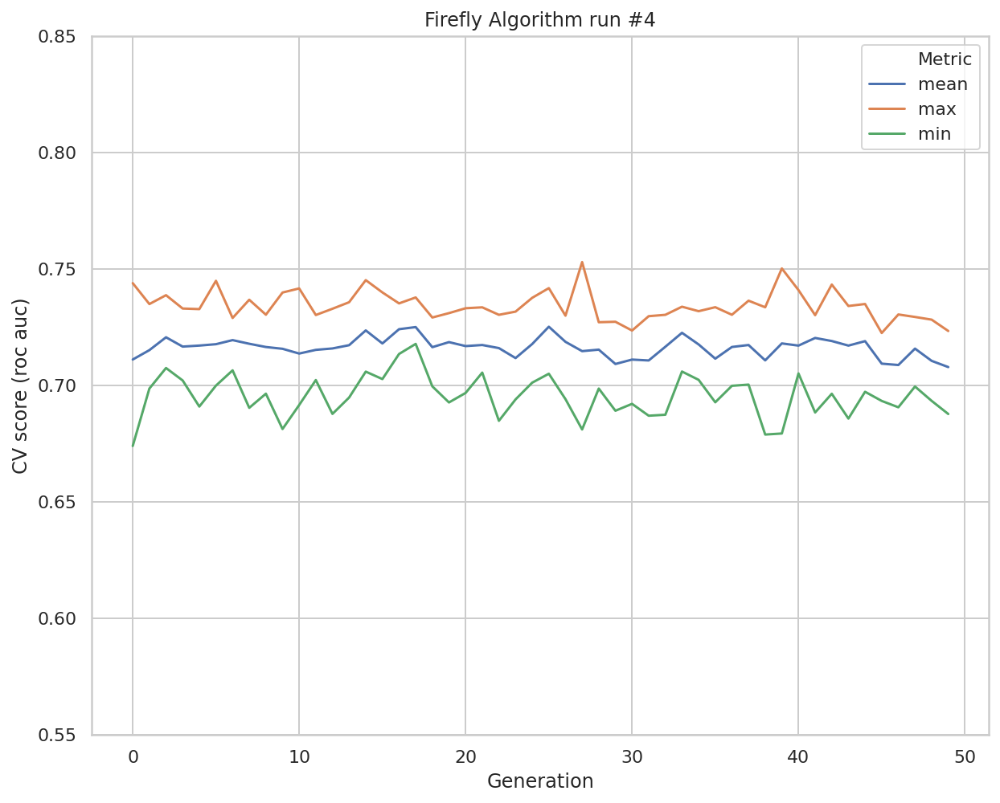

Score: 0.7528794883311779
Number of features selected: 126



--------------
Run 5
--------------


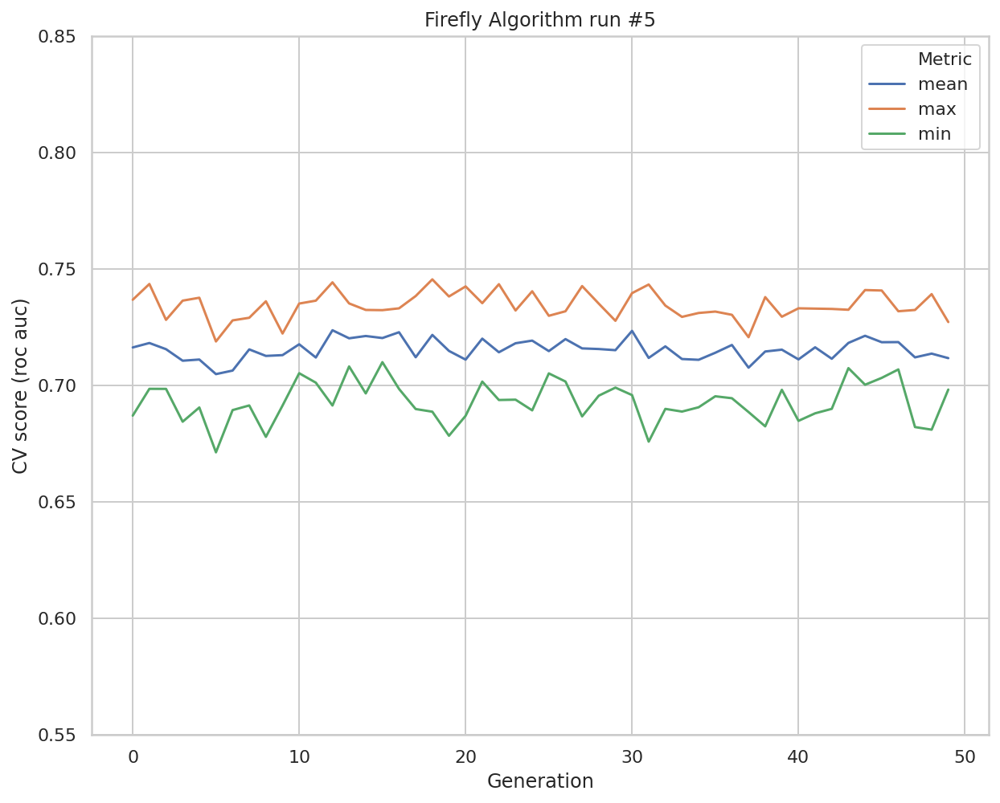

Score: 0.7454613128552874
Number of features selected: 117





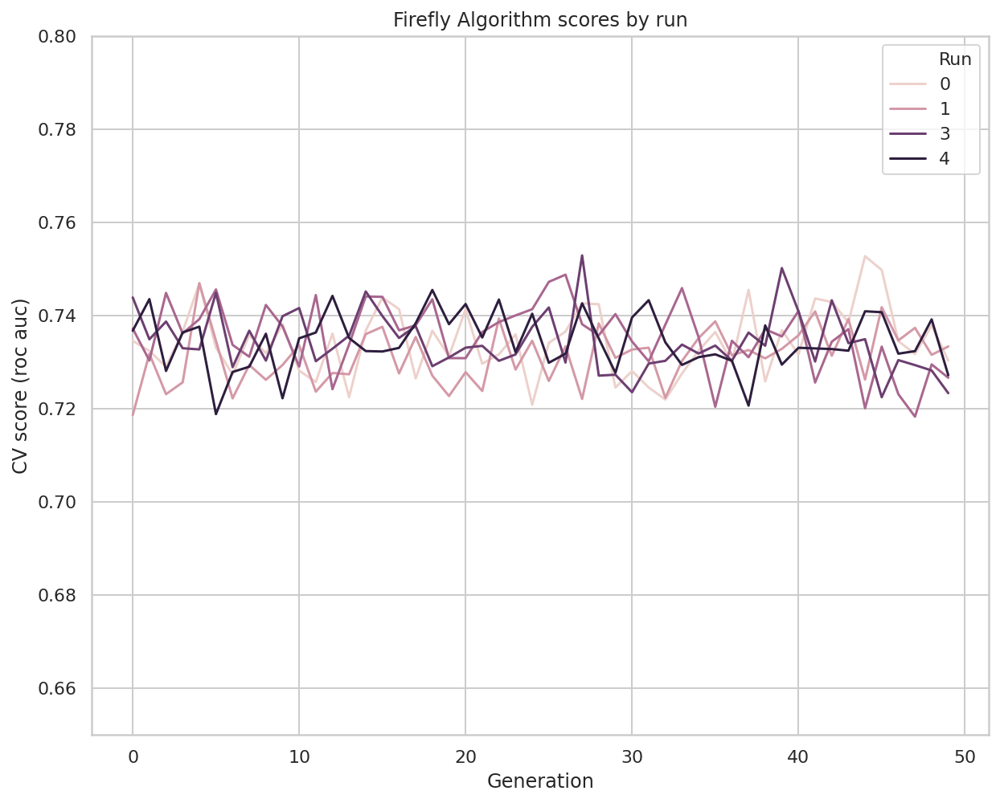

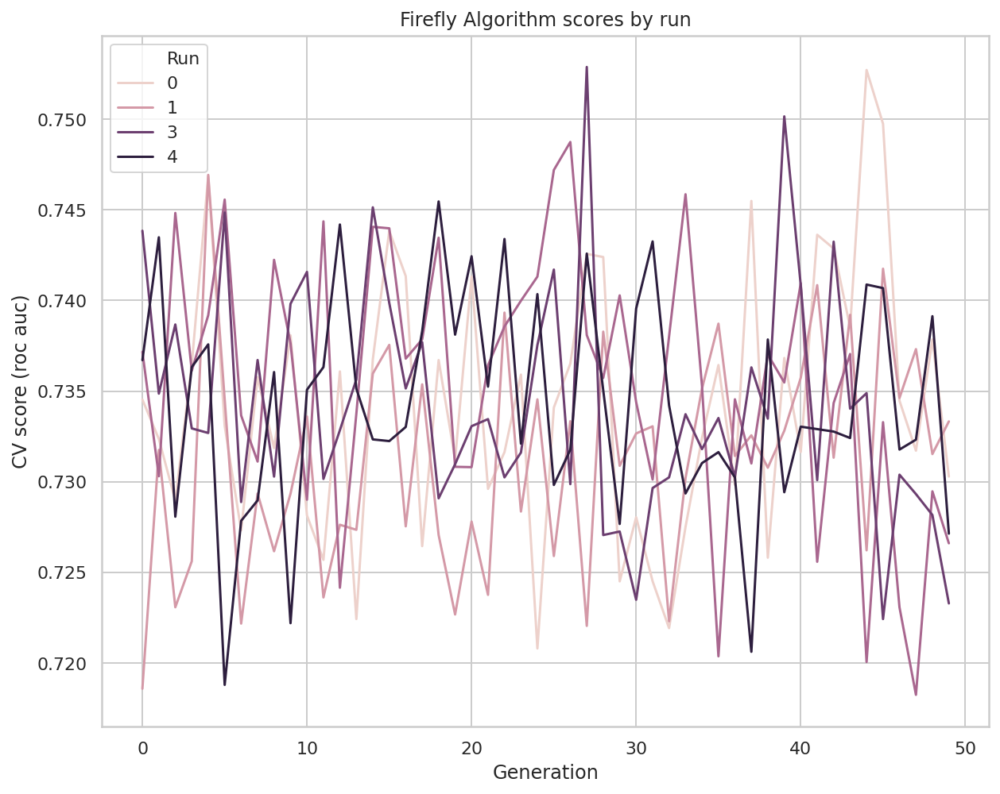


Mean score of 5 runs: 0.7493445092421801



Best score of 5 runs: 0.7528794883311779
Number of features selected: 126



FireflyAlgorithm
population_size=20
number_of_generations=50
--------------
Run 1
--------------


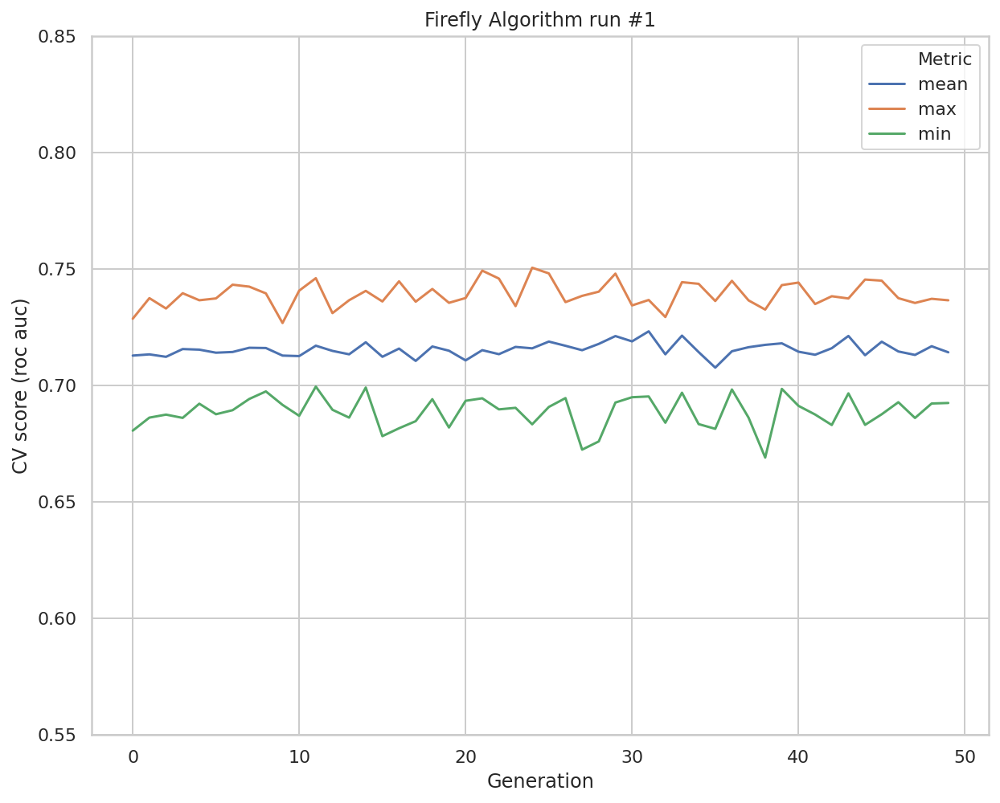

Score: 0.7504834642610525
Number of features selected: 120



--------------
Run 2
--------------


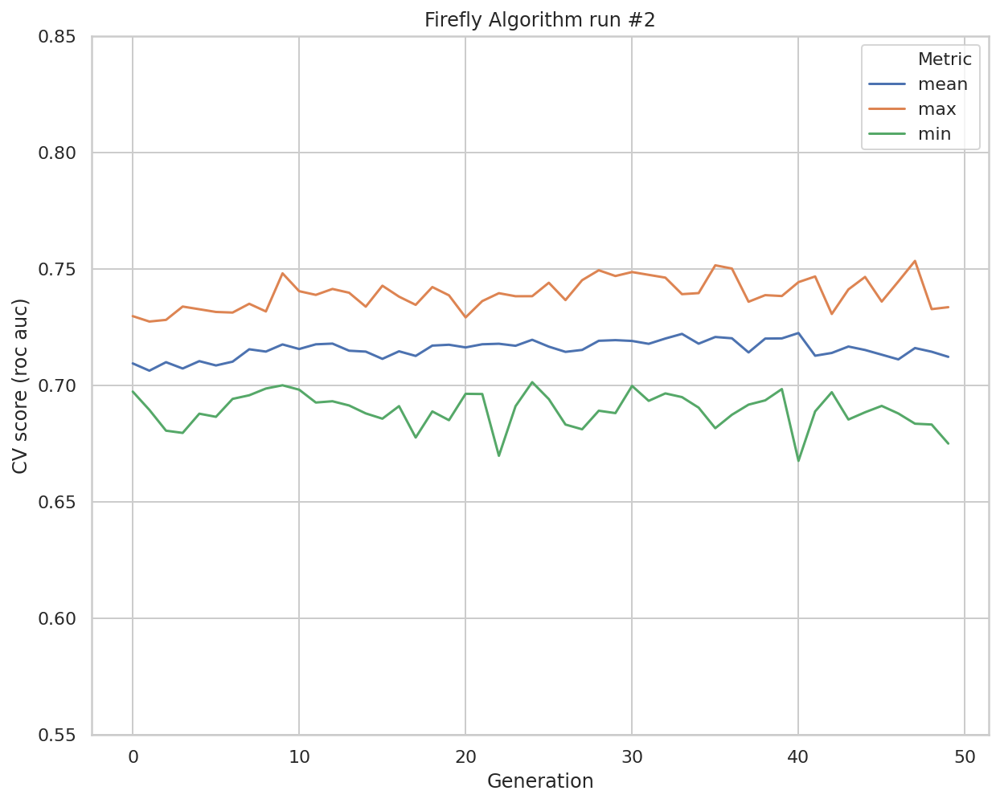

Score: 0.7533928876329072
Number of features selected: 123



--------------
Run 3
--------------


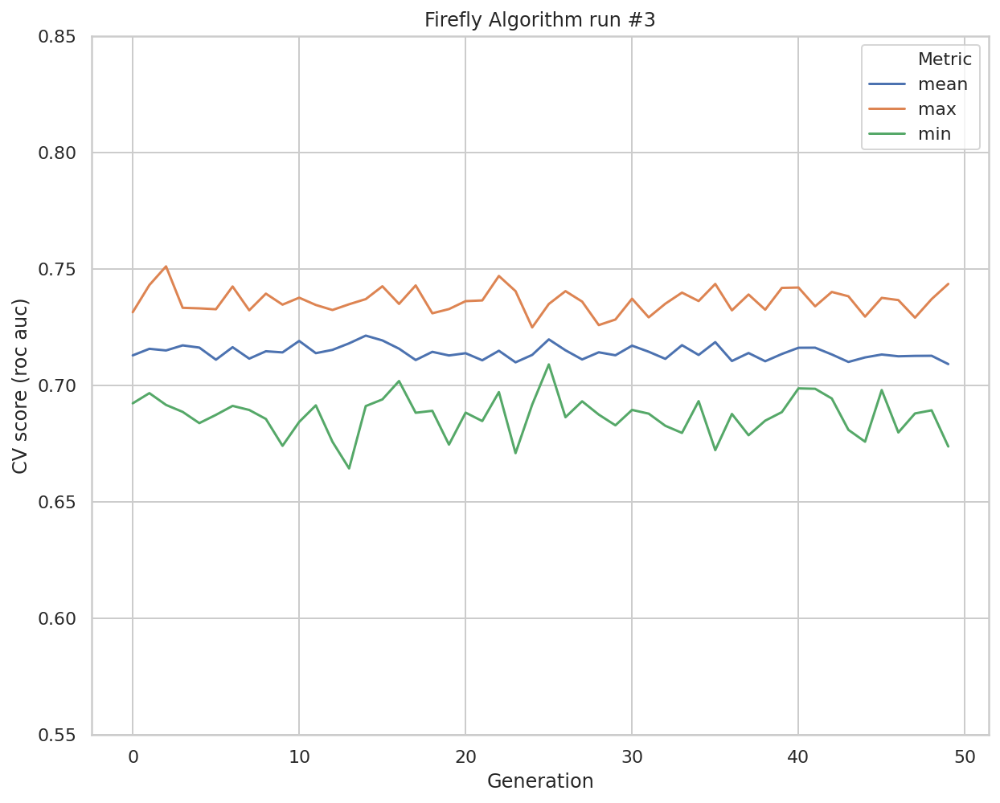

Score: 0.7510444708918255
Number of features selected: 128



--------------
Run 4
--------------


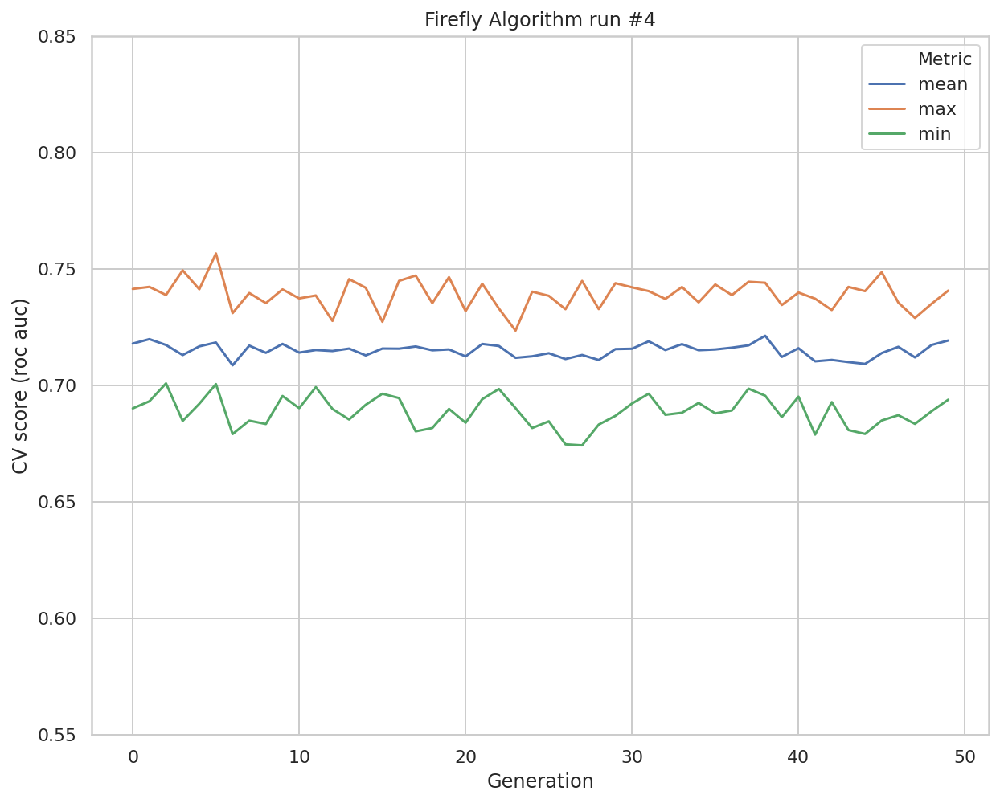

Score: 0.7565772259203919
Number of features selected: 106



--------------
Run 5
--------------


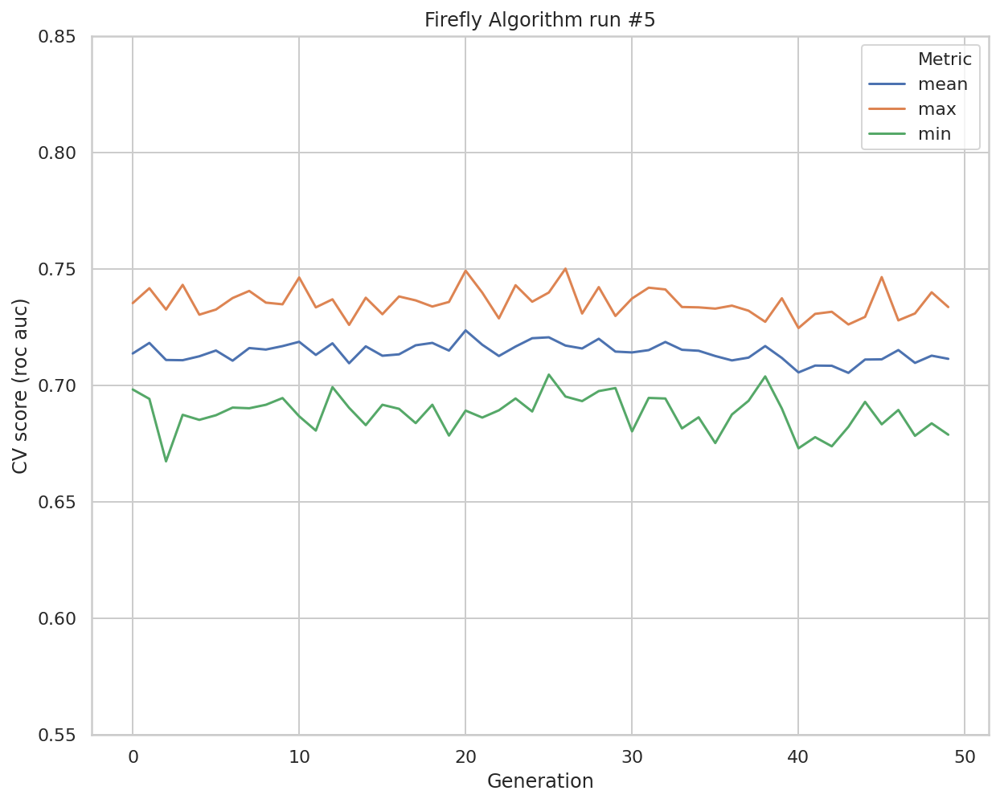

Score: 0.7500788677678984
Number of features selected: 111





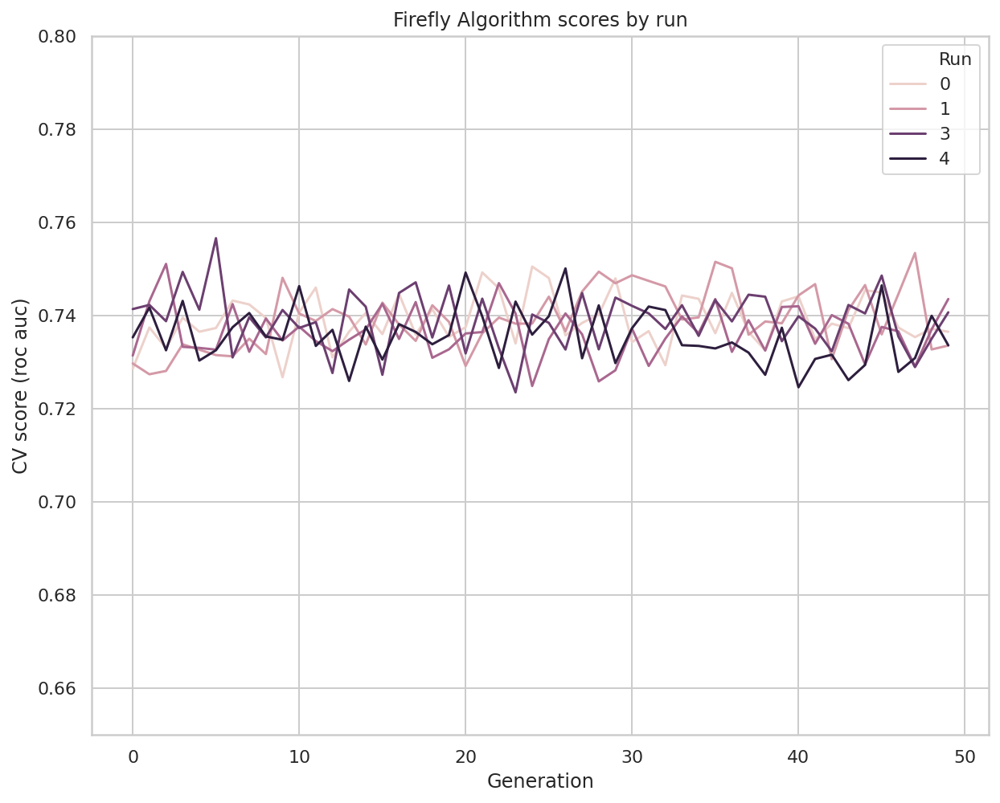

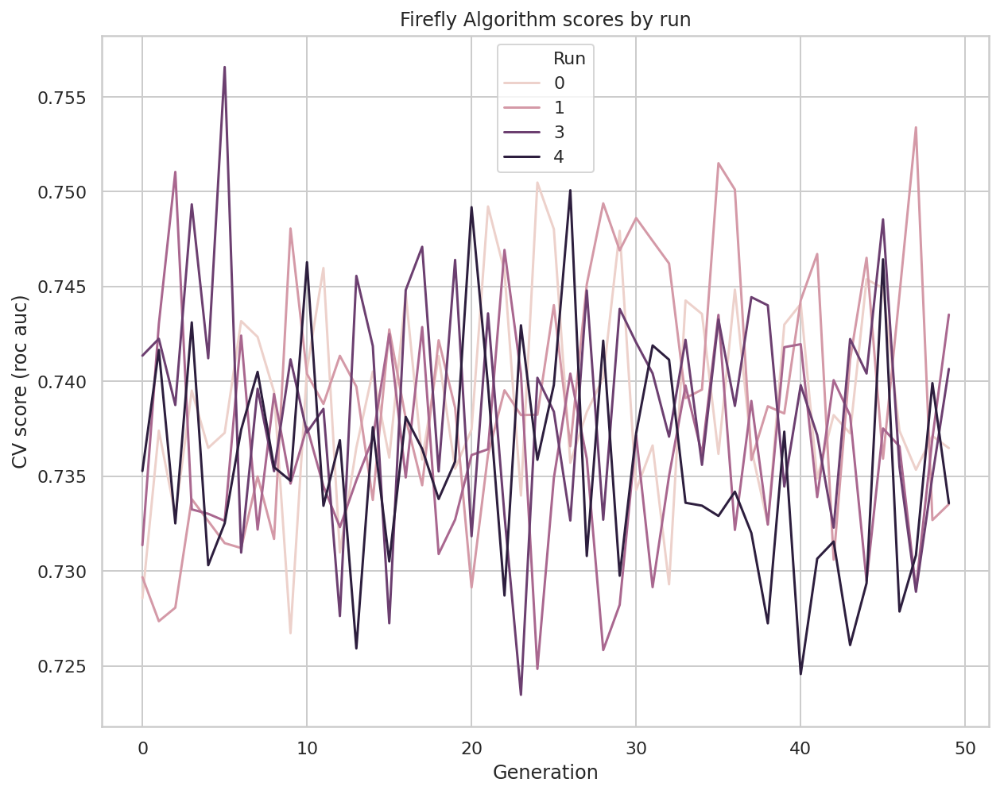


Mean score of 5 runs: 0.7523153832948151



Best score of 5 runs: 0.7565772259203919
Number of features selected: 106



FireflyAlgorithm
population_size=50
number_of_generations=50
--------------
Run 1
--------------


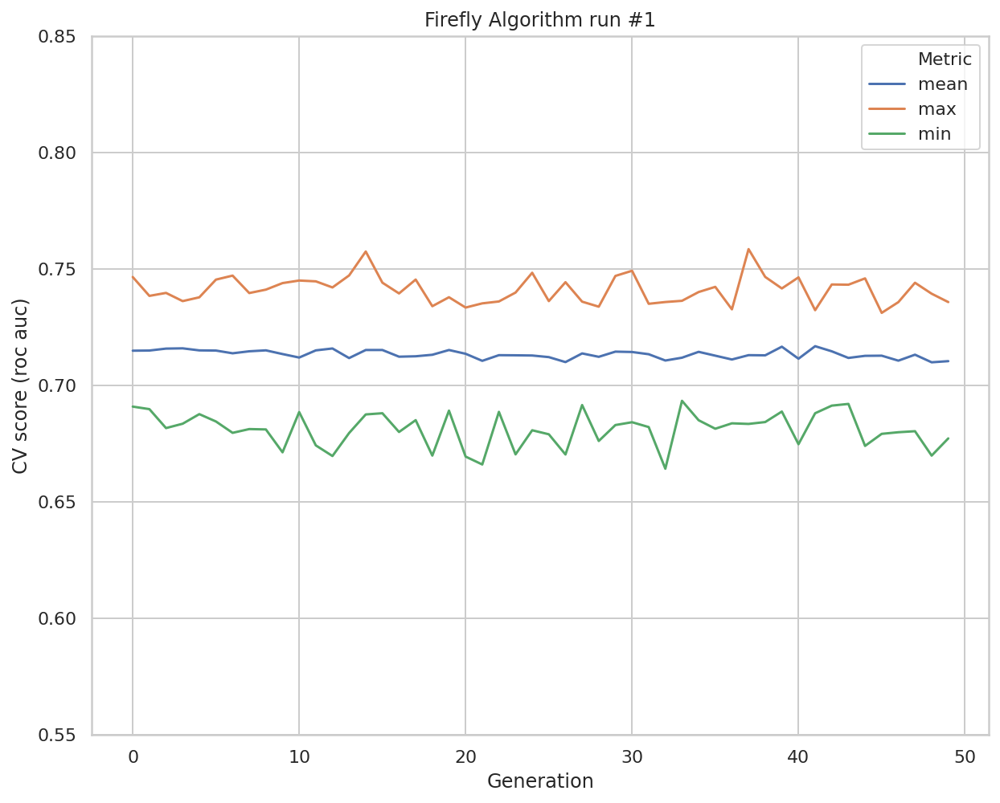

Score: 0.7584658655207278
Number of features selected: 117



--------------
Run 2
--------------


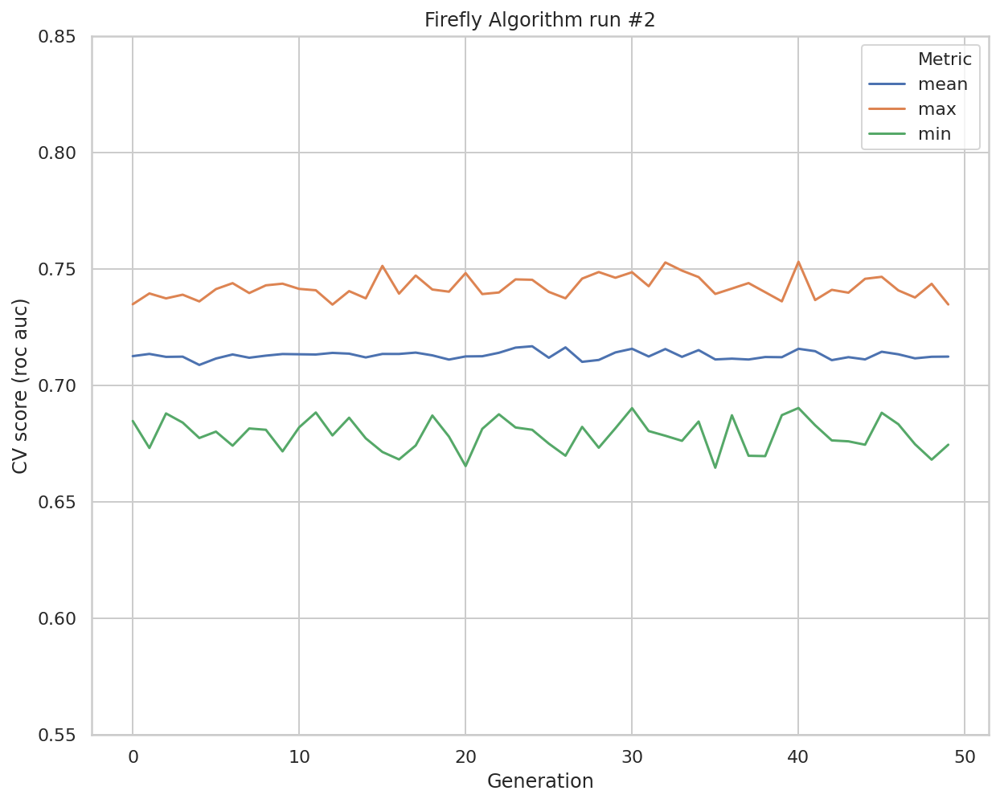

Score: 0.7530375275363493
Number of features selected: 133



--------------
Run 3
--------------


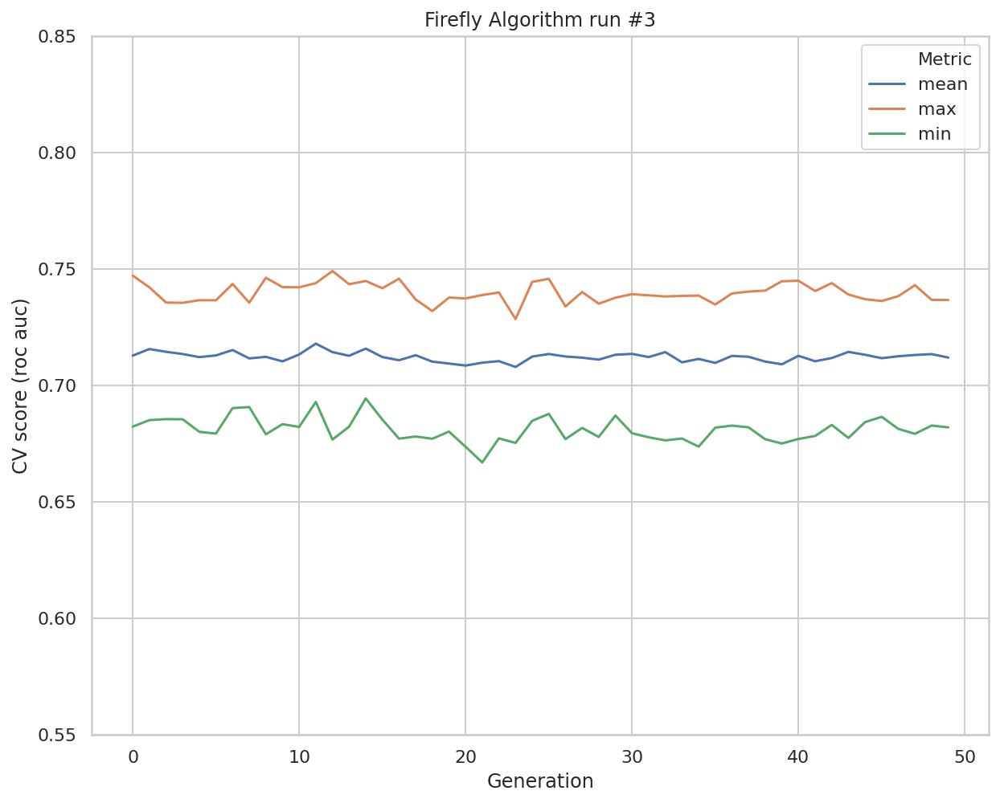

Score: 0.749057245800297
Number of features selected: 114



--------------
Run 4
--------------


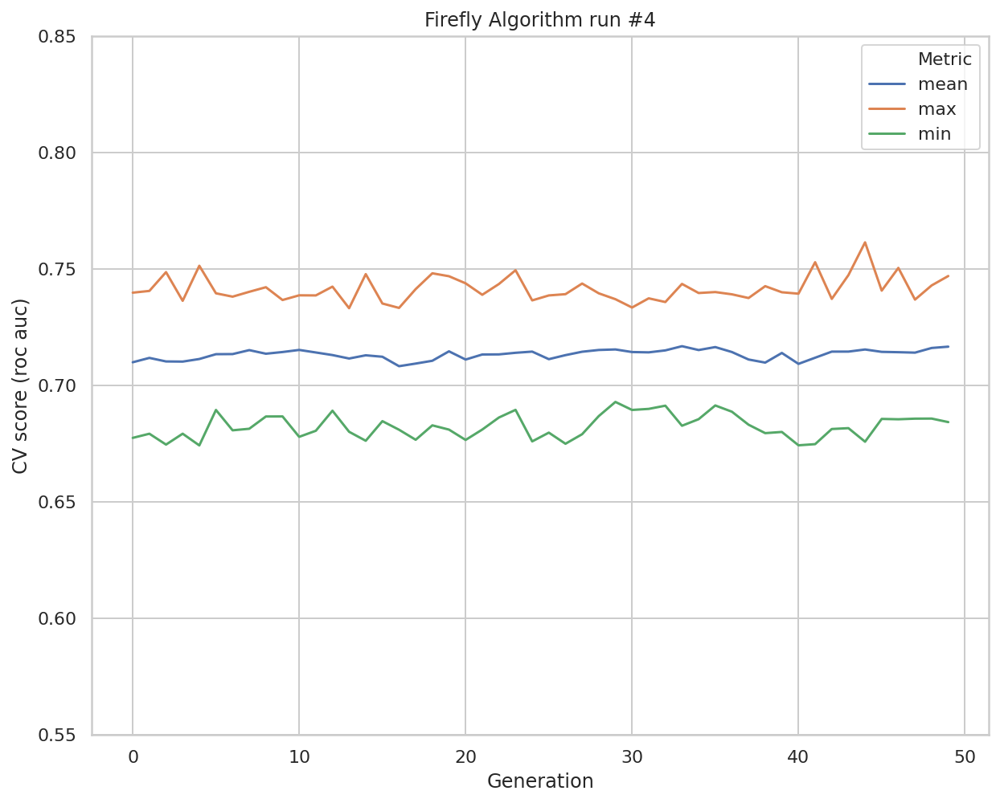

Score: 0.7613712931136523
Number of features selected: 114



--------------
Run 5
--------------


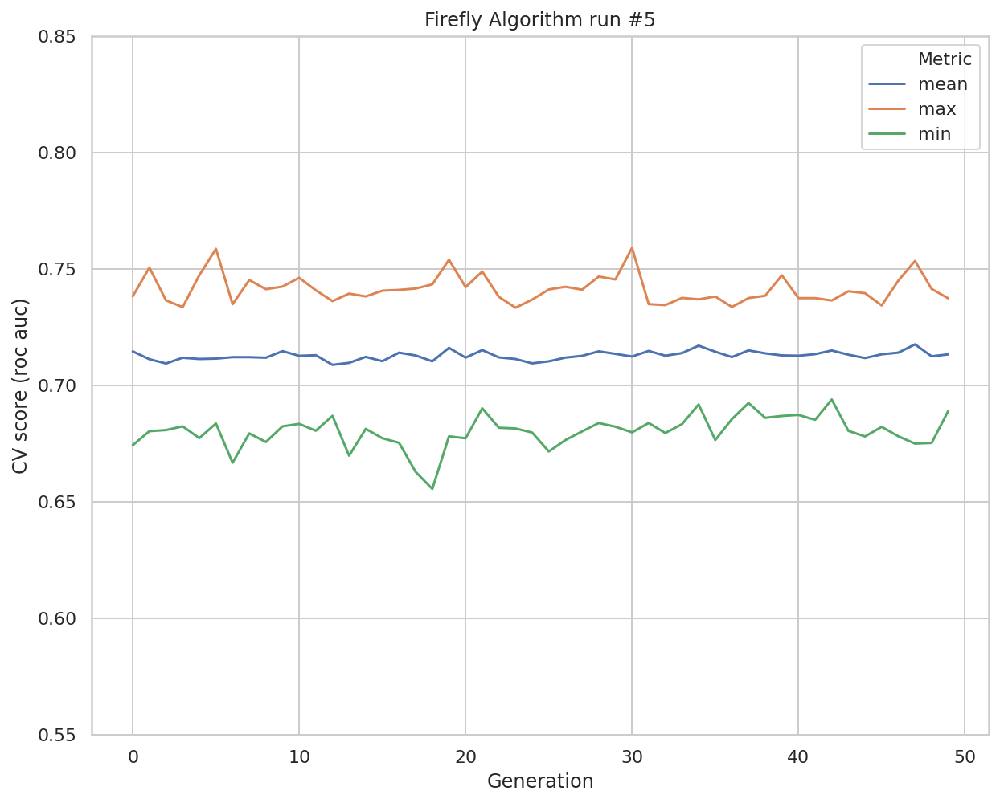

Score: 0.7590406862241115
Number of features selected: 109





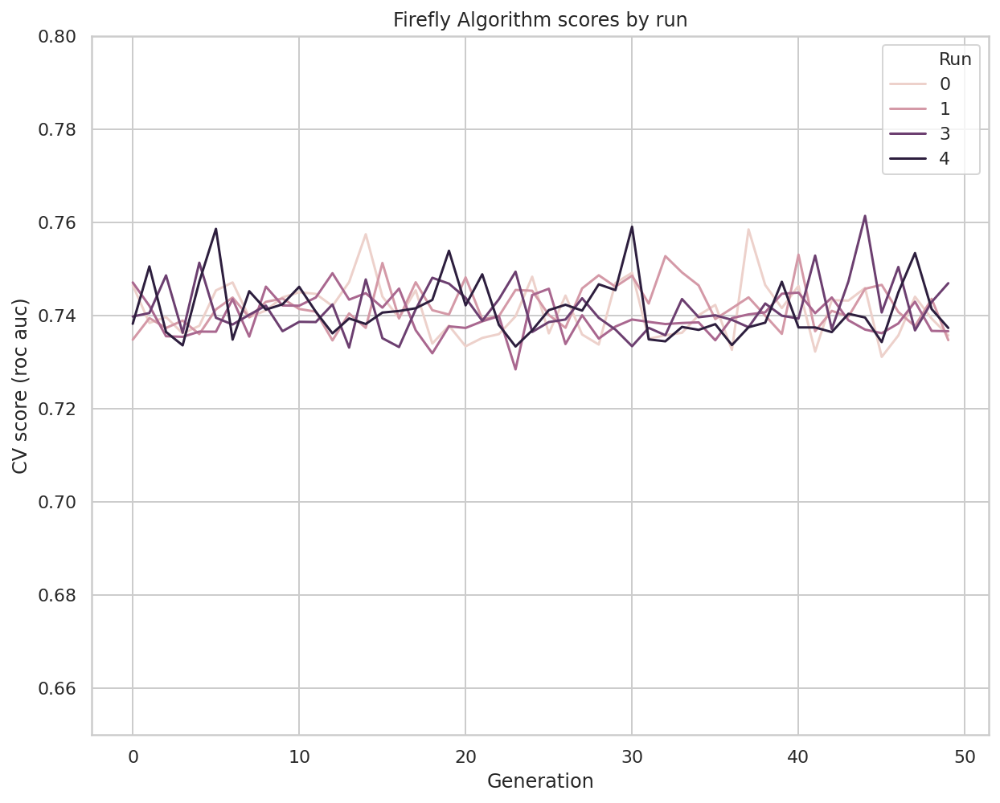

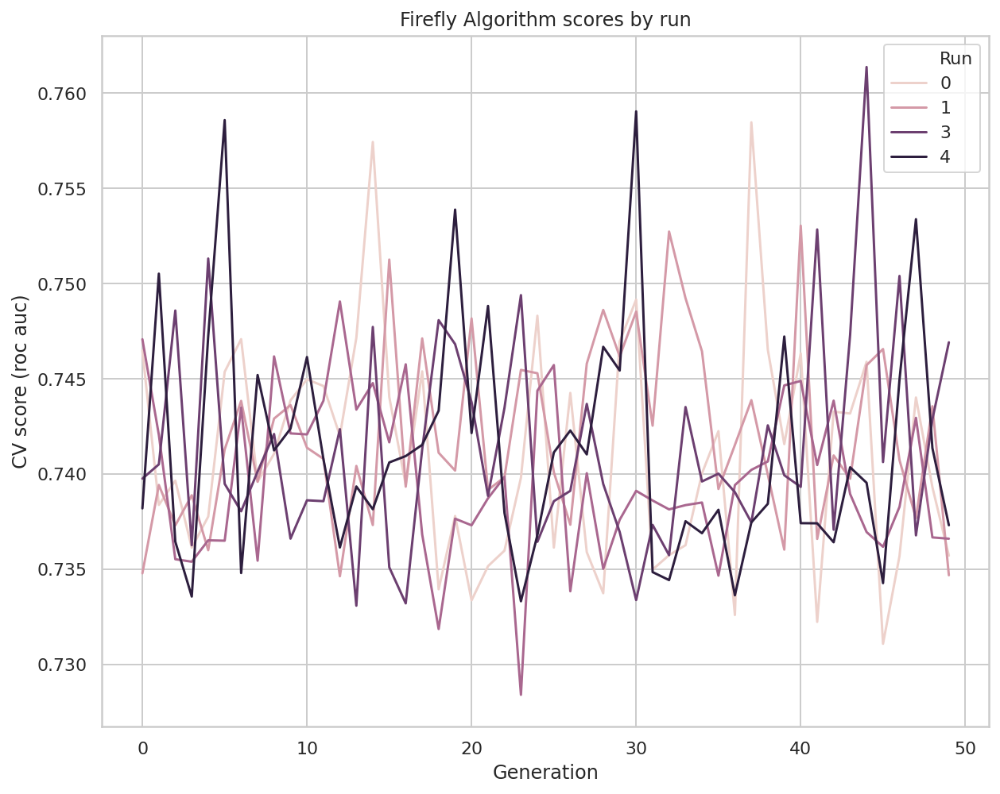


Mean score of 5 runs: 0.7561945236390275



Best score of 5 runs: 0.7613712931136523
Number of features selected: 114



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
The best score is 0.7613712931136523 with population_size=50

CPU times: user 42min 24s, sys: 3.21 s, total: 42min 28s
Wall time: 42min 28s


In [21]:
%%time

from NiaPy.algorithms.basic import FireflyAlgorithm


scores_by_run, _, overall_best_features, _, selected_features = run_experiment(FireflyAlgorithm())

scores_by_algorithm['FireflyAlgorithm'] = scores_by_run
selected_features_by_algorithm['FireflyAlgorithm'] = selected_features

not fraud
precision: 0.6956521739130435
recall: 0.974910394265233
f1-score: 0.8119402985074626
support: 279


is fraud
precision: 0.631578947368421
recall: 0.0916030534351145
f1-score: 0.16
support: 131


accuracy: 0.6926829268292682


macro avg
precision: 0.6636155606407322
recall: 0.5332567238501738
f1-score: 0.48597014925373133
support: 410


weighted avg
precision: 0.675179996651225
recall: 0.6926829268292682
f1-score: 0.6036374226428831
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.6636155606407322


CPU times: user 124 ms, sys: 15.2 ms, total: 139 ms
Wall time: 128 ms


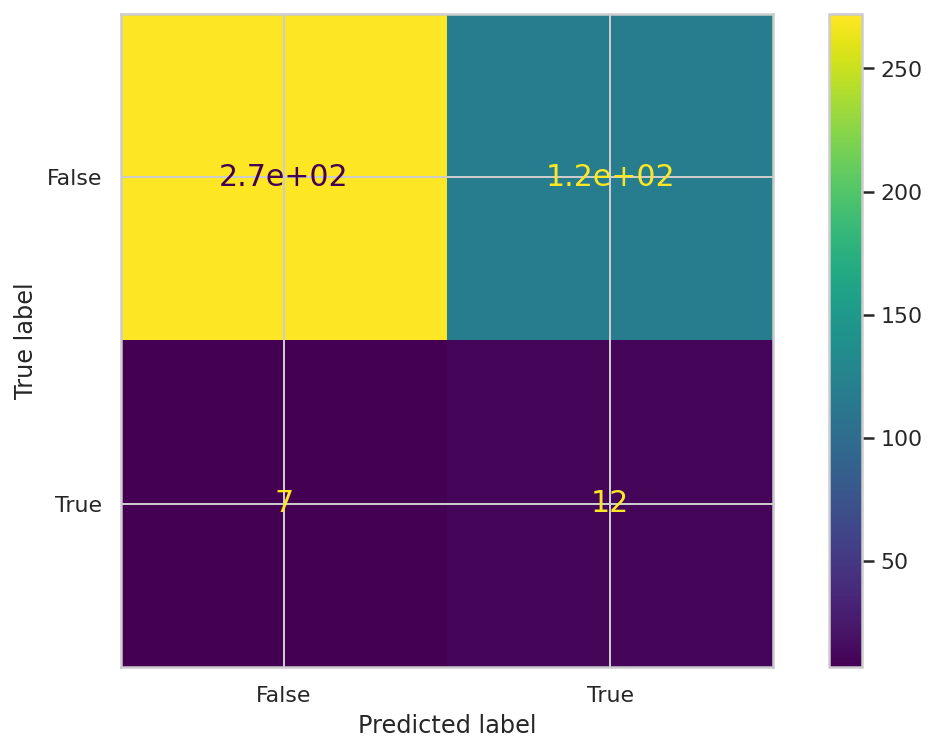

In [22]:
%%time

clf = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf = clf.fit(x_train[overall_best_features], y_train)

custom_classification_report(clf, x_test[overall_best_features], y_test)

### Cuckoo Search Algorithm

[Cuckoo Search Algorithm](https://github.com/NiaOrg/NiaPy/blob/master/NiaPy/algorithms/basic/cs.py) default parameters:
- pa = 0.2
- alpha = 0.5

CuckooSearch
population_size=10
number_of_generations=50
--------------
Run 1
--------------


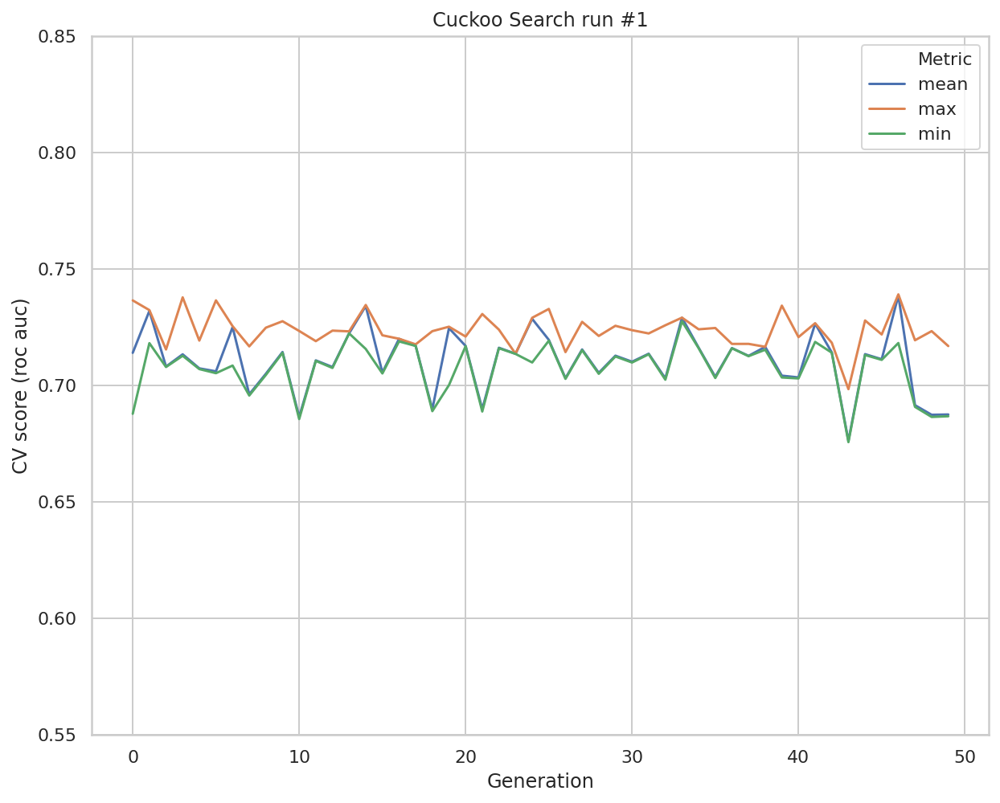

Score: 0.7390109133256852
Number of features selected: 132



--------------
Run 2
--------------


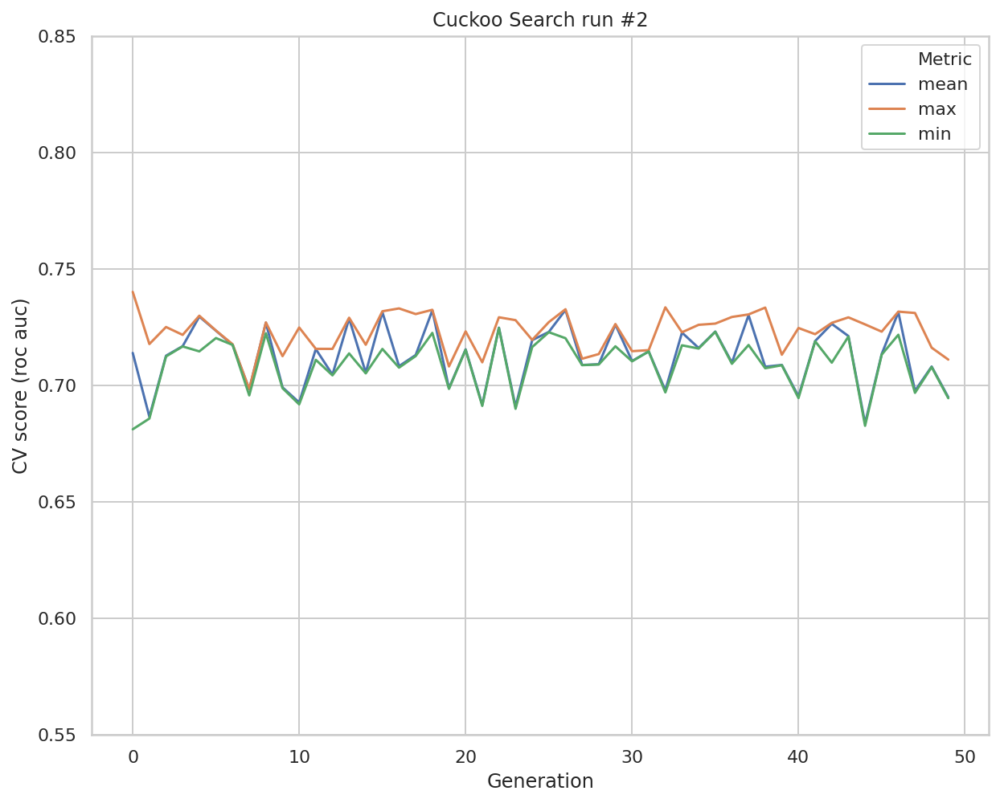

Score: 0.7400896220936668
Number of features selected: 121



--------------
Run 3
--------------


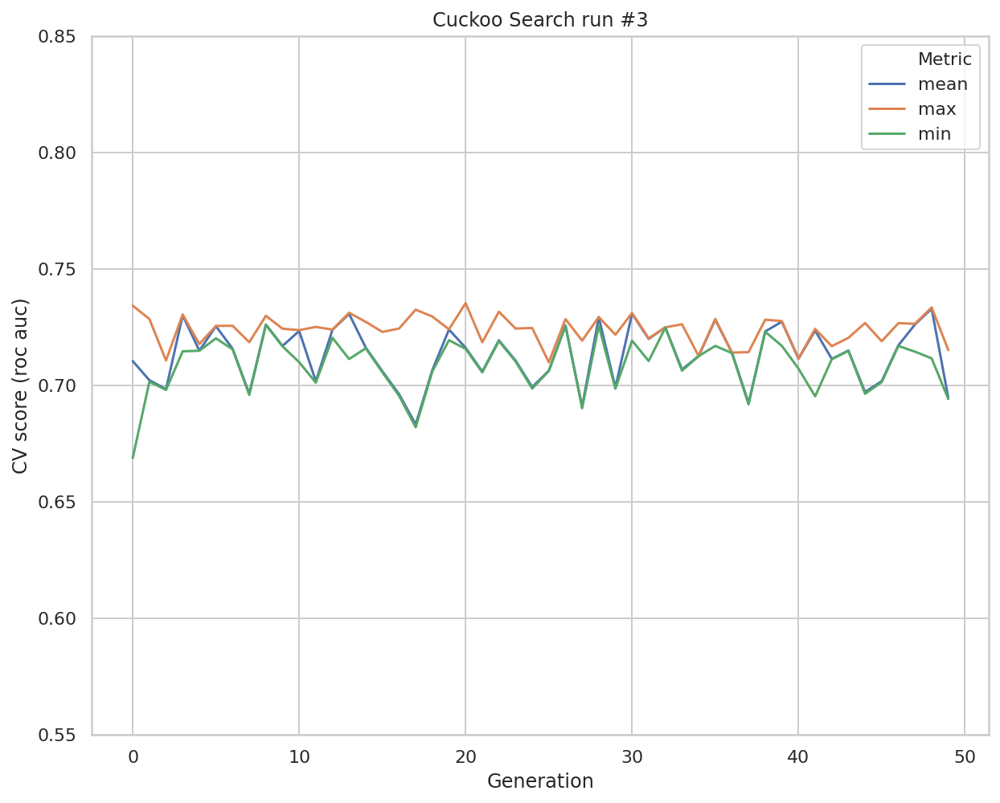

Score: 0.7352741889343166
Number of features selected: 221



--------------
Run 4
--------------


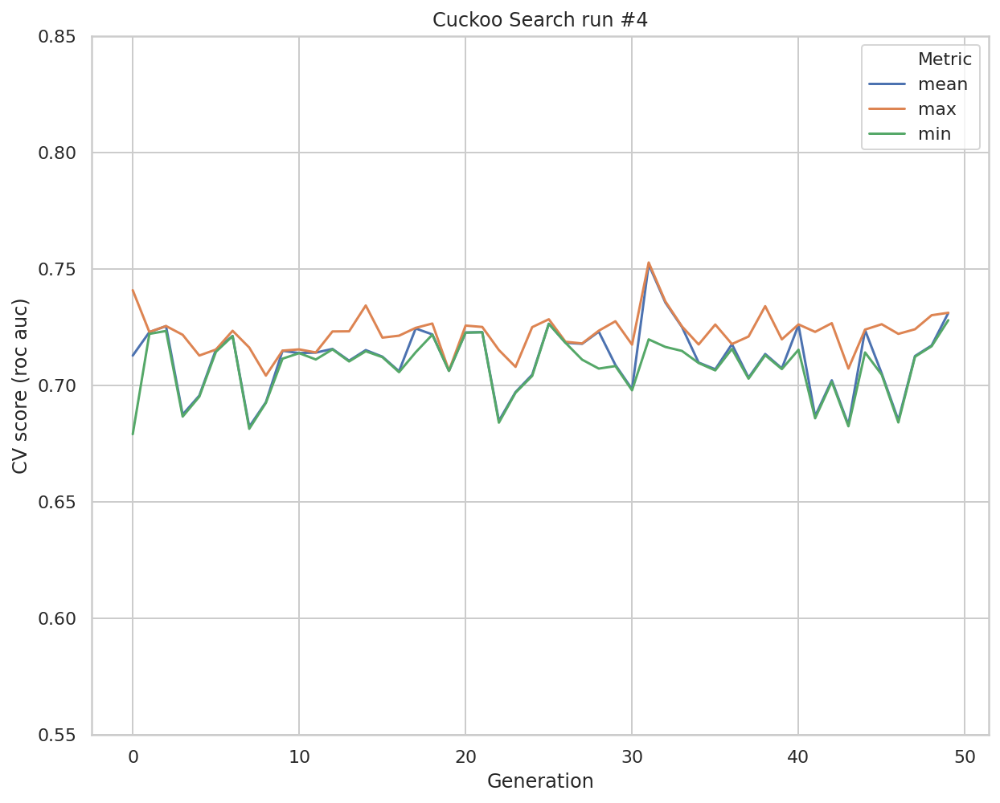

Score: 0.7527099836579665
Number of features selected: 105



--------------
Run 5
--------------


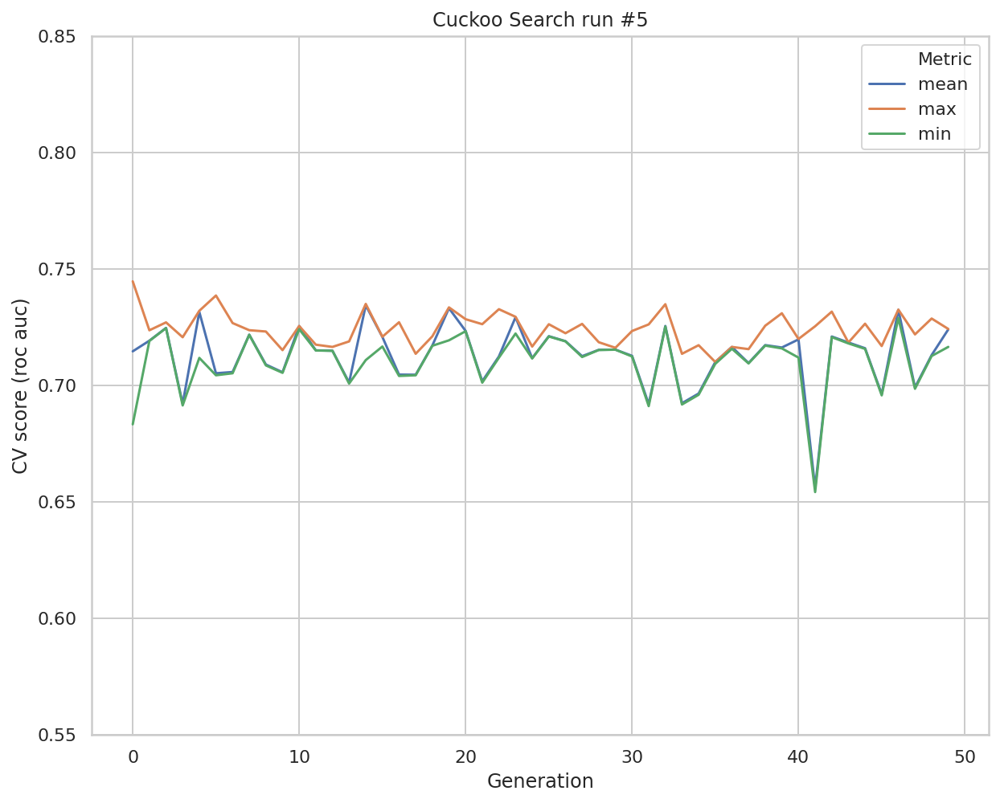

Score: 0.7446204269588284
Number of features selected: 120





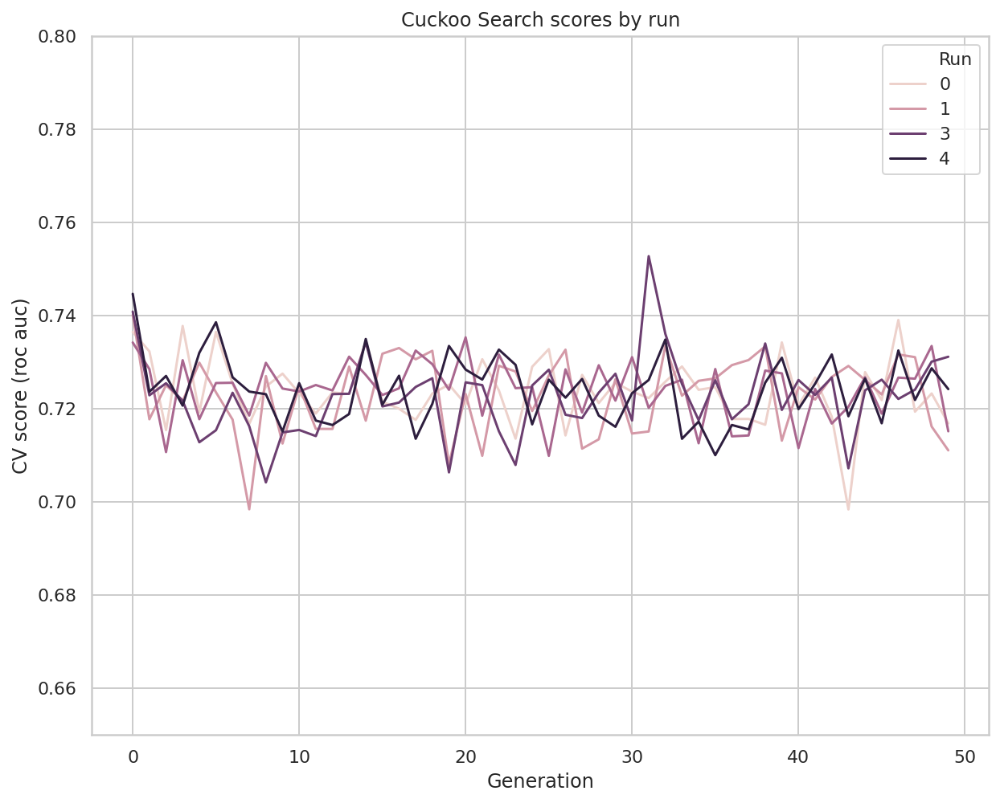

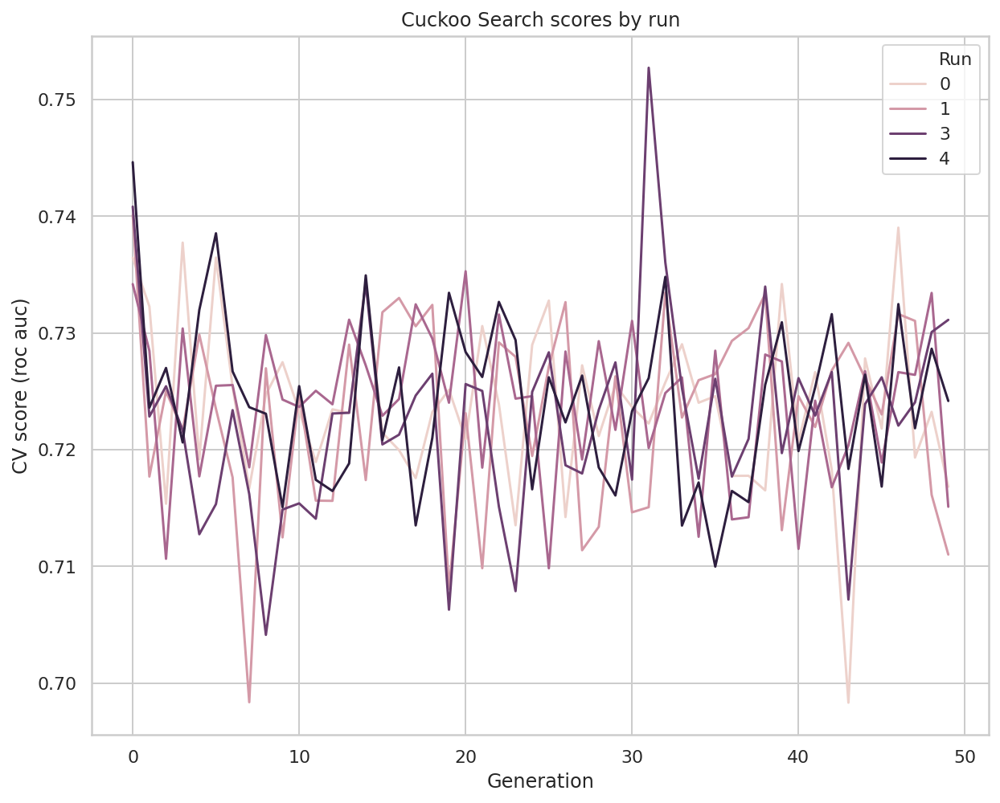


Mean score of 5 runs: 0.7423410269940927



Best score of 5 runs: 0.7527099836579665
Number of features selected: 105



CuckooSearch
population_size=20
number_of_generations=50
--------------
Run 1
--------------


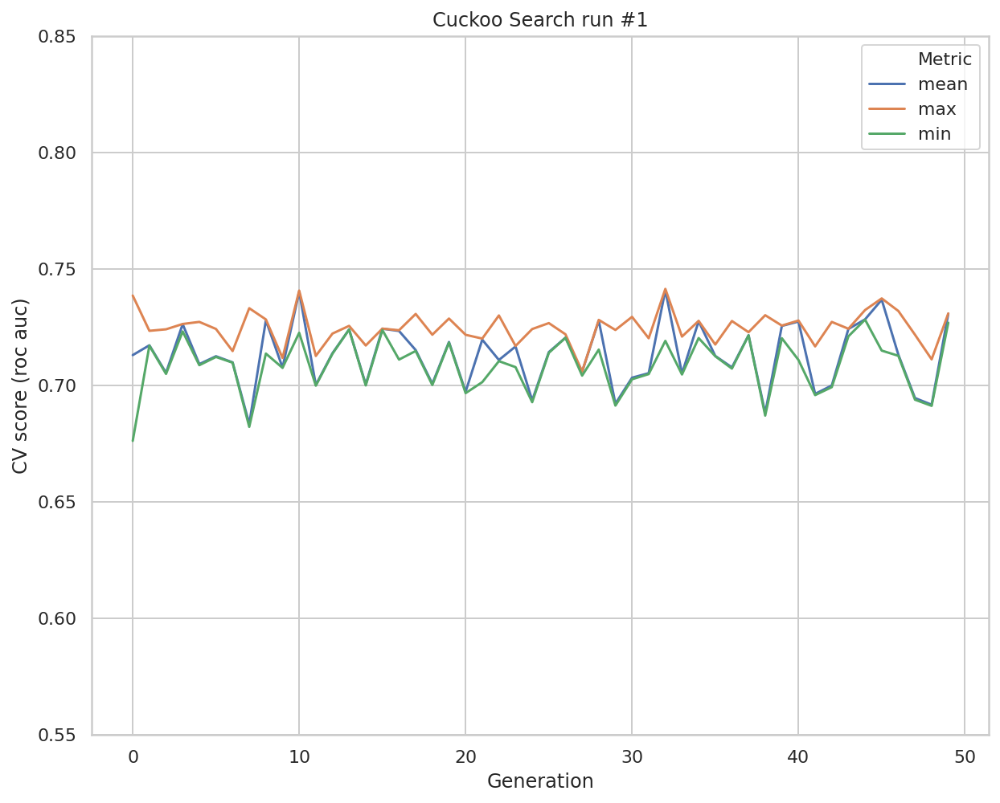

Score: 0.7413695477330166
Number of features selected: 123



--------------
Run 2
--------------


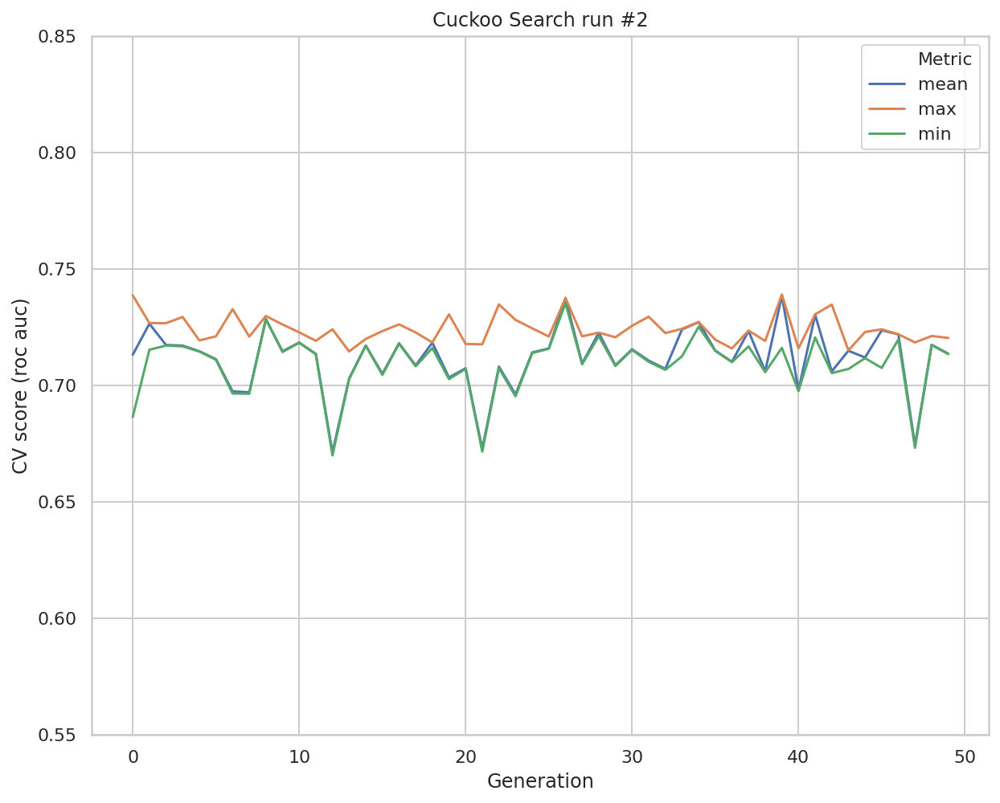

Score: 0.7389705878242822
Number of features selected: 118



--------------
Run 3
--------------


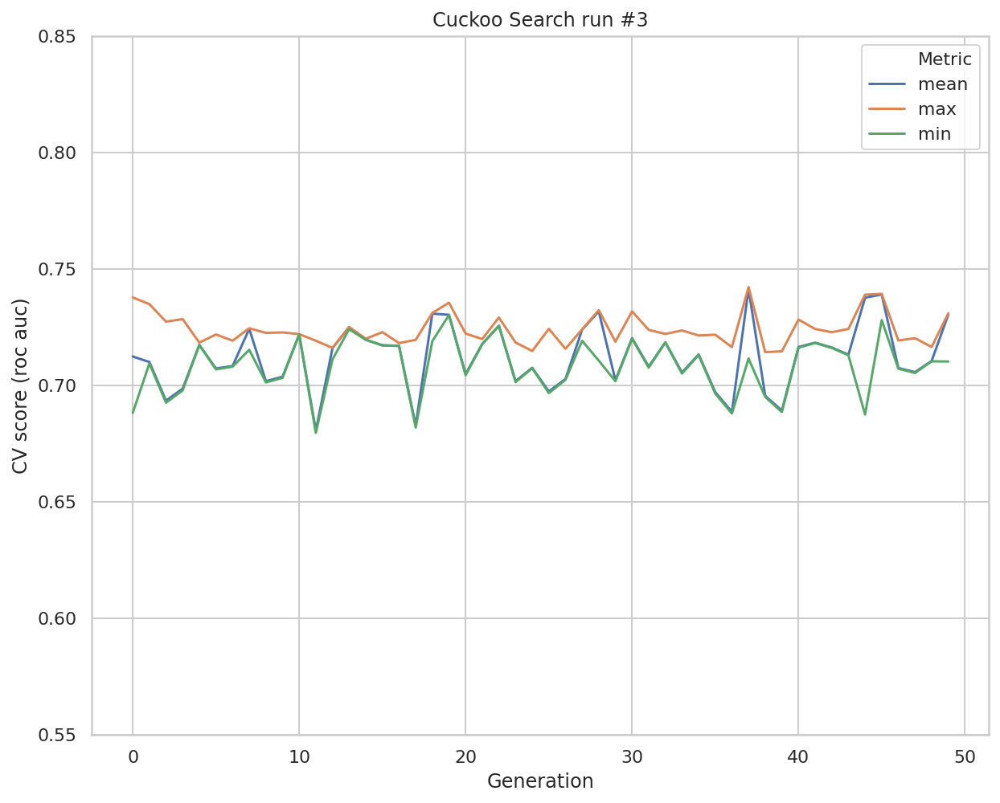

Score: 0.7421628977680588
Number of features selected: 125



--------------
Run 4
--------------


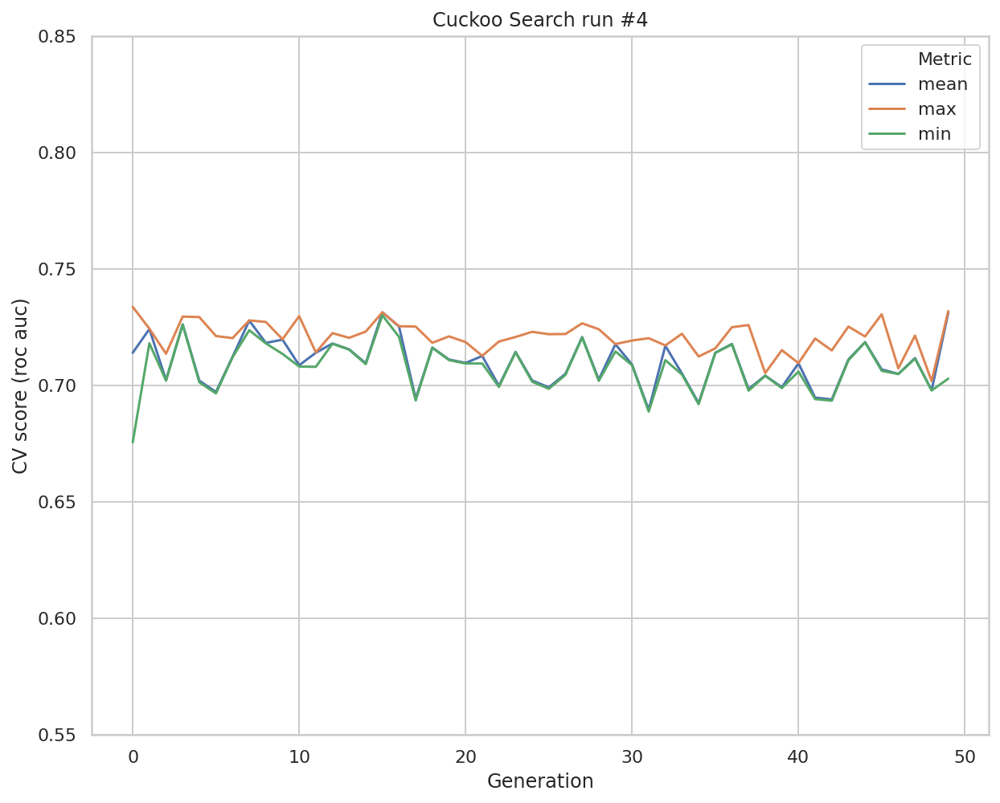

Score: 0.7336412912218256
Number of features selected: 119



--------------
Run 5
--------------


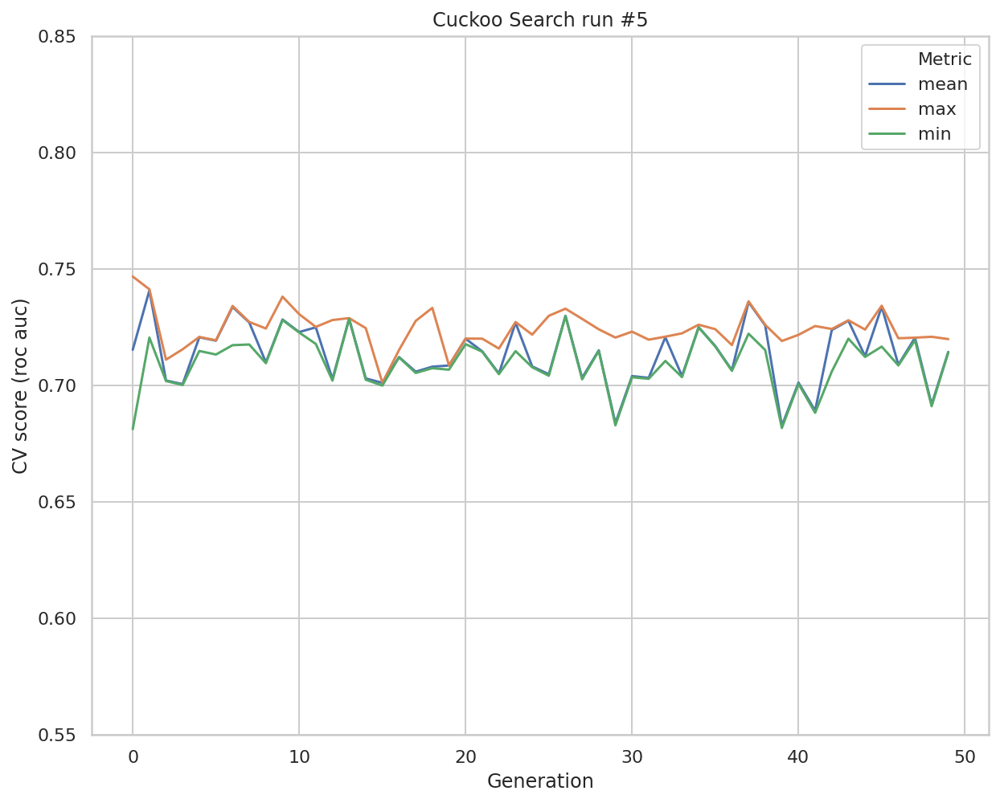

Score: 0.7466950042656451
Number of features selected: 118





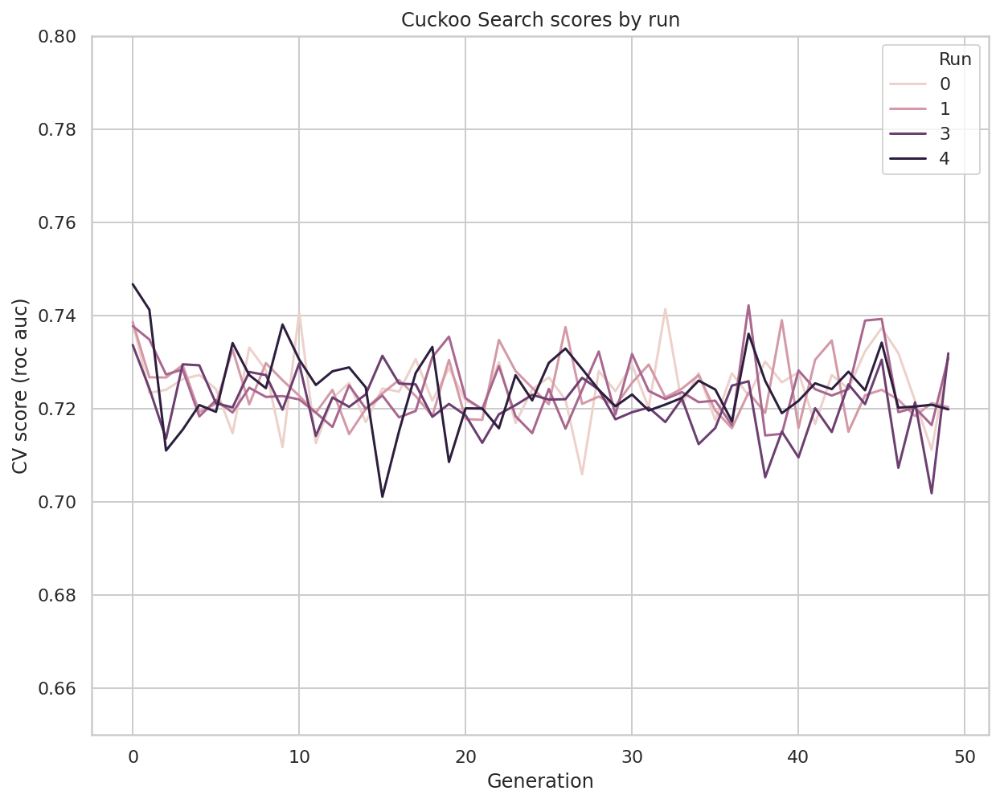

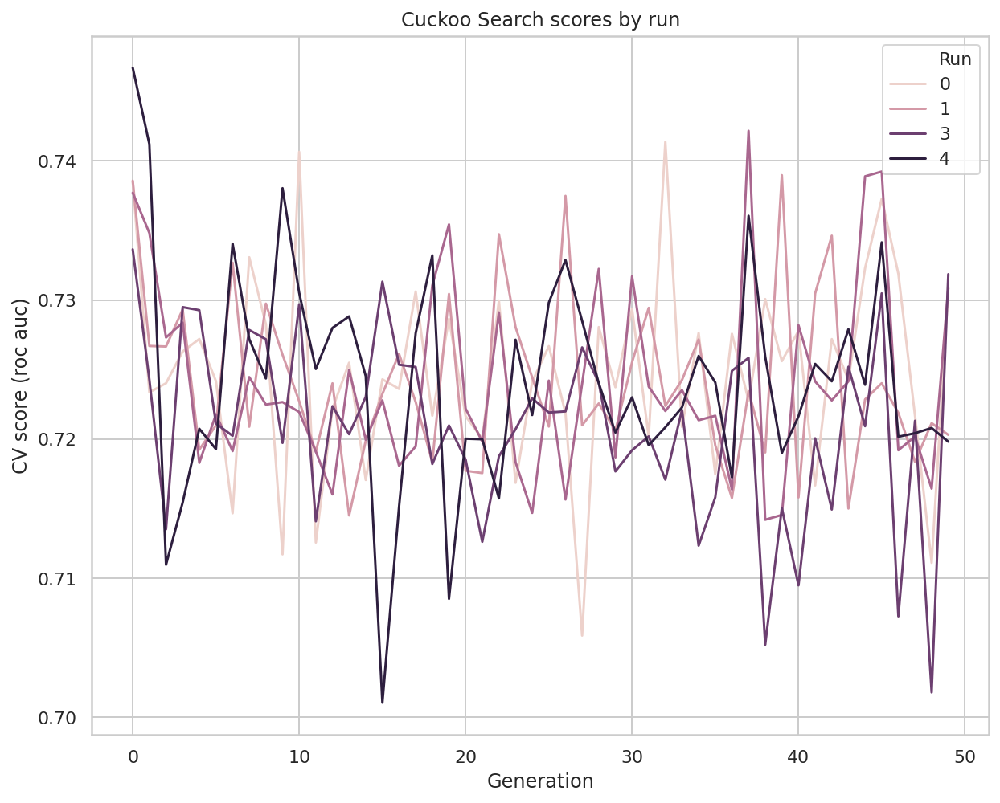


Mean score of 5 runs: 0.7405678657625656



Best score of 5 runs: 0.7466950042656451
Number of features selected: 118



CuckooSearch
population_size=50
number_of_generations=50
--------------
Run 1
--------------


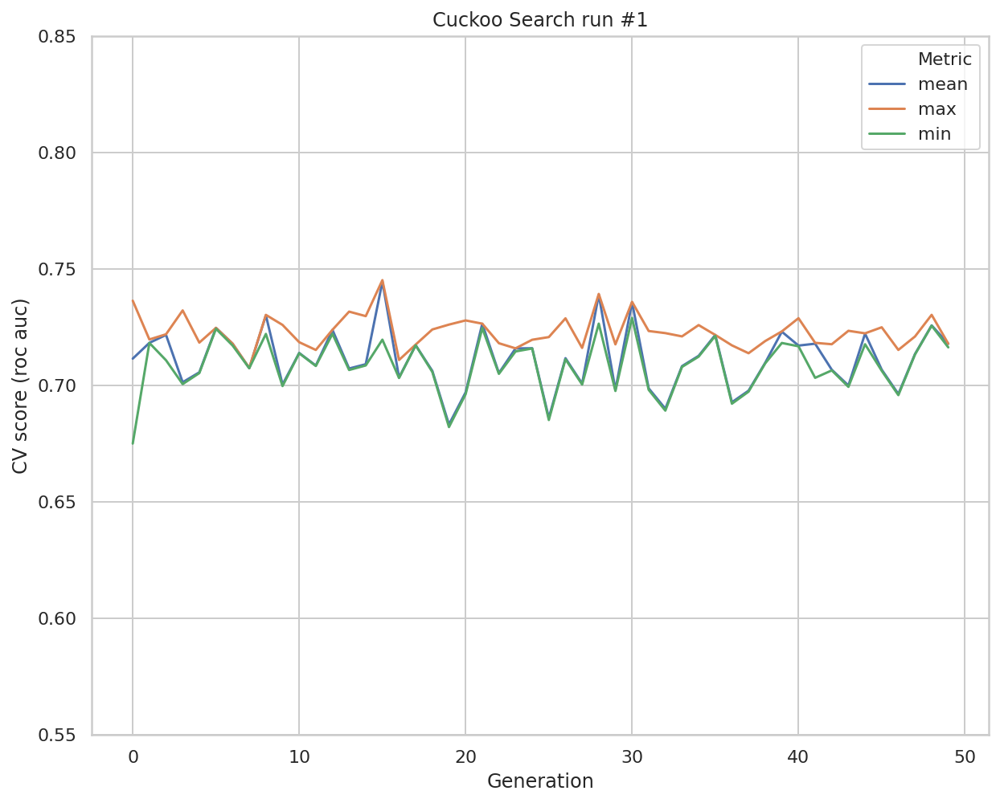

Score: 0.7451310295243544
Number of features selected: 122



--------------
Run 2
--------------


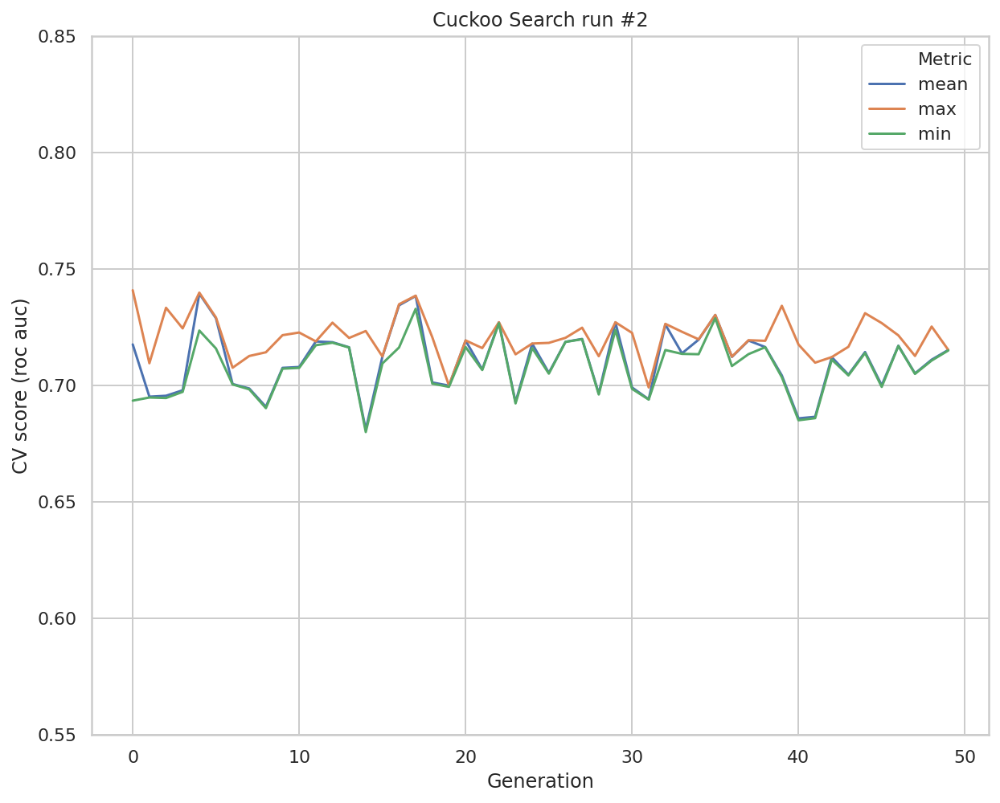

Score: 0.7407976795833374
Number of features selected: 108



--------------
Run 3
--------------


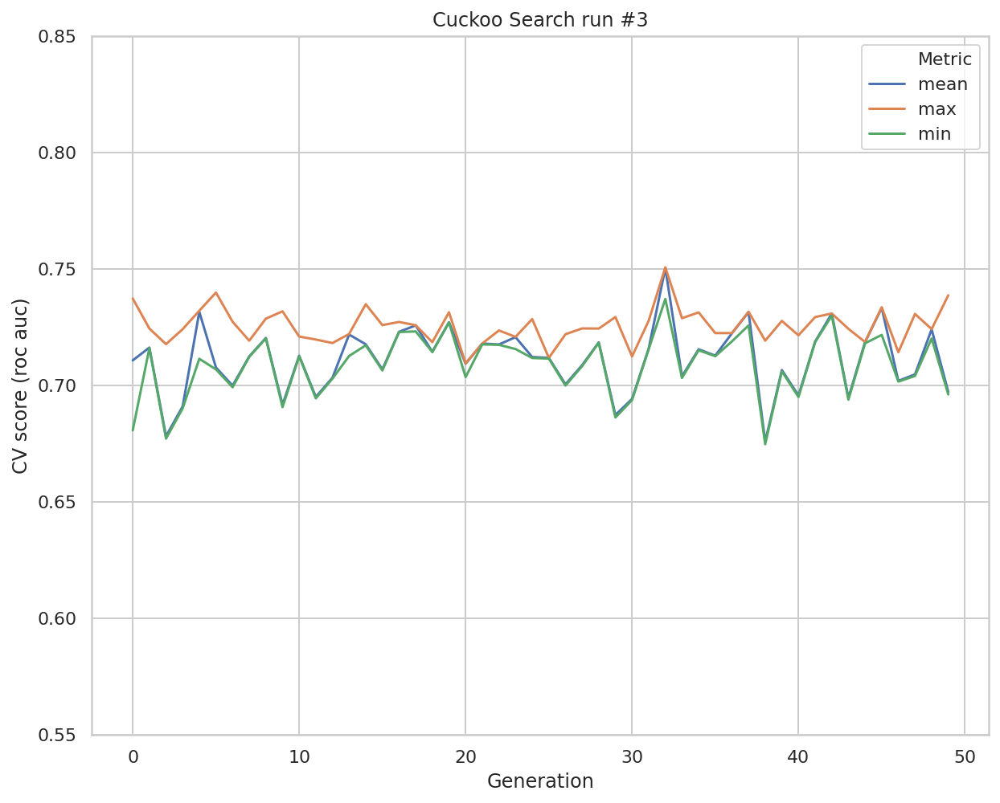

Score: 0.7506184001267453
Number of features selected: 106



--------------
Run 4
--------------


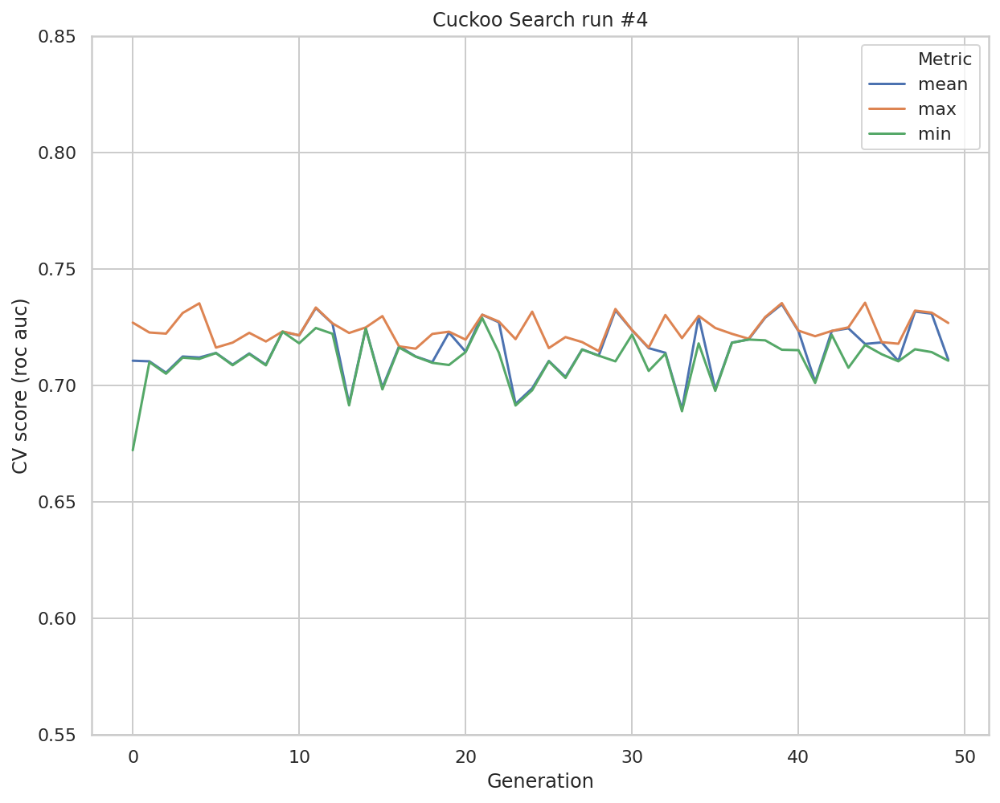

Score: 0.7354367330665029
Number of features selected: 224



--------------
Run 5
--------------


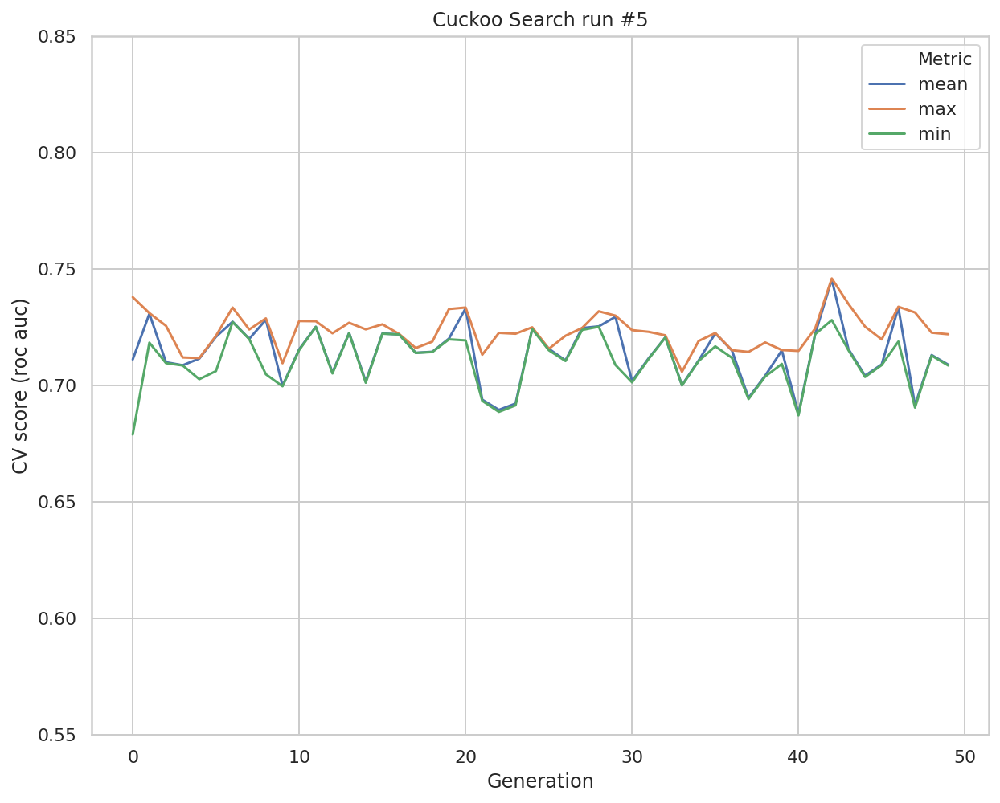

Score: 0.7458584327267103
Number of features selected: 118





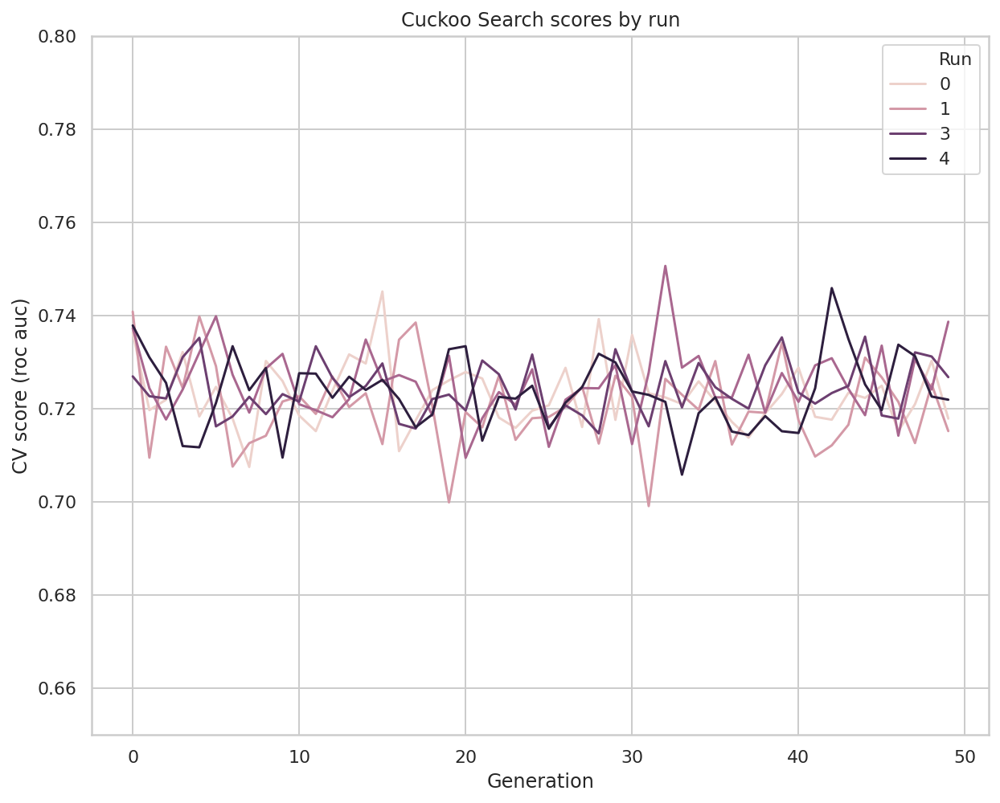

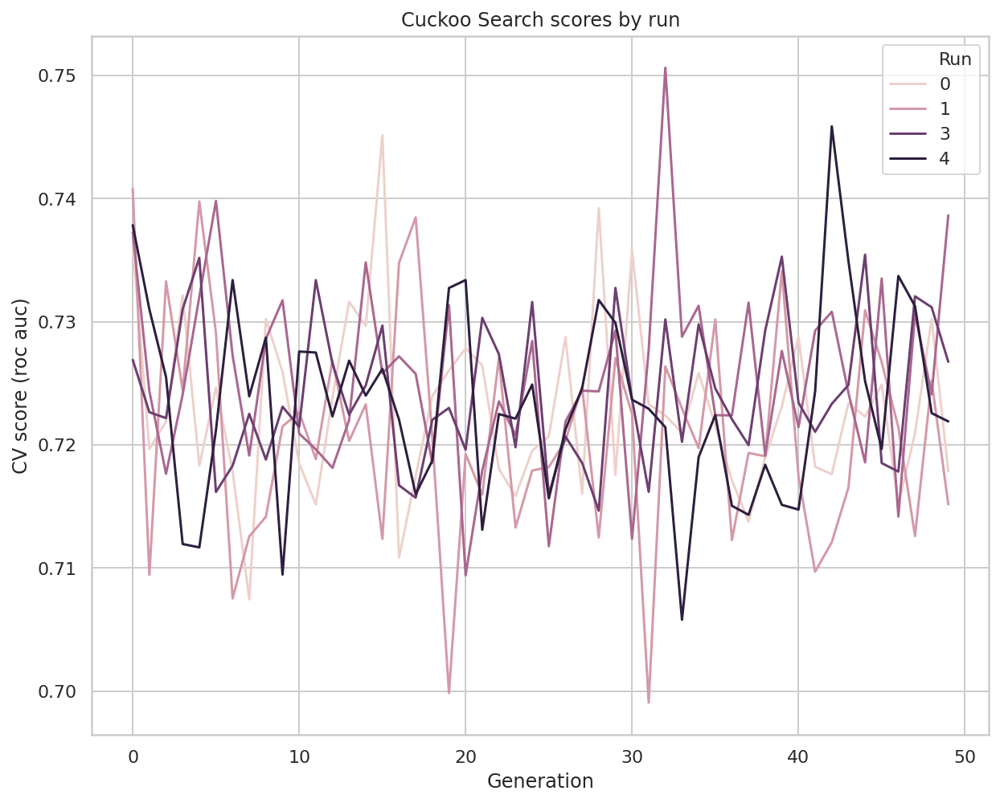


Mean score of 5 runs: 0.7435684550055301



Best score of 5 runs: 0.7506184001267453
Number of features selected: 106



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
The best score is 0.7506184001267453 with population_size=10

CPU times: user 6min 9s, sys: 750 ms, total: 6min 10s
Wall time: 6min 10s


In [23]:
%%time

from NiaPy.algorithms.basic import CuckooSearch


scores_by_run, _, overall_best_features, _, selected_features = run_experiment(CuckooSearch())

scores_by_algorithm['CuckooSearch'] = scores_by_run
selected_features_by_algorithm['CuckooSearch'] = selected_features

not fraud
precision: 0.7519181585677749
recall: 0.98
f1-score: 0.8509406657018813
support: 300


is fraud
precision: 0.6842105263157895
recall: 0.11818181818181818
f1-score: 0.20155038759689922
support: 110


accuracy: 0.748780487804878


macro avg
precision: 0.7180643424417822
recall: 0.5490909090909091
f1-score: 0.5262455266493903
support: 410


weighted avg
precision: 0.7337526962562667
recall: 0.748780487804878
f1-score: 0.6767140057224958
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.7180643424417823


CPU times: user 161 ms, sys: 2.05 ms, total: 163 ms
Wall time: 163 ms


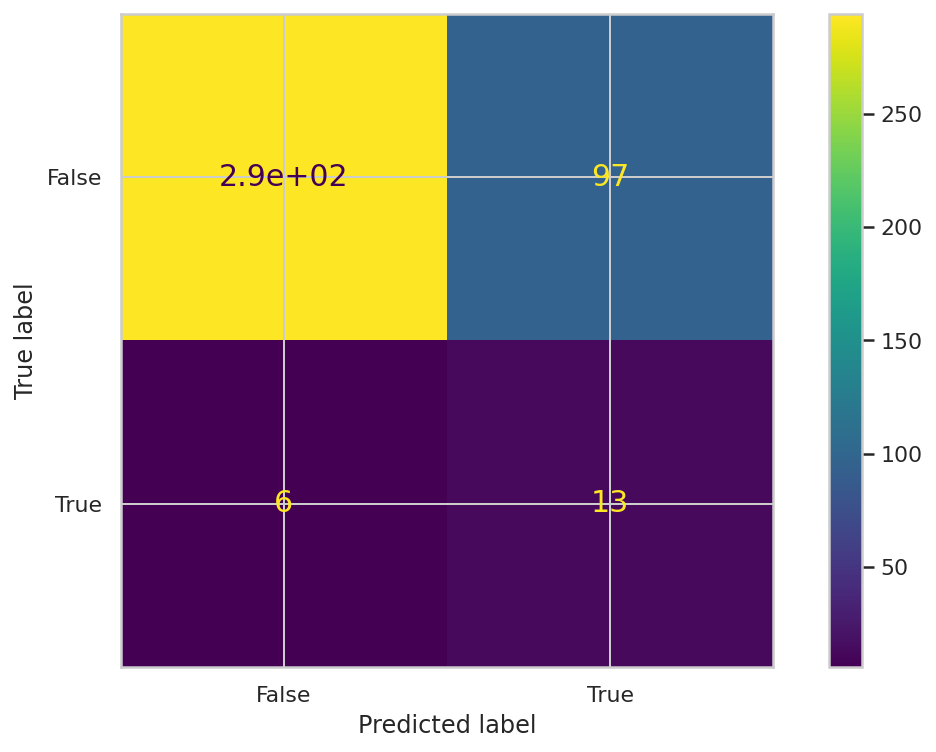

In [24]:
%%time

clf = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf = clf.fit(x_train[overall_best_features], y_train)

custom_classification_report(clf, x_test[overall_best_features], y_test)

### Bat Algorithm

[Bat Algorithm](https://github.com/NiaOrg/NiaPy/blob/master/NiaPy/algorithms/basic/ba.py) default parameters:
- A = 0.5
- r = 0.5
- Qmin = 0.0
- Qmax = 2.0

BatAlgorithm
population_size=10
number_of_generations=50
--------------
Run 1
--------------


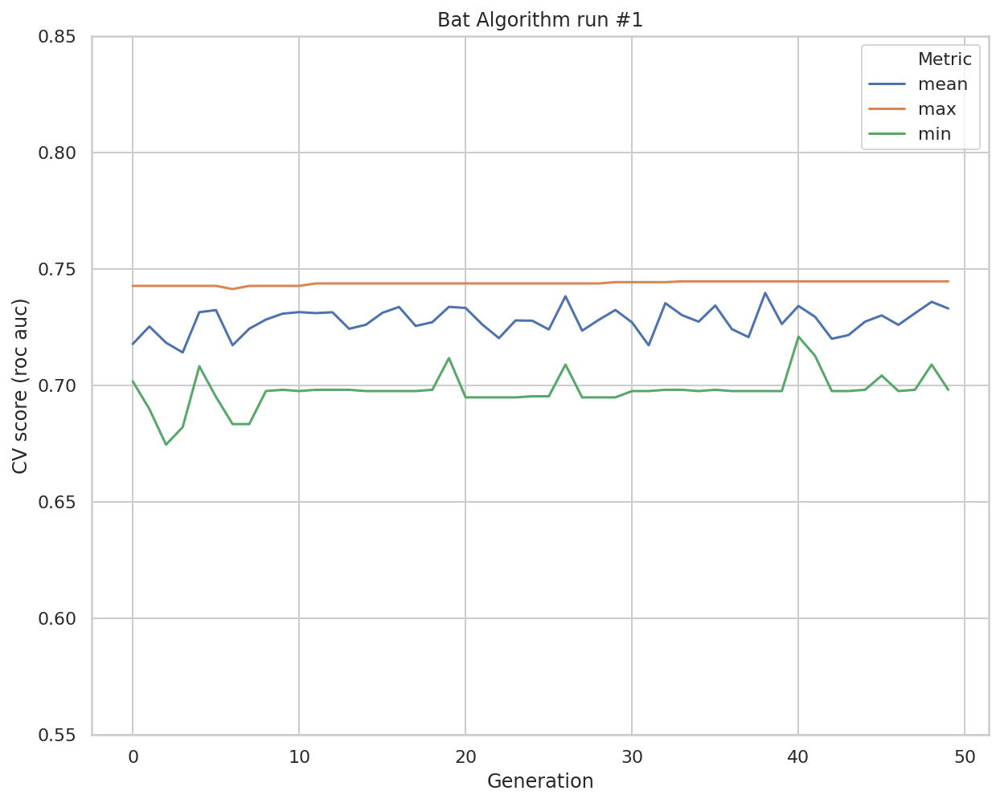

Score: 0.7446058255253519
Number of features selected: 123



--------------
Run 2
--------------


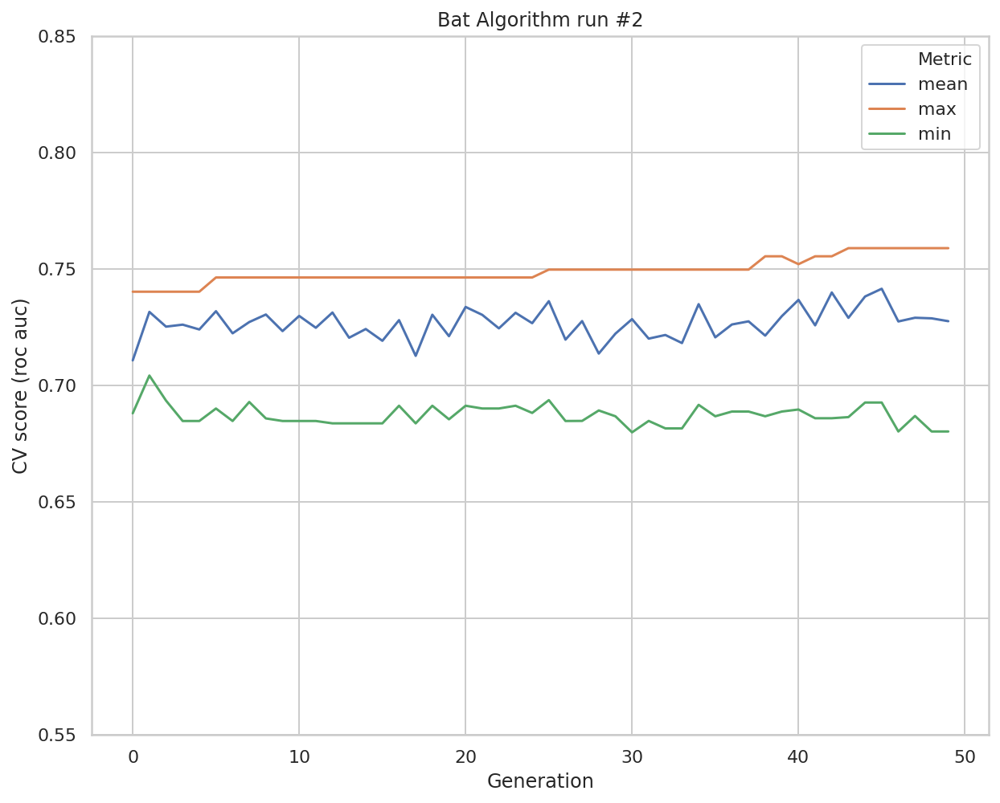

Score: 0.7588722175799979
Number of features selected: 119



--------------
Run 3
--------------


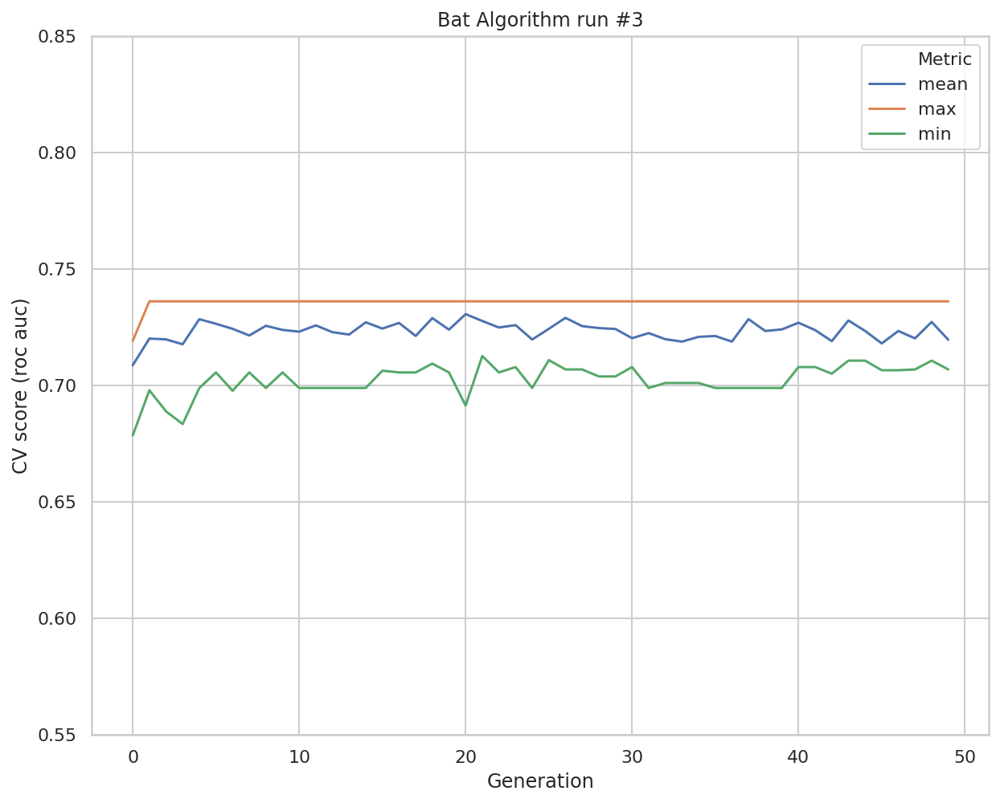

Score: 0.7360347186506677
Number of features selected: 129



--------------
Run 4
--------------


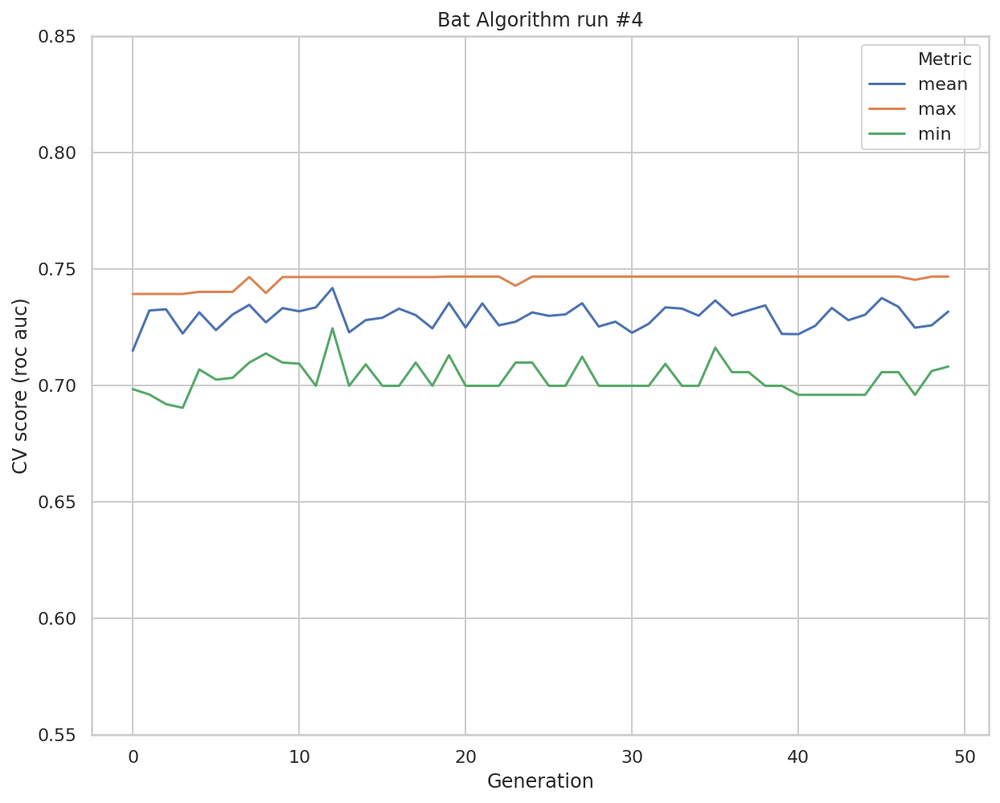

Score: 0.7466525611316798
Number of features selected: 121



--------------
Run 5
--------------


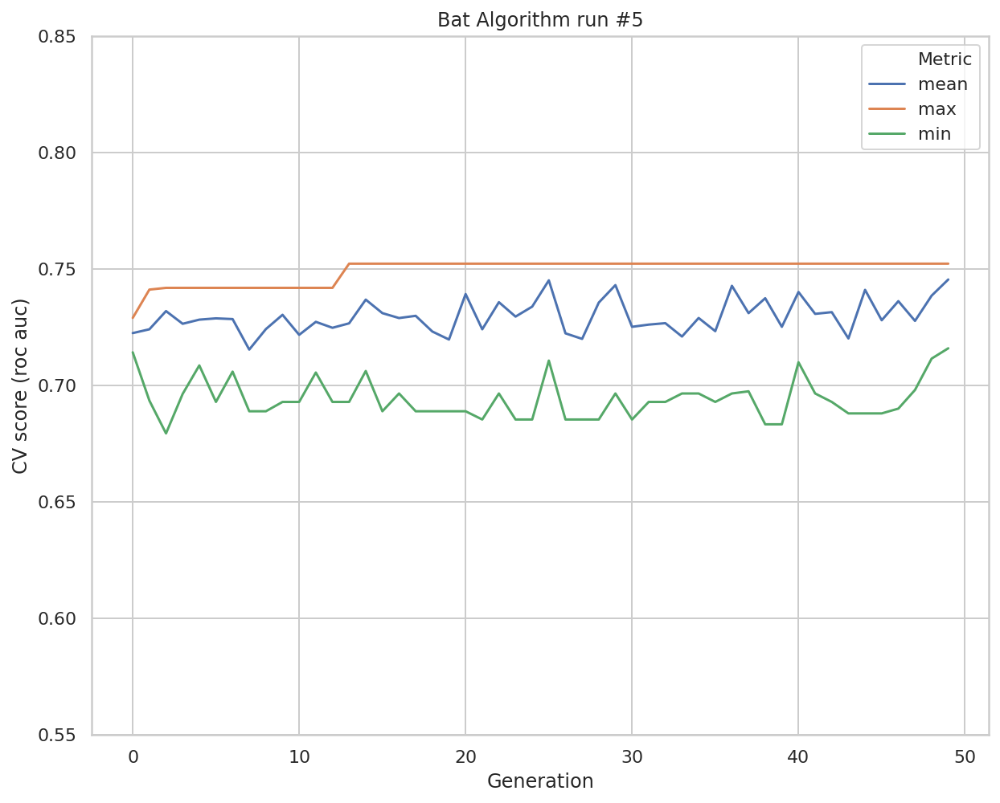

Score: 0.7522068847124789
Number of features selected: 103





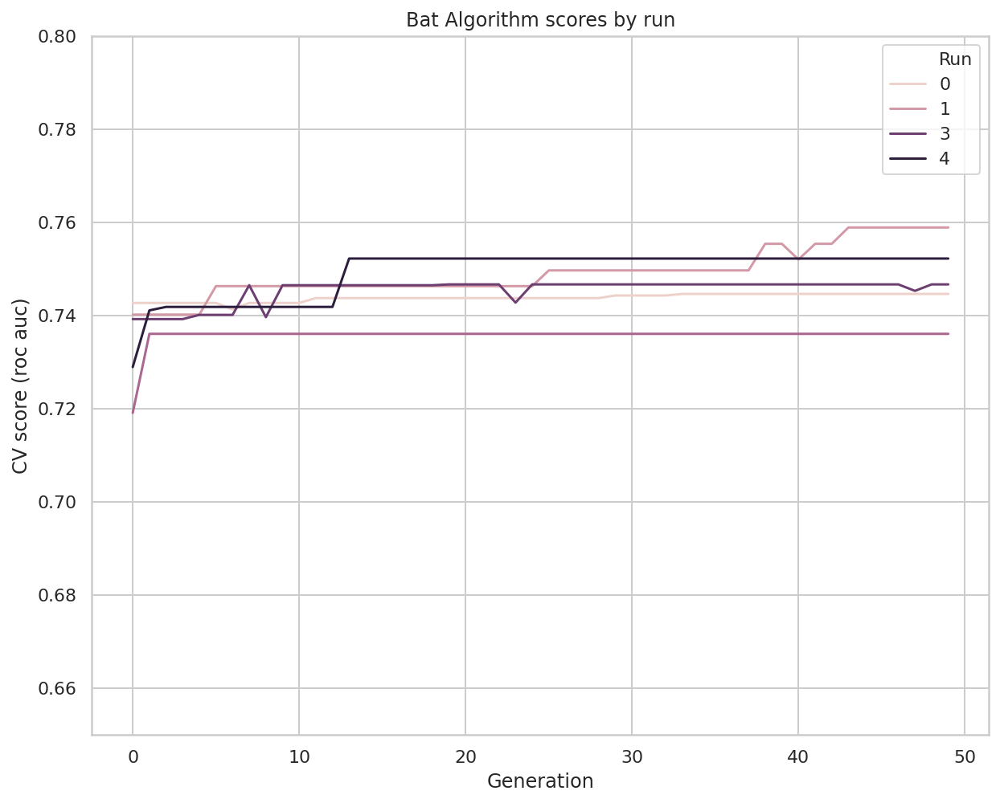

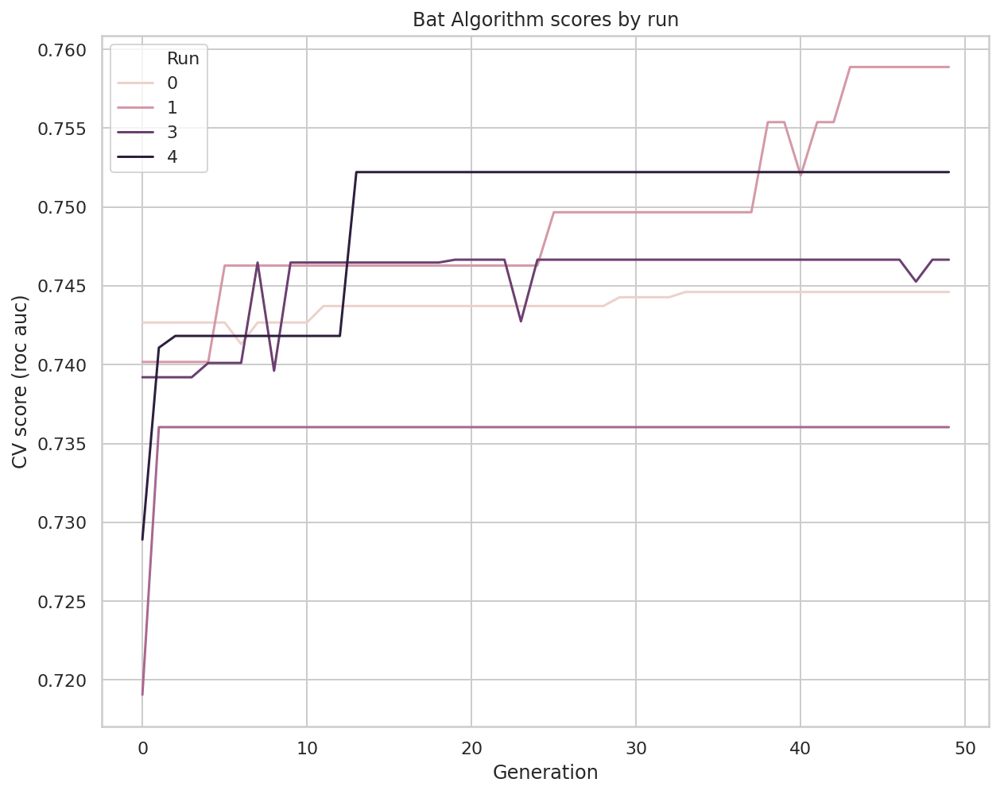


Mean score of 5 runs: 0.7476744415200354



Best score of 5 runs: 0.7588722175799979
Number of features selected: 119



BatAlgorithm
population_size=20
number_of_generations=50
--------------
Run 1
--------------


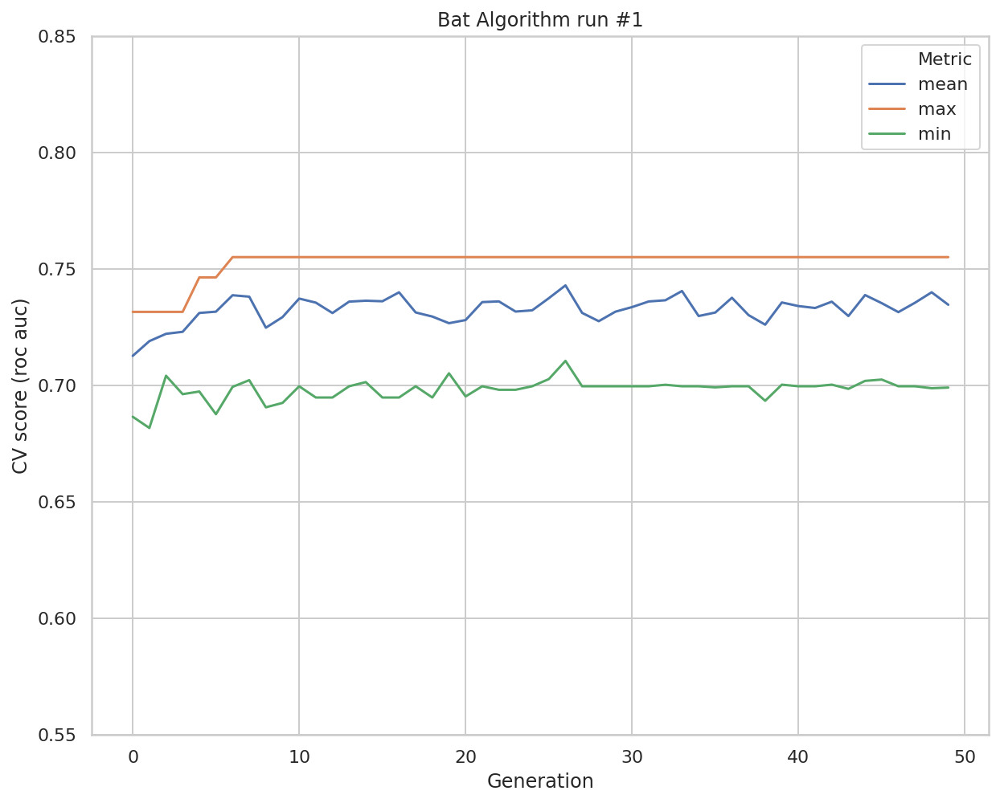

Score: 0.7550193916980538
Number of features selected: 117



--------------
Run 2
--------------


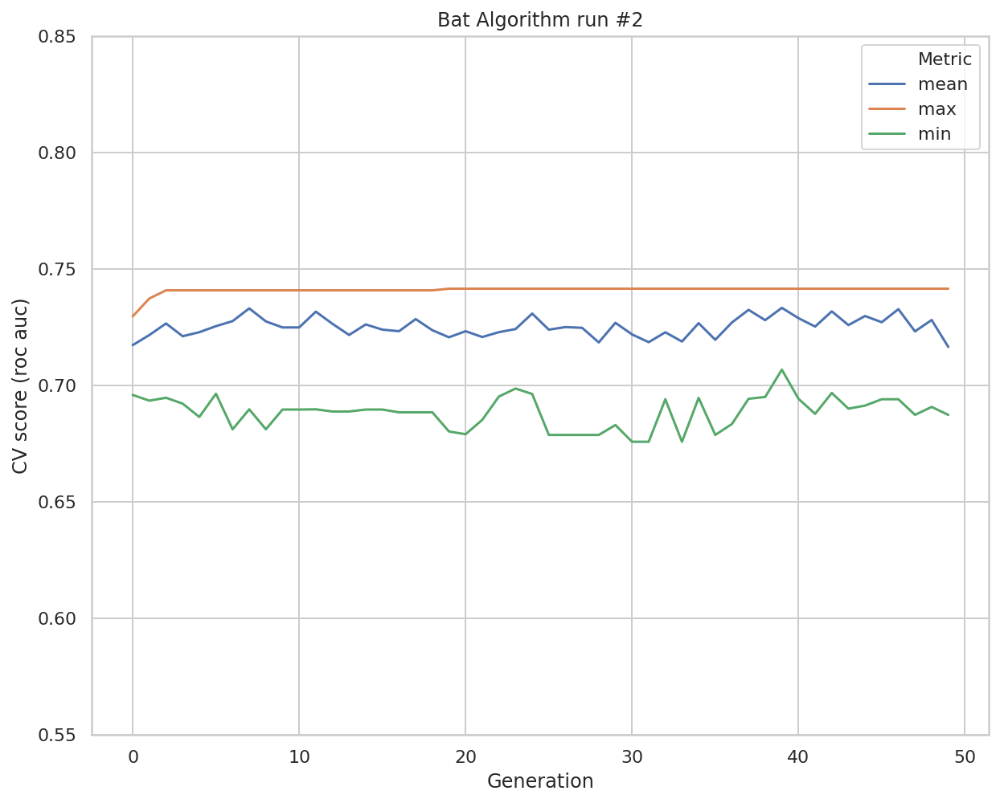

Score: 0.7414628824349625
Number of features selected: 129



--------------
Run 3
--------------


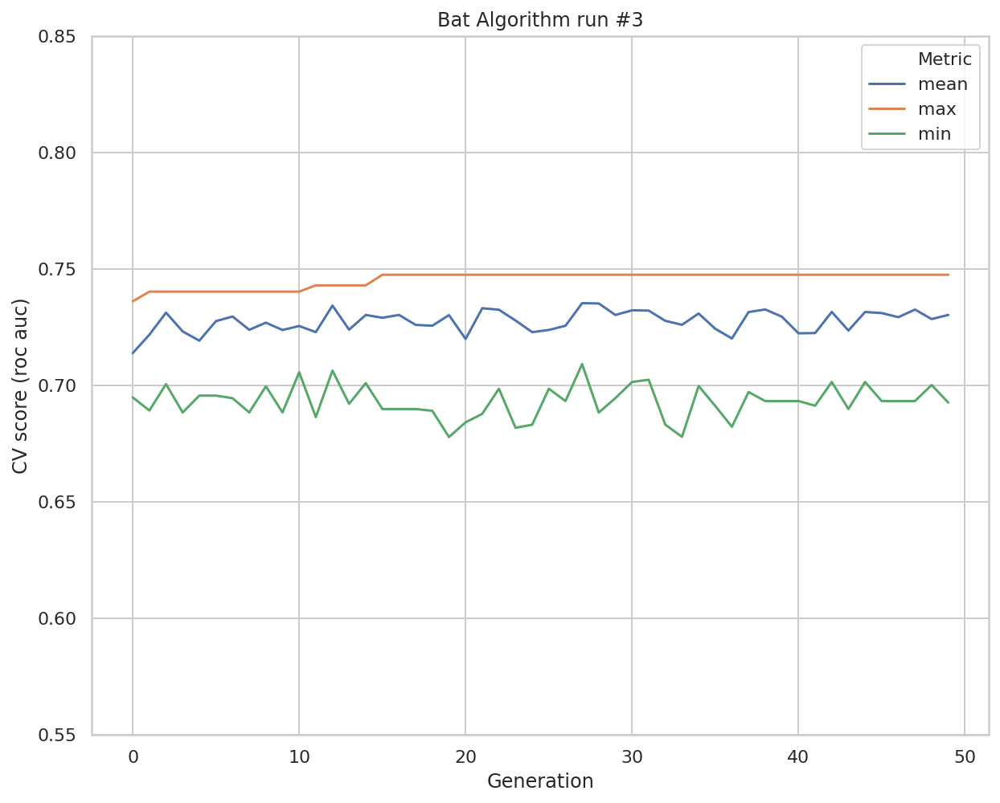

Score: 0.7474471640897483
Number of features selected: 96



--------------
Run 4
--------------


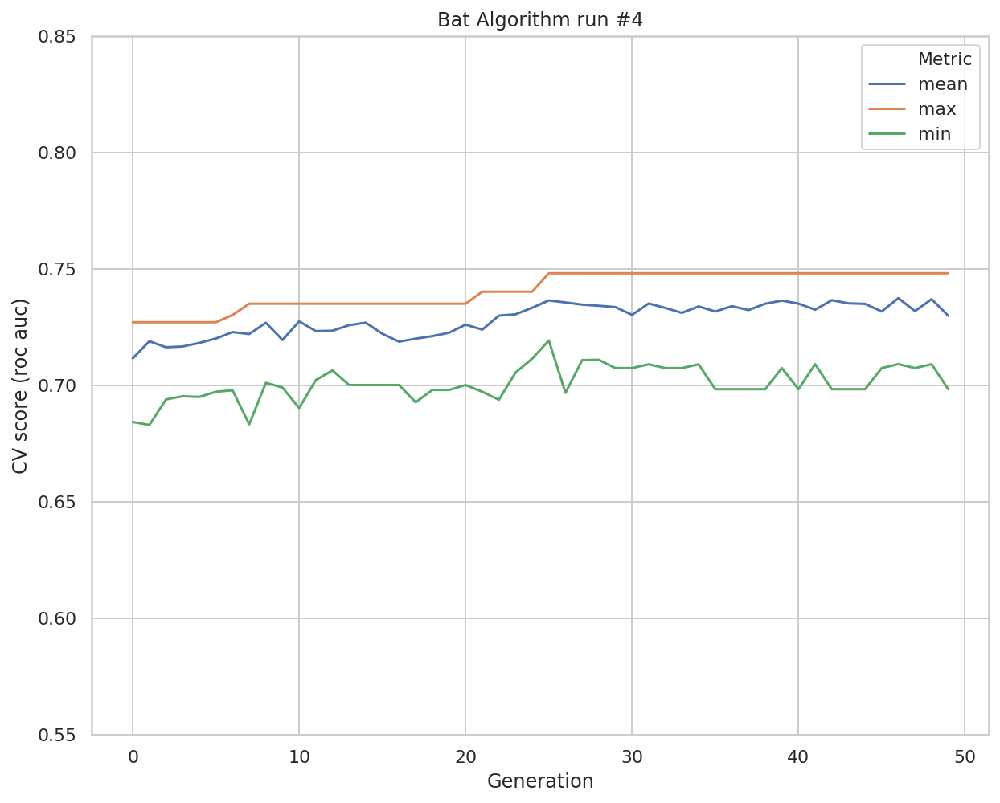

Score: 0.7480927418195609
Number of features selected: 112



--------------
Run 5
--------------


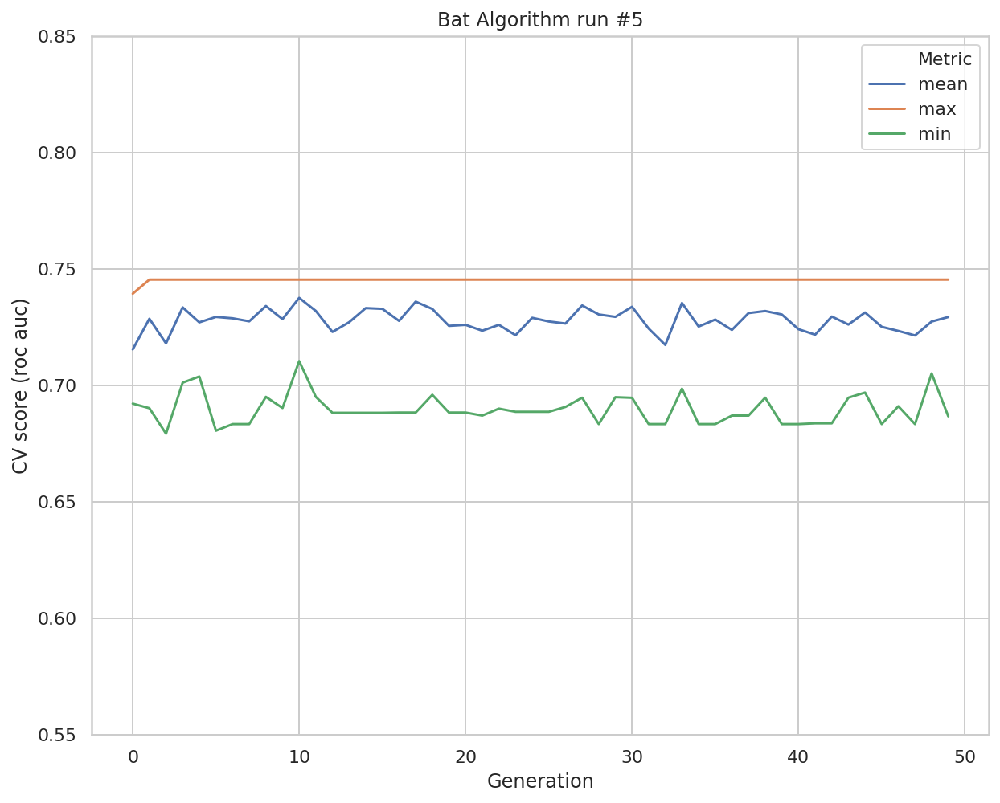

Score: 0.745350009242413
Number of features selected: 117





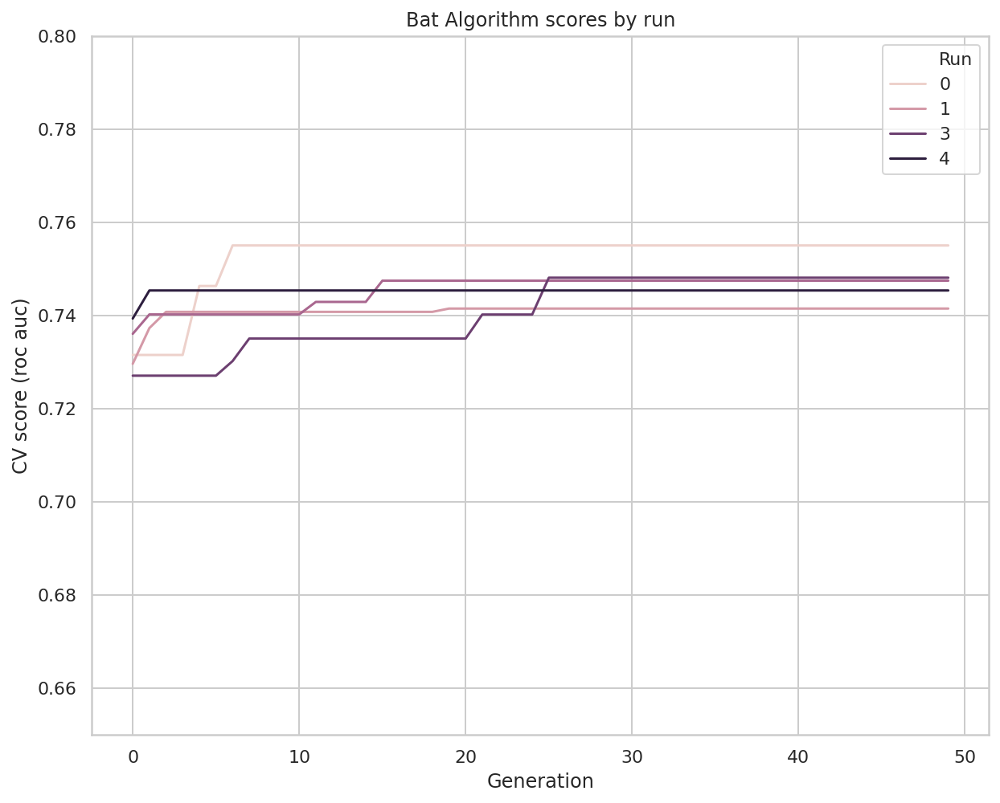

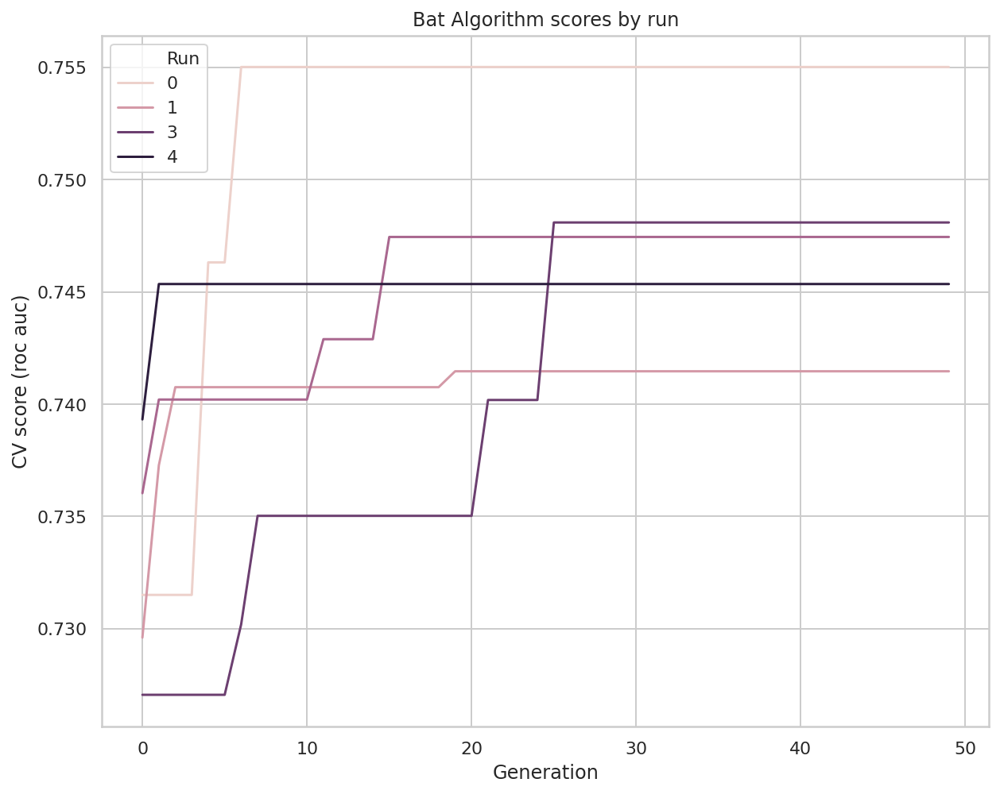


Mean score of 5 runs: 0.7474744378569478



Best score of 5 runs: 0.7550193916980538
Number of features selected: 117



BatAlgorithm
population_size=50
number_of_generations=50
--------------
Run 1
--------------


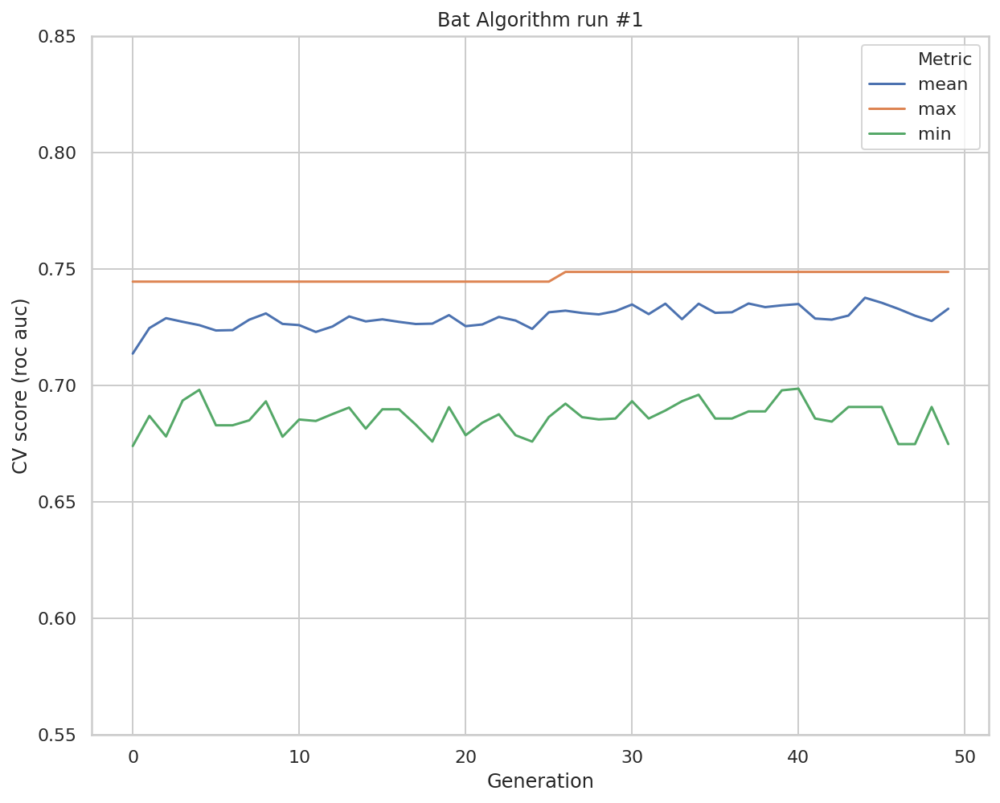

Score: 0.7486763840090455
Number of features selected: 127



--------------
Run 2
--------------


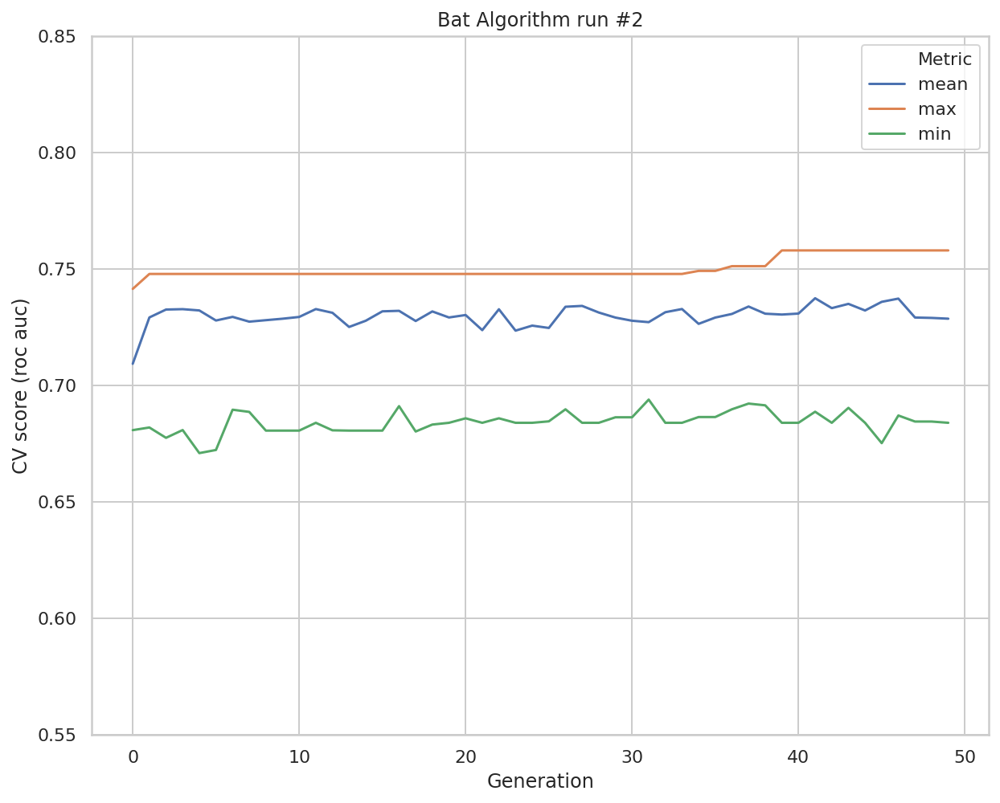

Score: 0.7578980955211706
Number of features selected: 122



--------------
Run 3
--------------


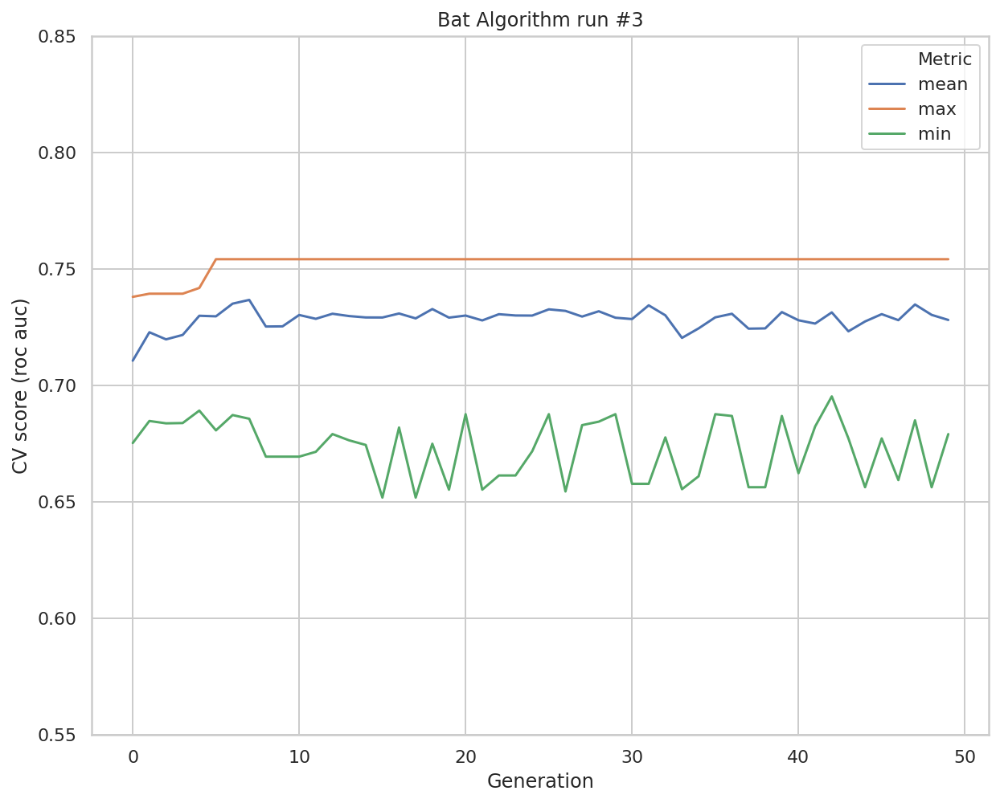

Score: 0.7541242219916351
Number of features selected: 109



--------------
Run 4
--------------


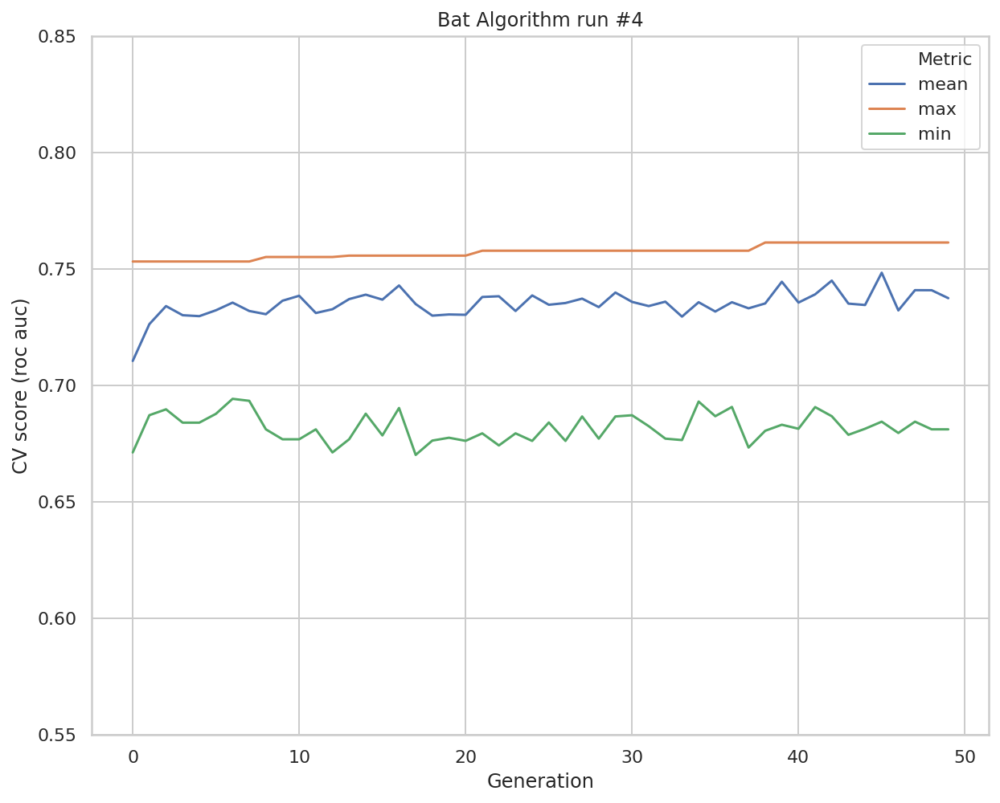

Score: 0.7612959182026315
Number of features selected: 125



--------------
Run 5
--------------


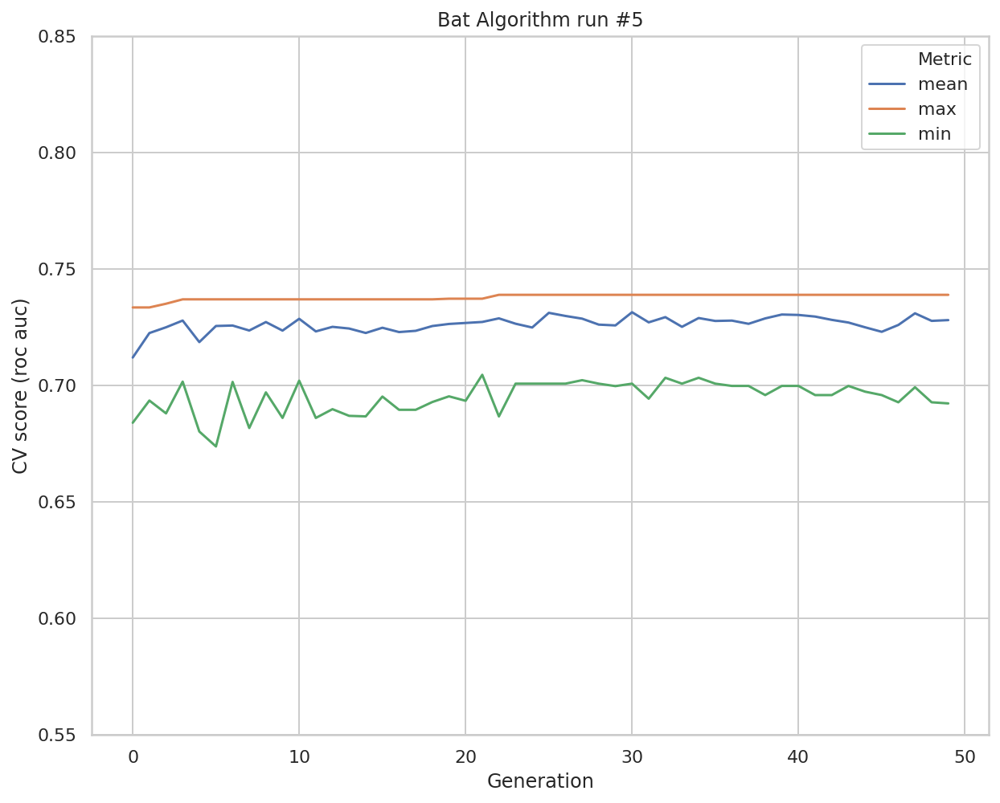

Score: 0.7388282873029172
Number of features selected: 117





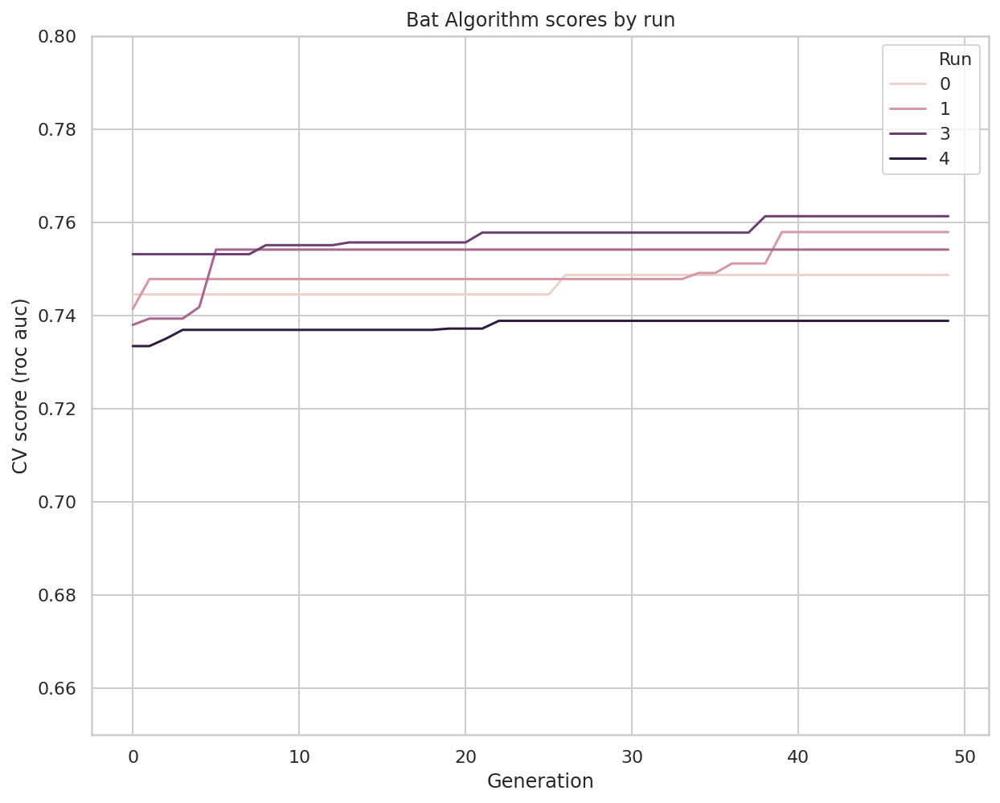

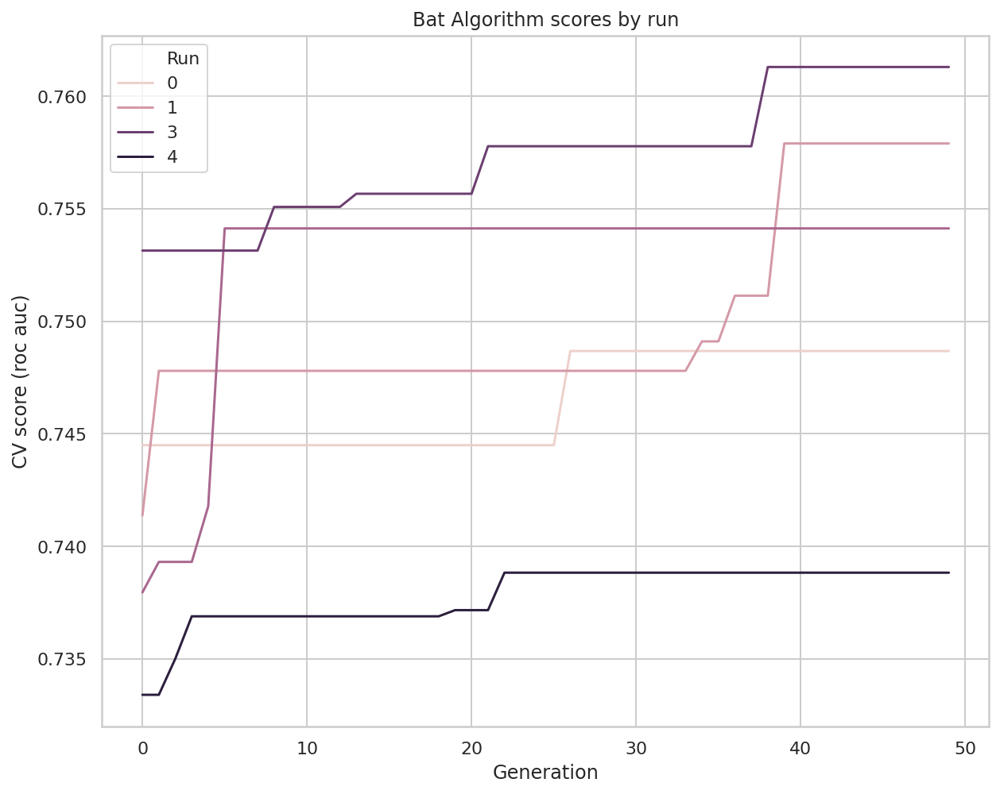


Mean score of 5 runs: 0.75216458140548



Best score of 5 runs: 0.7612959182026315
Number of features selected: 125



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
The best score is 0.7612959182026315 with population_size=50

CPU times: user 11min 22s, sys: 819 ms, total: 11min 23s
Wall time: 11min 23s


In [25]:
%%time

from NiaPy.algorithms.basic import BatAlgorithm


scores_by_run, _, overall_best_features, _, selected_features = run_experiment(BatAlgorithm())

scores_by_algorithm['BatAlgorithm'] = scores_by_run
selected_features_by_algorithm['BatAlgorithm'] = selected_features

not fraud
precision: 0.6930946291560103
recall: 0.9783393501805054
f1-score: 0.811377245508982
support: 277


is fraud
precision: 0.6842105263157895
recall: 0.09774436090225563
f1-score: 0.17105263157894735
support: 133


accuracy: 0.6926829268292682


macro avg
precision: 0.6886525777358998
recall: 0.5380418555413805
f1-score: 0.4912149385439647
support: 410


weighted avg
precision: 0.6902127128688167
recall: 0.6926829268292682
f1-score: 0.603662187819483
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.6886525777358999


CPU times: user 80.7 ms, sys: 4.04 ms, total: 84.8 ms
Wall time: 85.4 ms


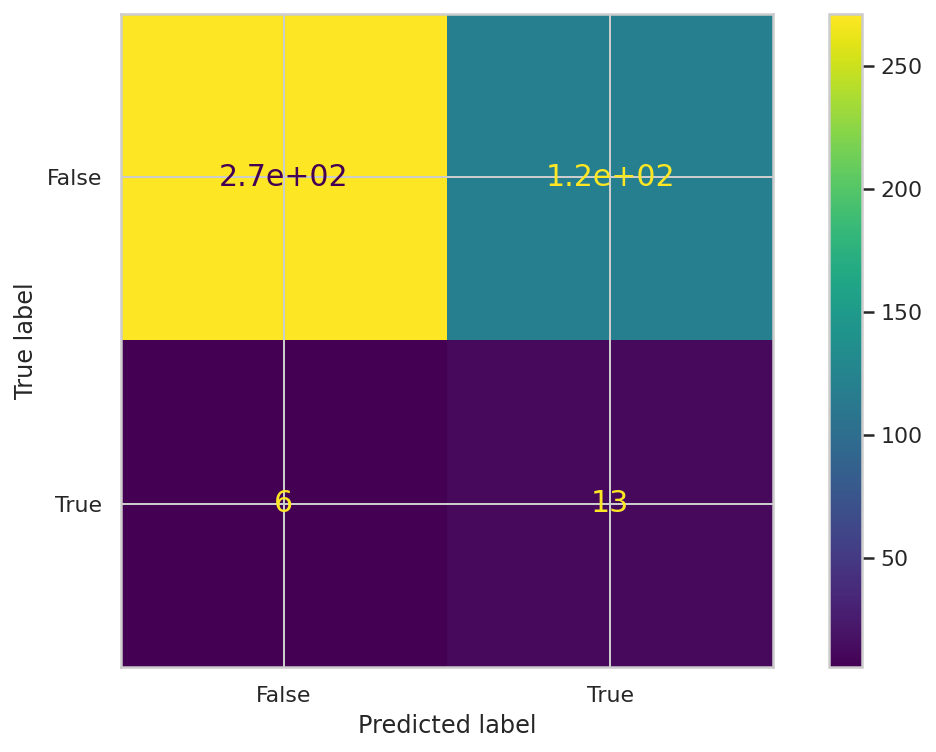

In [26]:
%%time

clf = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf = clf.fit(x_train[overall_best_features], y_train)

custom_classification_report(clf, x_test[overall_best_features], y_test)

### Flower Pollination Algorithm

[Flower Pollination Algorithm](https://github.com/NiaOrg/NiaPy/blob/master/NiaPy/algorithms/basic/fpa.py) default parameters:
- p = 0.35
- beta = 1.5

FlowerPollinationAlgorithm
population_size=10
number_of_generations=50
--------------
Run 1
--------------


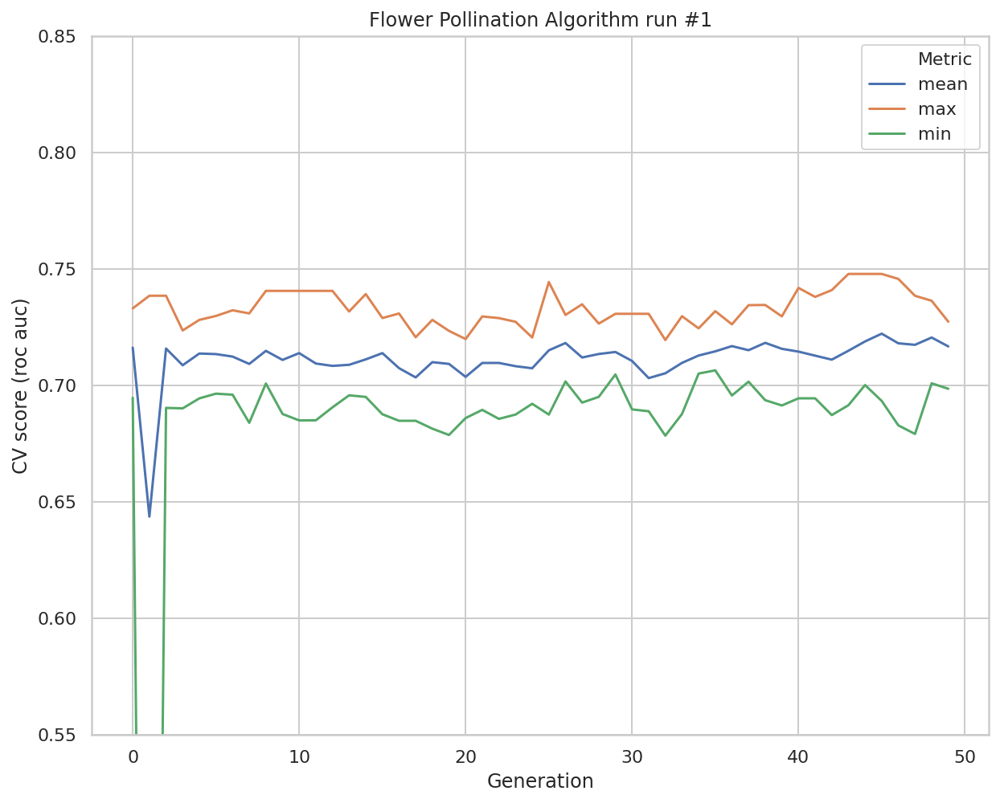

Score: 0.7478008683375524
Number of features selected: 129



--------------
Run 2
--------------


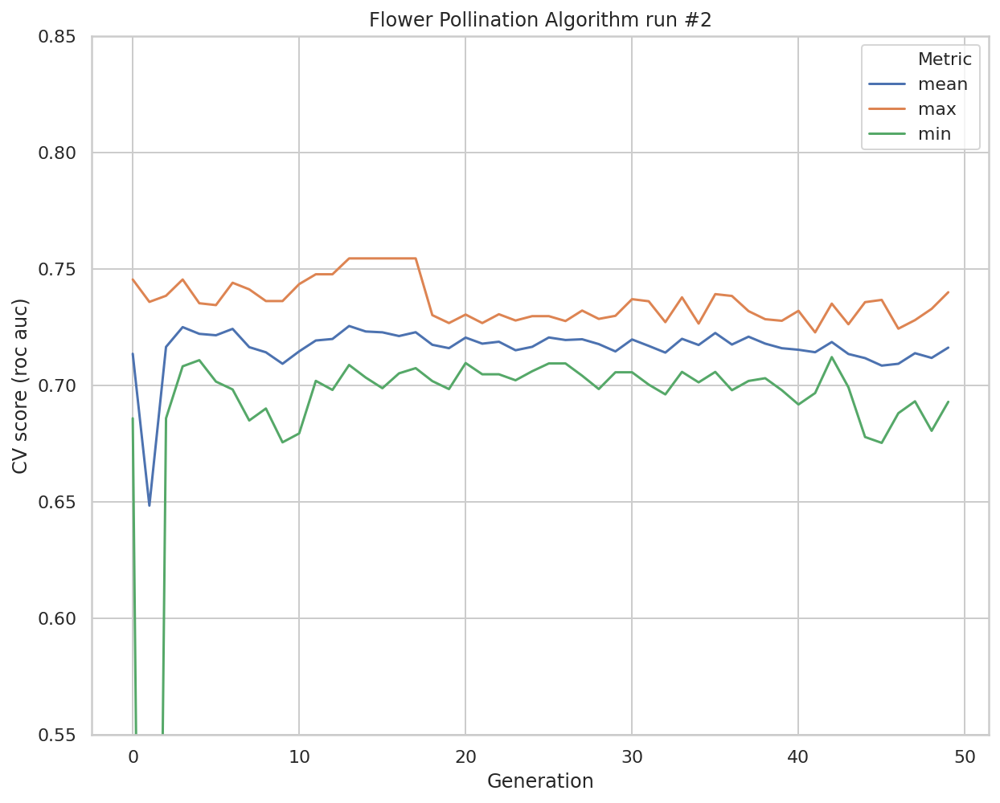

Score: 0.7544683471079758
Number of features selected: 129



--------------
Run 3
--------------


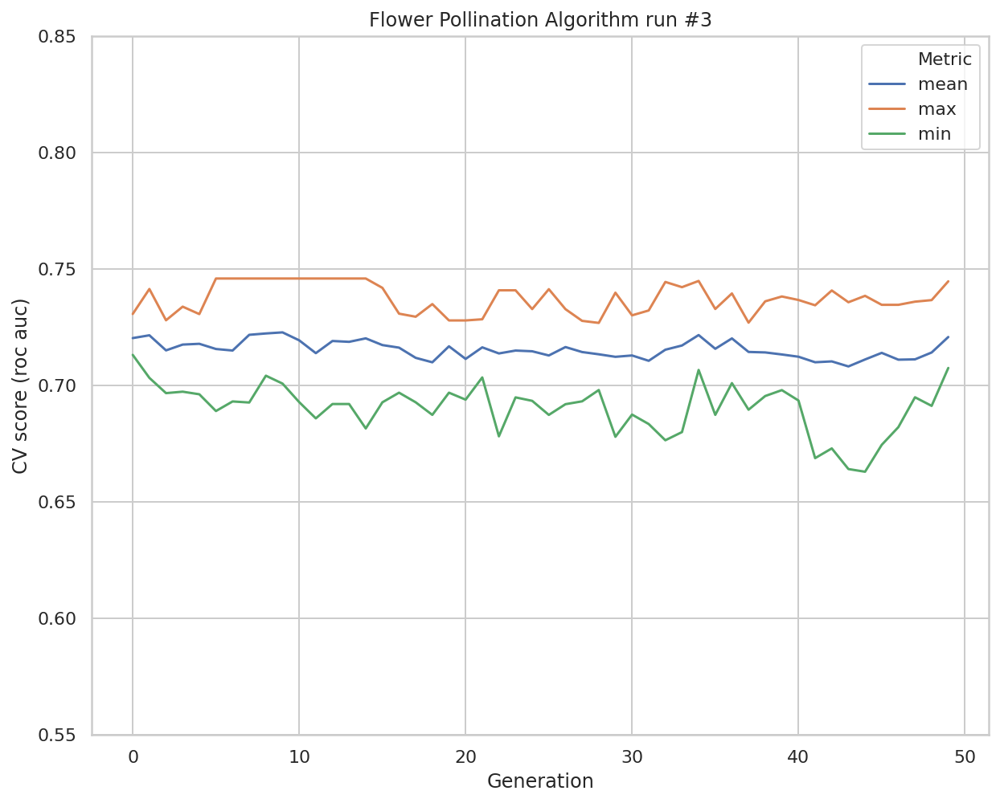

Score: 0.7458346410573573
Number of features selected: 120



--------------
Run 4
--------------


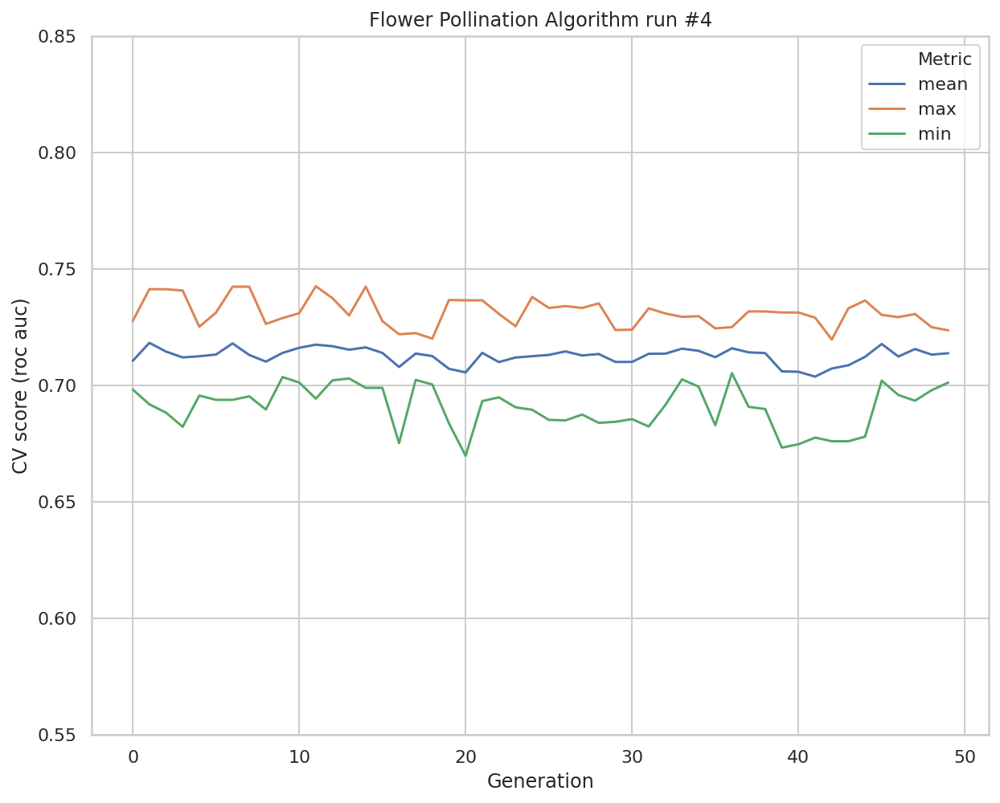

Score: 0.7425257793850084
Number of features selected: 115



--------------
Run 5
--------------


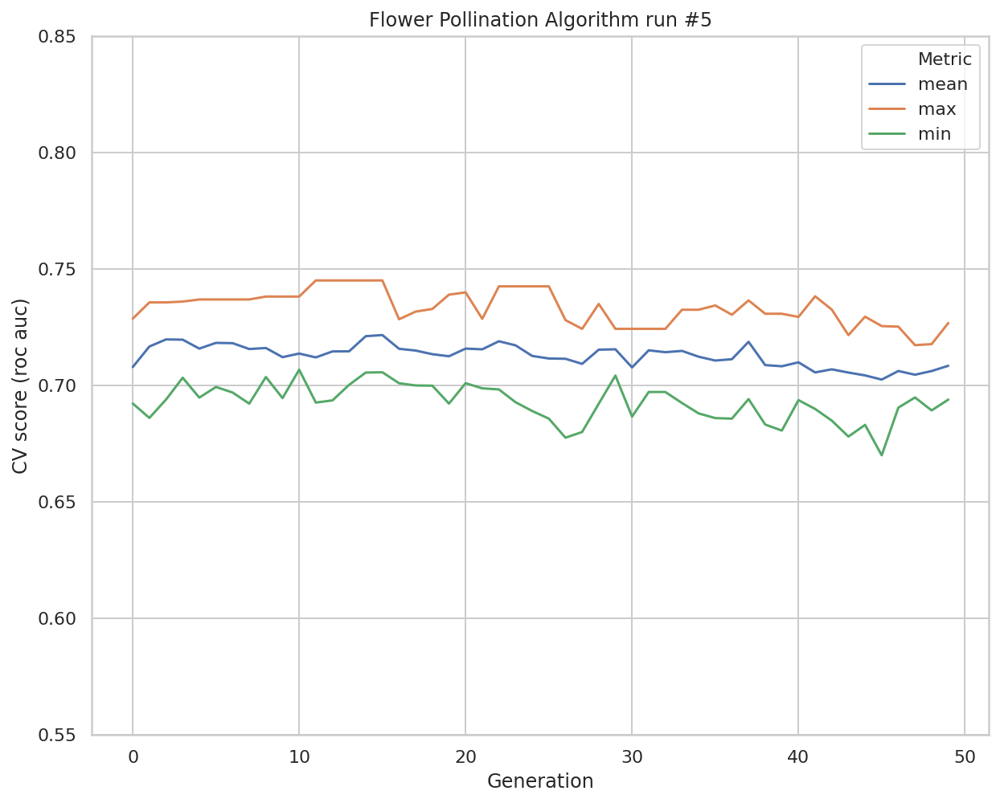

Score: 0.7450008392743223
Number of features selected: 122





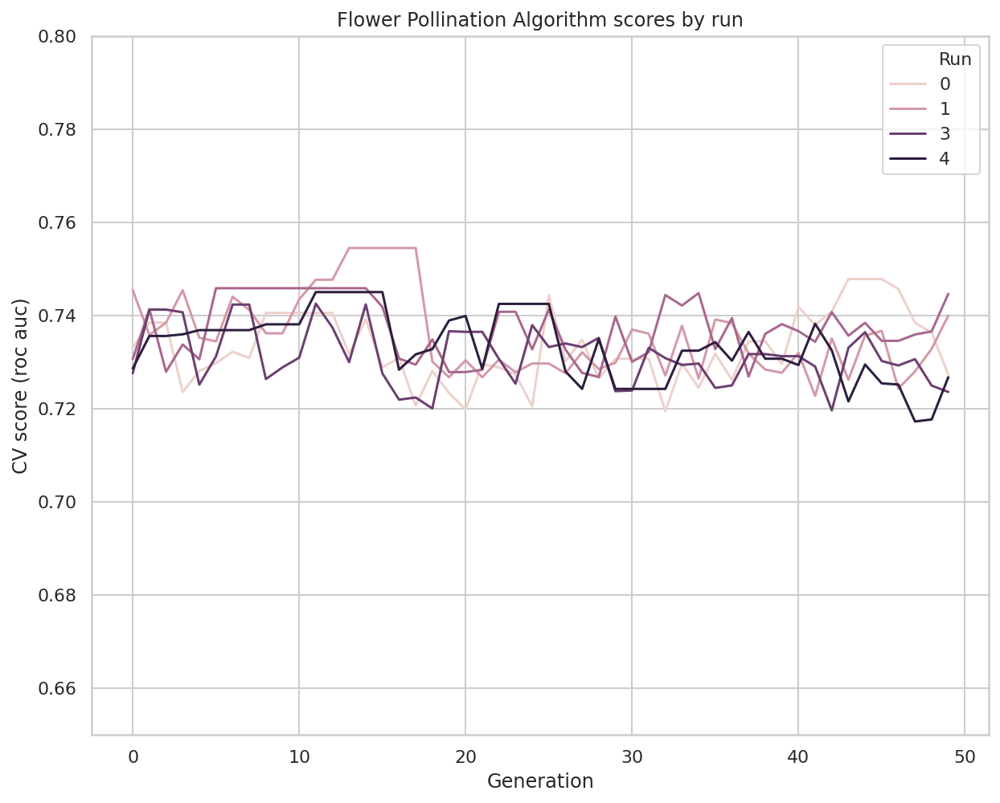

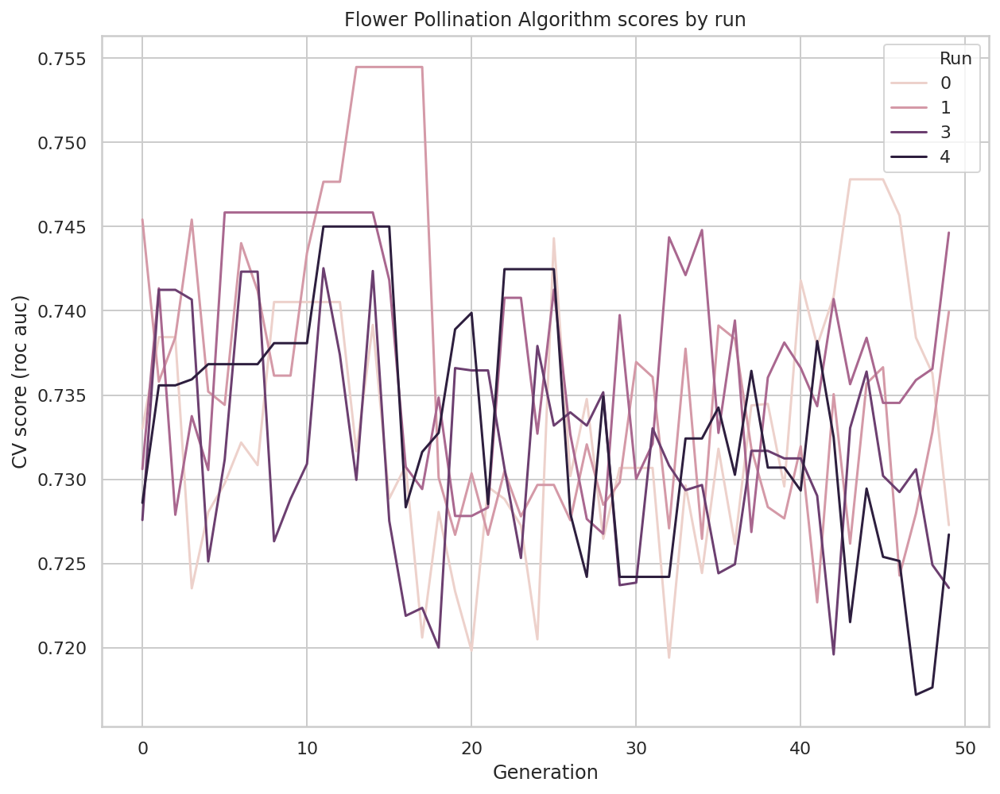


Mean score of 5 runs: 0.7471260950324432



Best score of 5 runs: 0.7544683471079758
Number of features selected: 129



FlowerPollinationAlgorithm
population_size=20
number_of_generations=50
--------------
Run 1
--------------


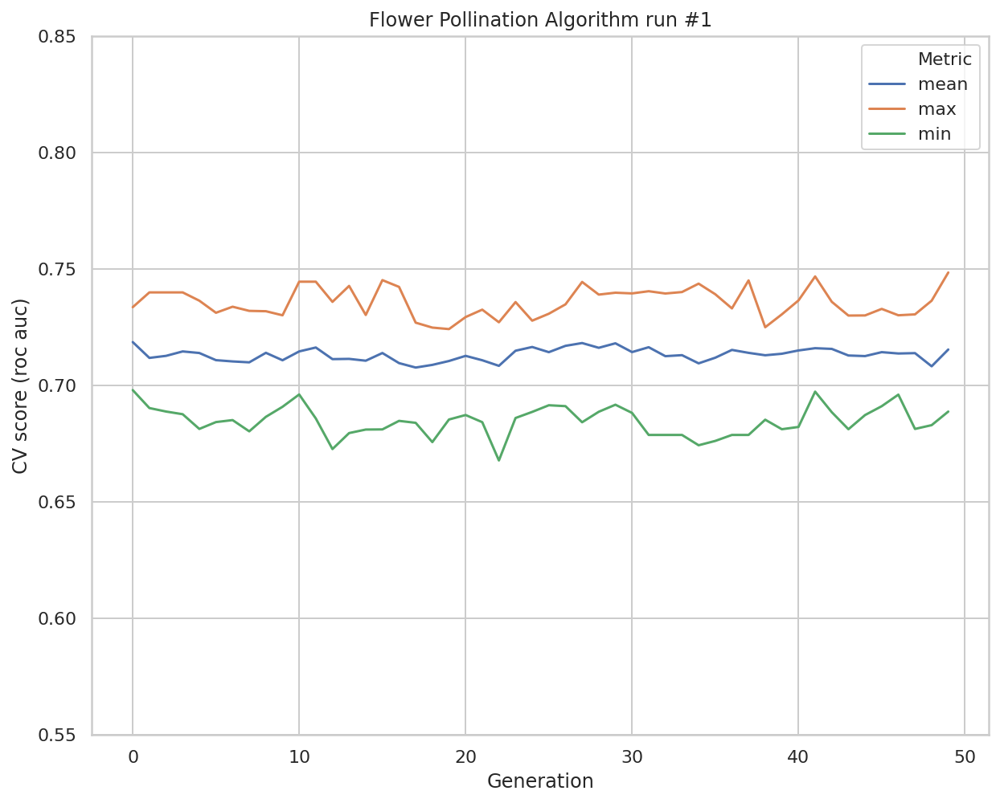

Score: 0.7484151794556979
Number of features selected: 124



--------------
Run 2
--------------


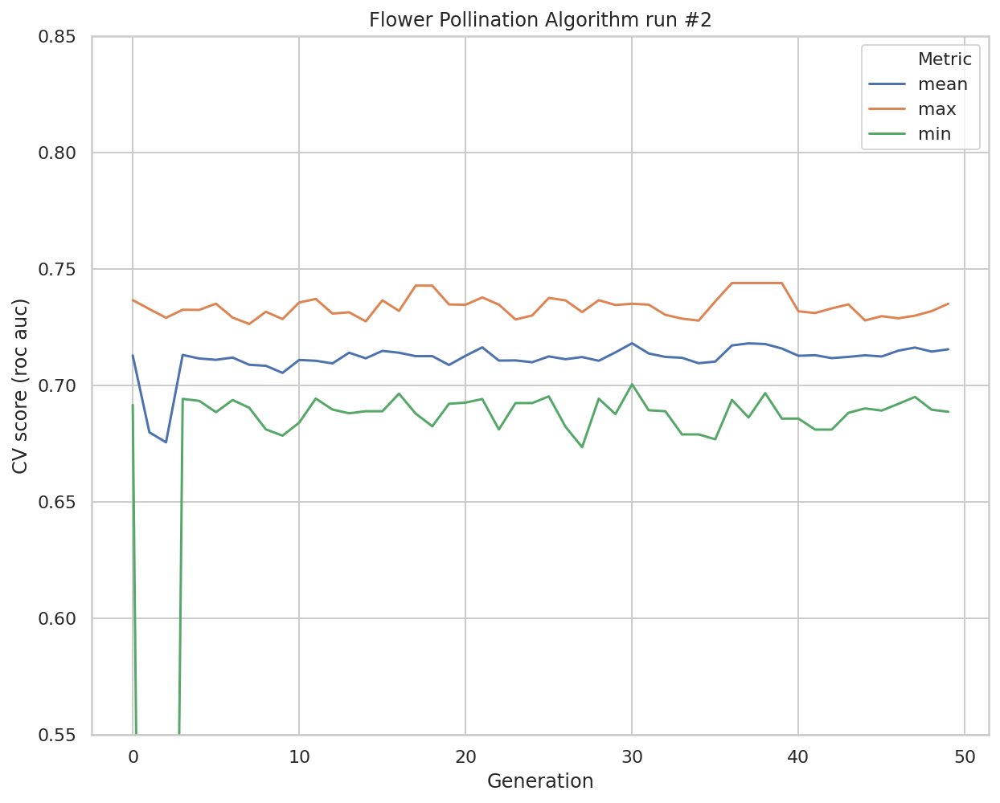

Score: 0.7438906679205489
Number of features selected: 106



--------------
Run 3
--------------


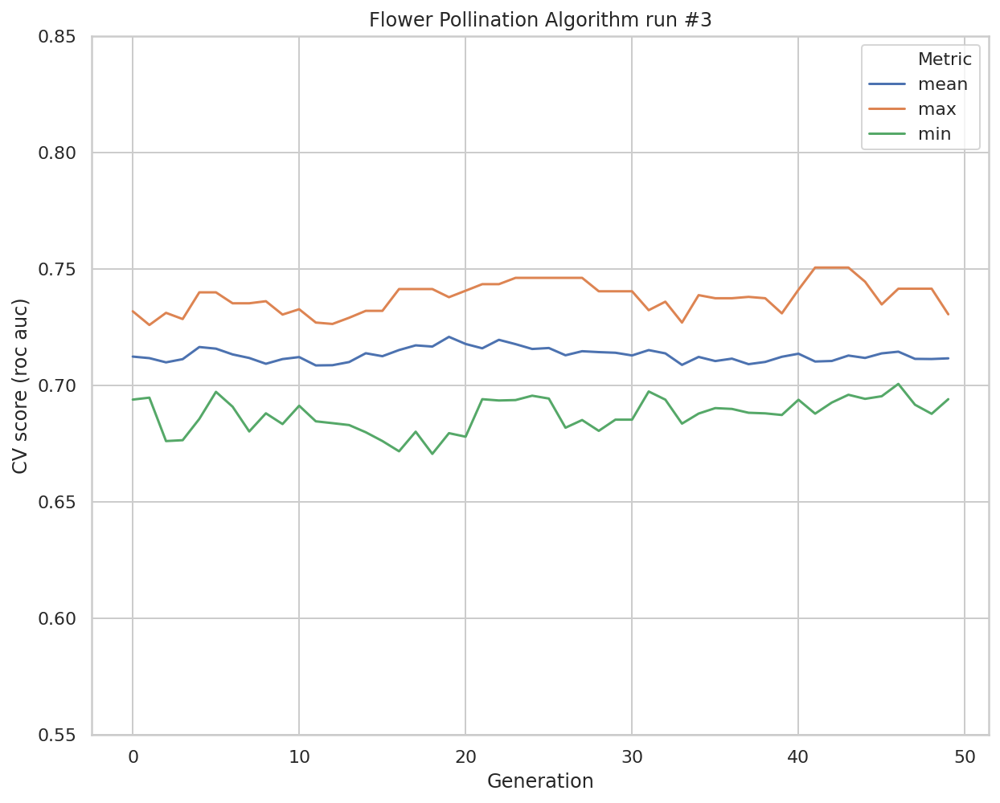

Score: 0.7505427726830891
Number of features selected: 121



--------------
Run 4
--------------


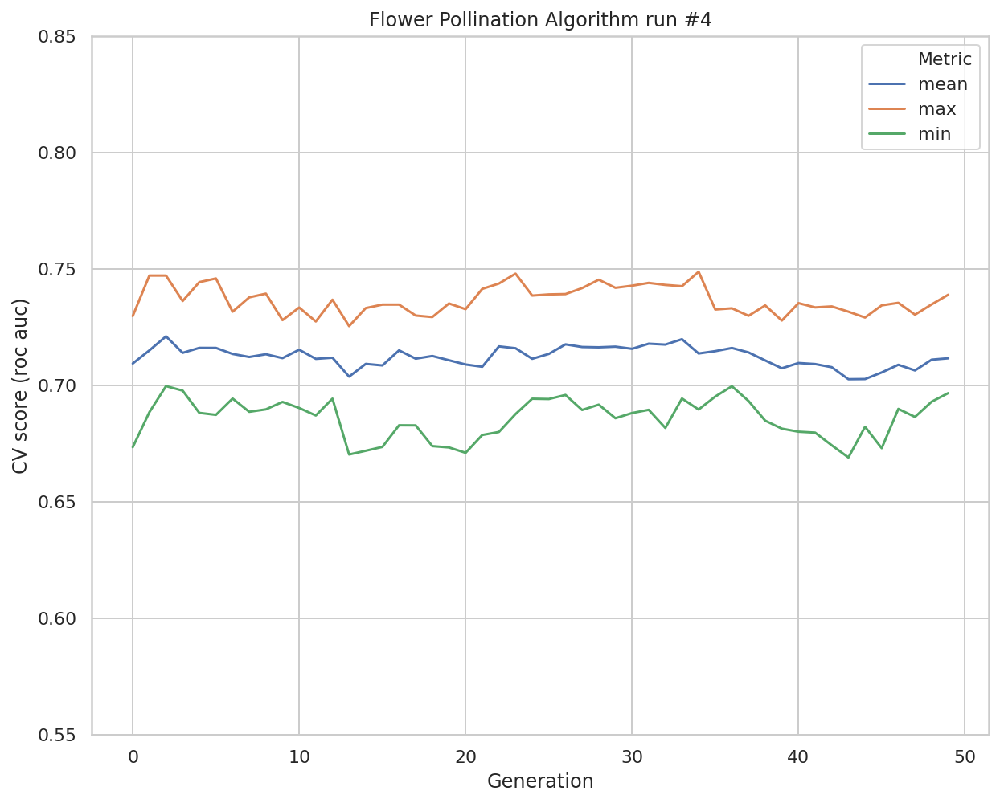

Score: 0.7487386534026002
Number of features selected: 116



--------------
Run 5
--------------


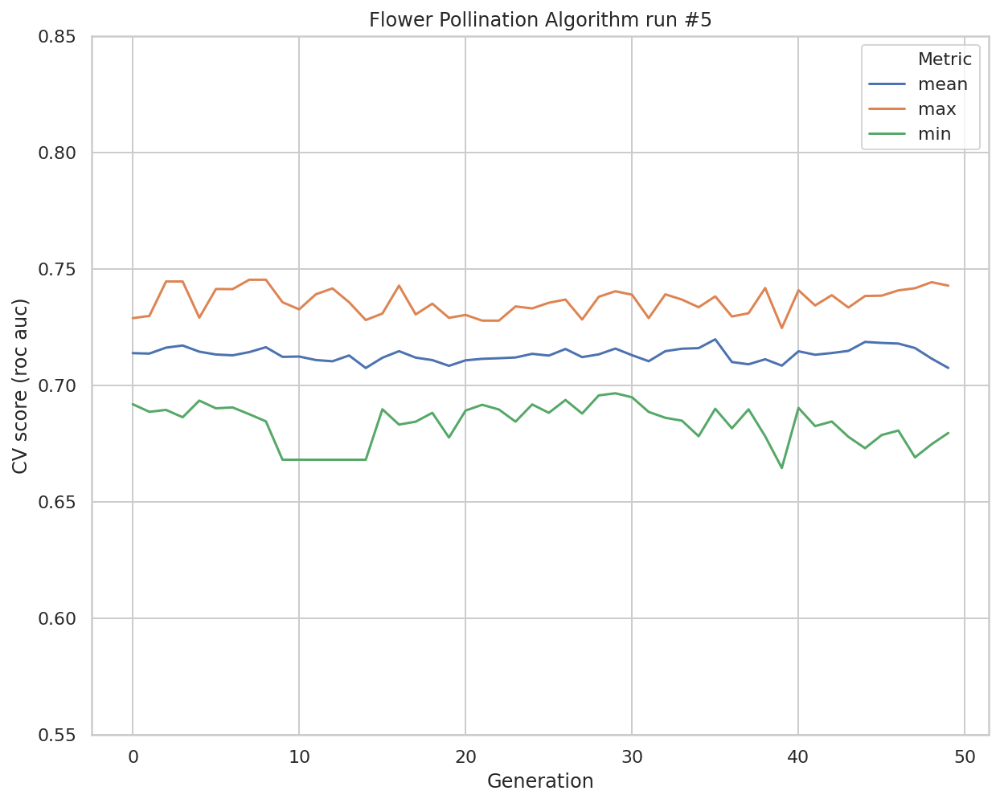

Score: 0.7453028250737295
Number of features selected: 122





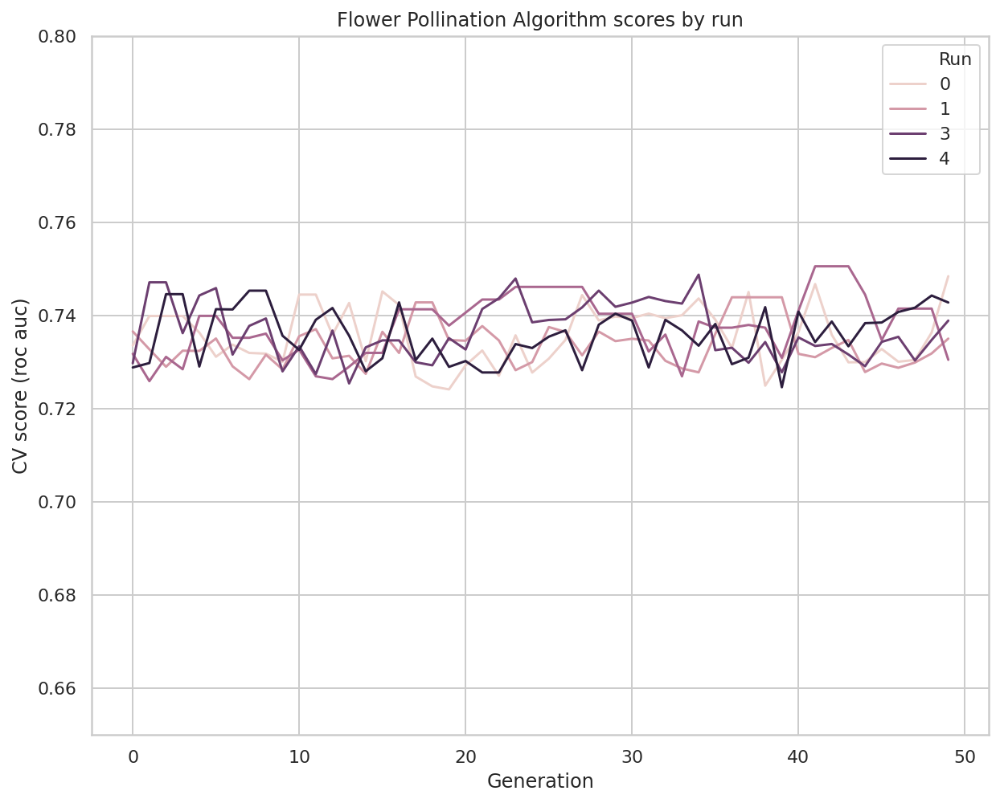

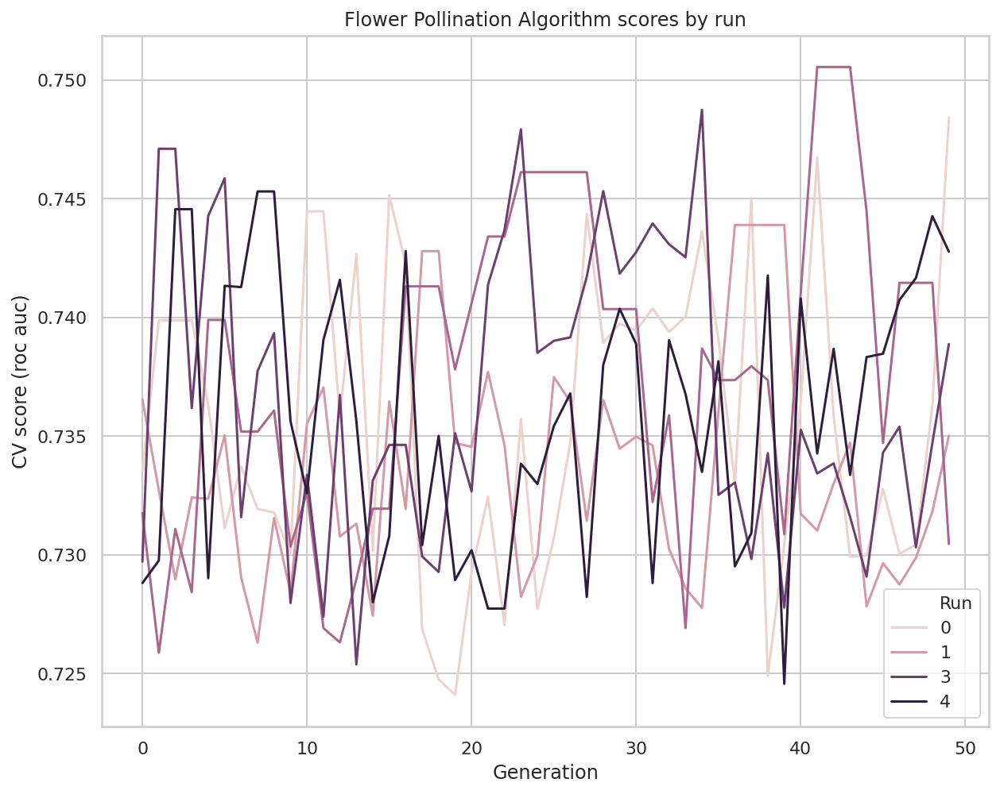


Mean score of 5 runs: 0.747378019707133



Best score of 5 runs: 0.7505427726830891
Number of features selected: 121



FlowerPollinationAlgorithm
population_size=50
number_of_generations=50
--------------
Run 1
--------------


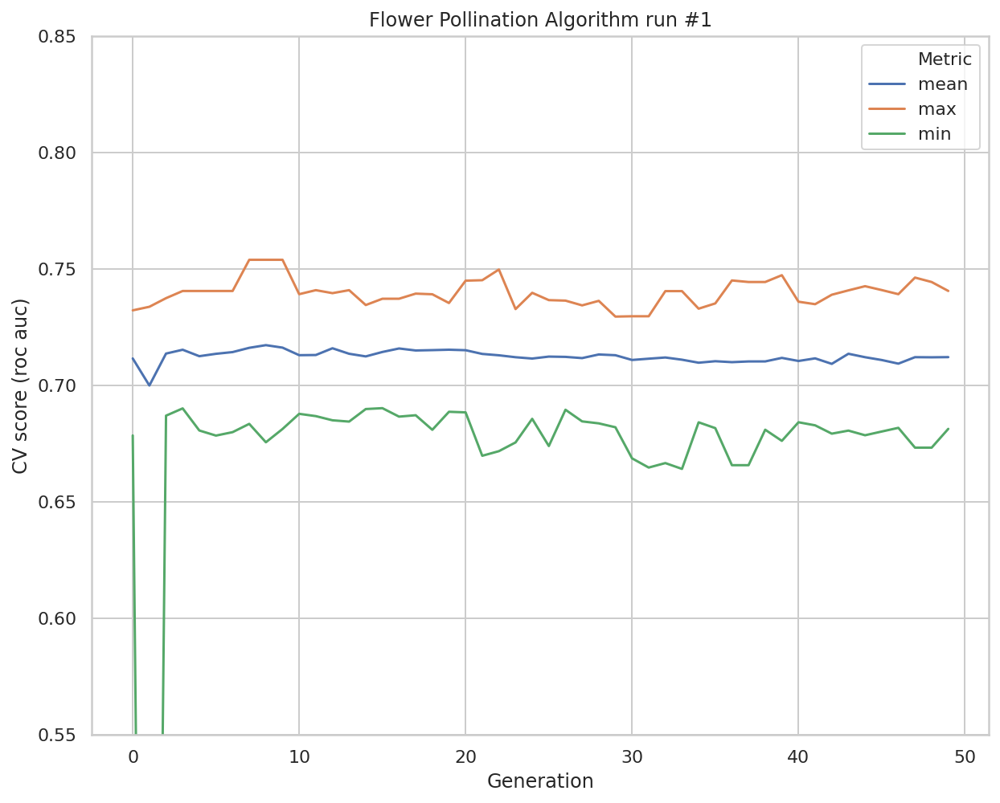

Score: 0.7538732479156665
Number of features selected: 123



--------------
Run 2
--------------


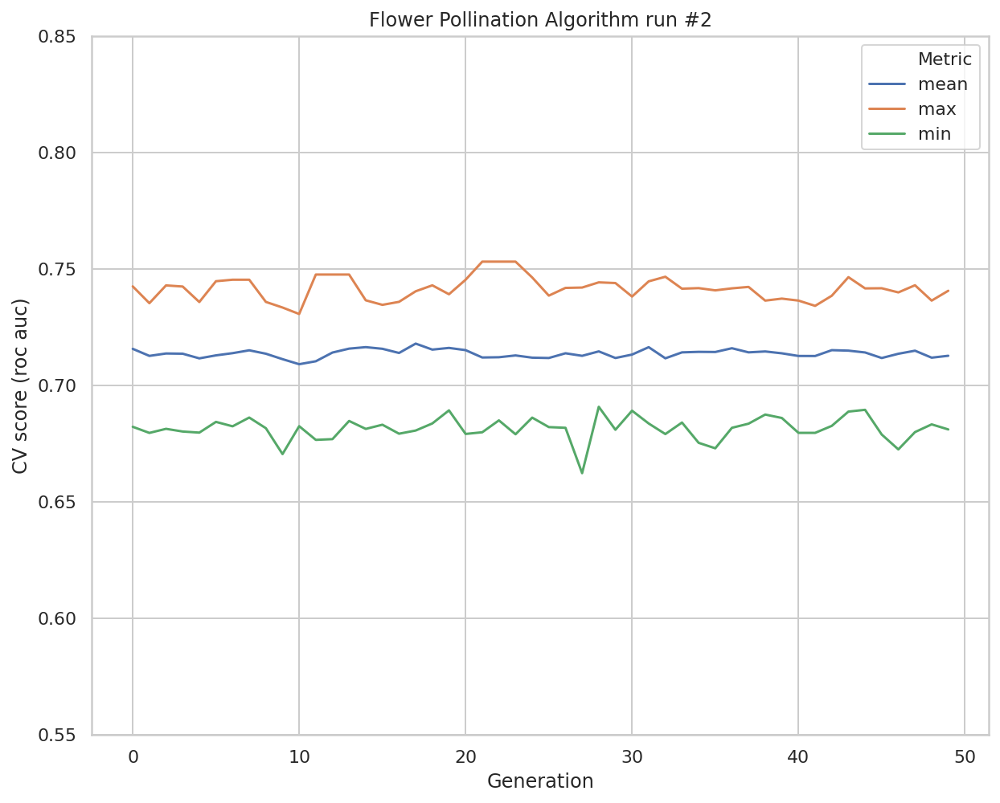

Score: 0.7530808550853605
Number of features selected: 106



--------------
Run 3
--------------


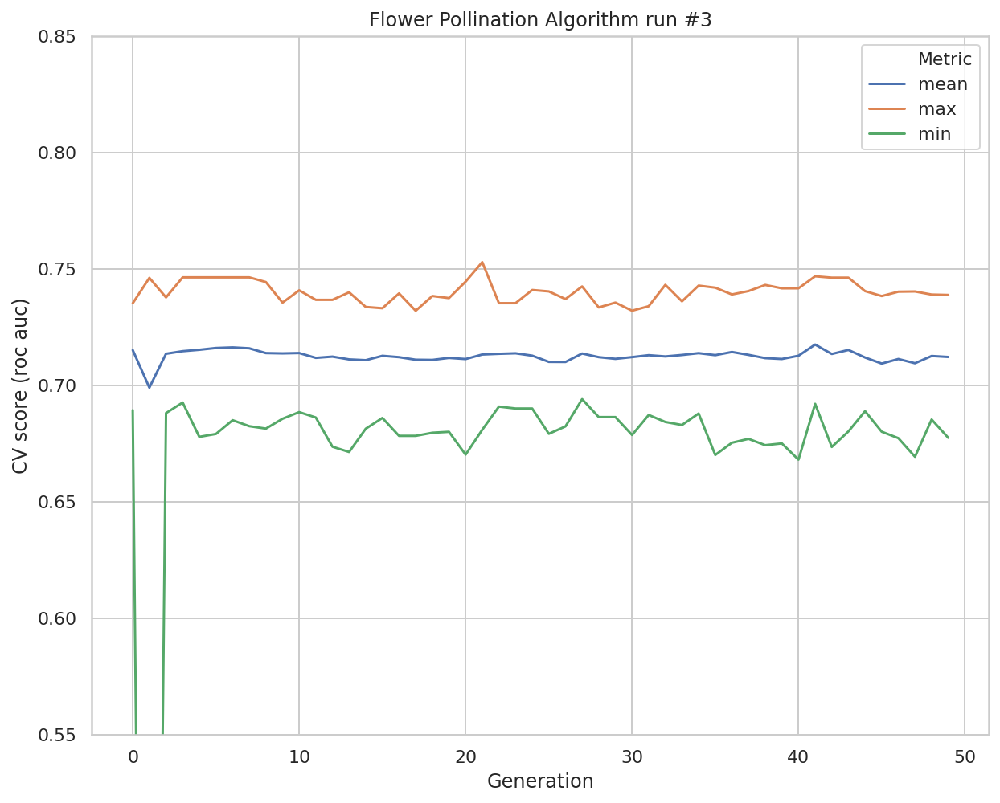

Score: 0.7528645764011188
Number of features selected: 113



--------------
Run 4
--------------


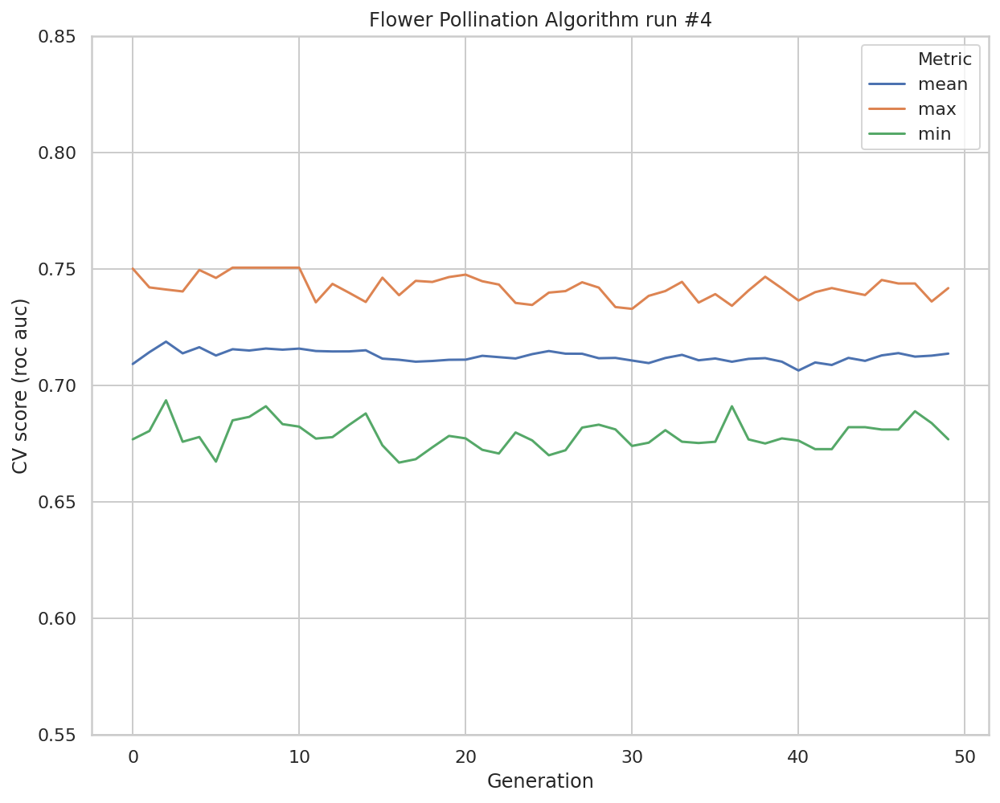

Score: 0.7505066818047877
Number of features selected: 105



--------------
Run 5
--------------


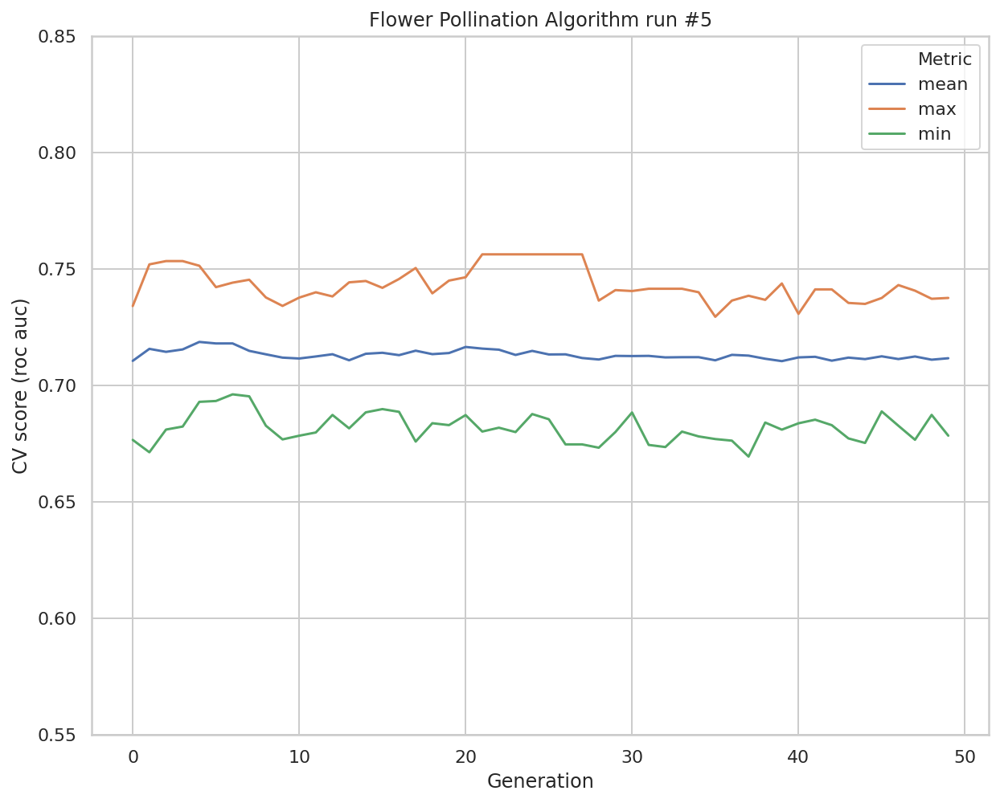

Score: 0.7562123493747748
Number of features selected: 113





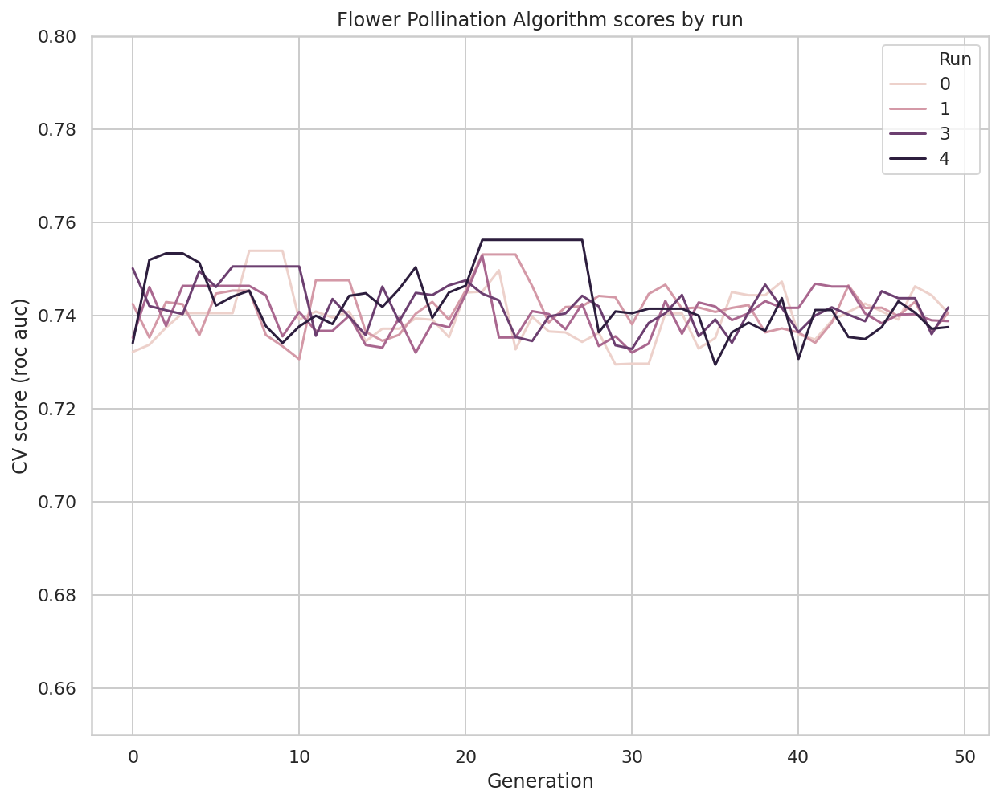

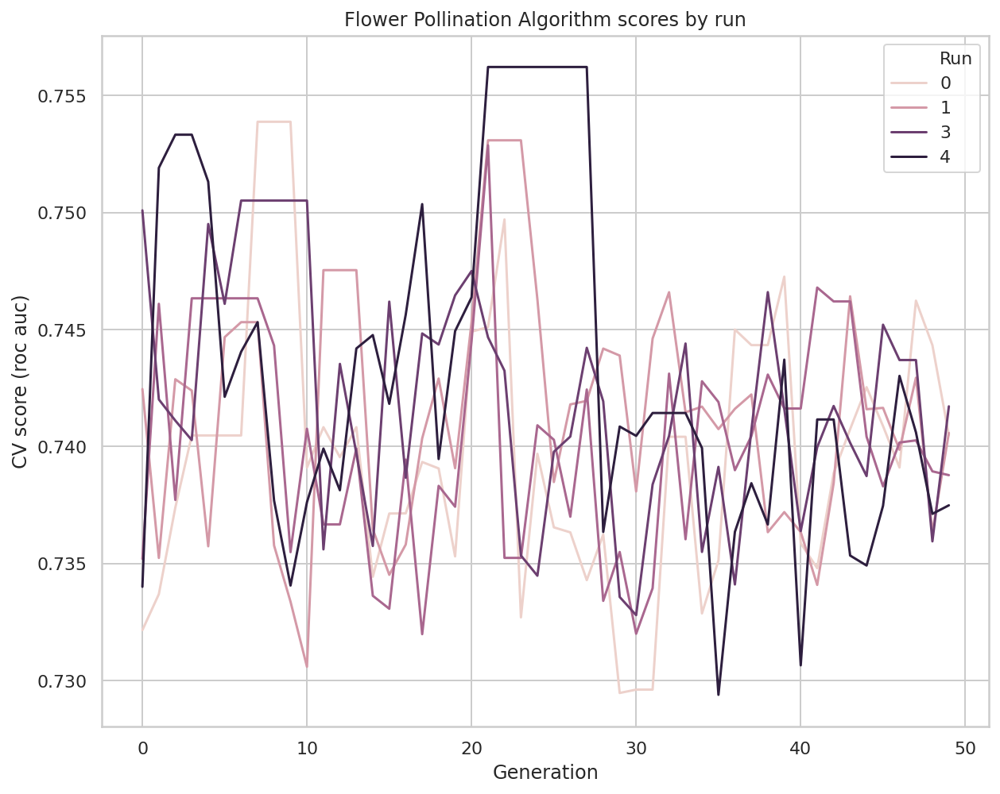


Mean score of 5 runs: 0.7533075421163418



Best score of 5 runs: 0.7562123493747748
Number of features selected: 113



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
The best score is 0.7562123493747748 with population_size=50

CPU times: user 40min 17s, sys: 3.75 s, total: 40min 20s
Wall time: 40min 20s


In [27]:
%%time

from NiaPy.algorithms.basic import FlowerPollinationAlgorithm


scores_by_run, _, overall_best_features, _, selected_features = run_experiment(FlowerPollinationAlgorithm())

scores_by_algorithm['FlowerPollinationAlgorithm'] = scores_by_run
selected_features_by_algorithm['FlowerPollinationAlgorithm'] = selected_features

not fraud
precision: 0.6751918158567775
recall: 0.9814126394052045
f1-score: 0.7999999999999999
support: 269


is fraud
precision: 0.7368421052631579
recall: 0.09929078014184398
f1-score: 0.17500000000000002
support: 141


accuracy: 0.6780487804878049


macro avg
precision: 0.7060169605599677
recall: 0.5403517097735242
f1-score: 0.4875
support: 410


weighted avg
precision: 0.6963935007501912
recall: 0.6780487804878049
f1-score: 0.5850609756097561
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.7060169605599678


CPU times: user 82.7 ms, sys: 6.07 ms, total: 88.7 ms
Wall time: 86.7 ms


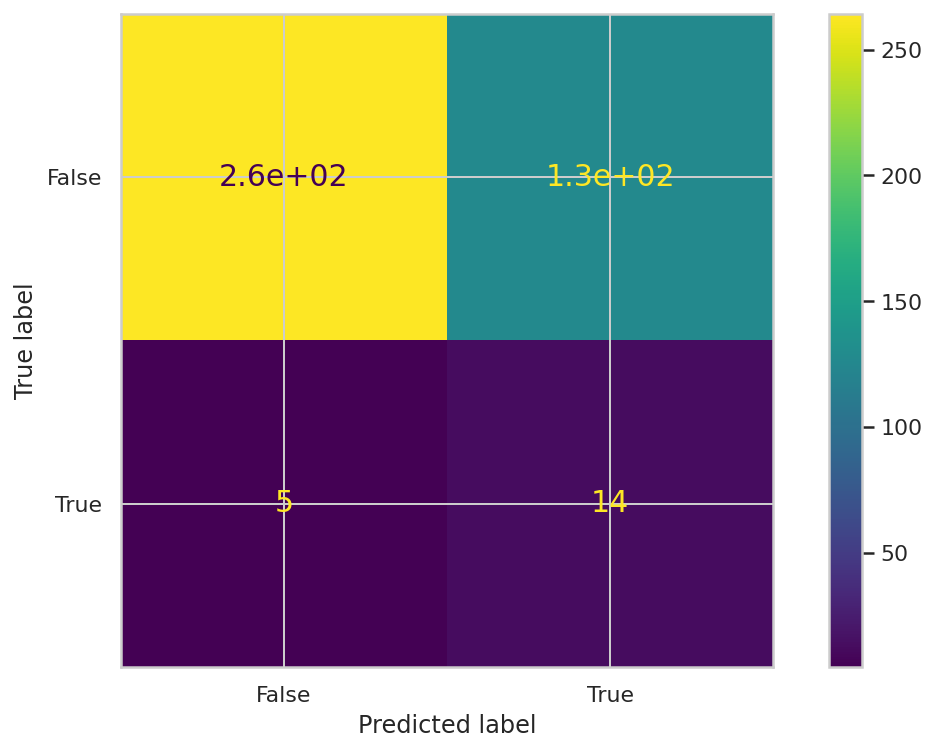

In [28]:
%%time

clf = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf = clf.fit(x_train[overall_best_features], y_train)

custom_classification_report(clf, x_test[overall_best_features], y_test)

### Grey Wolf Algorithm

[Grey Wolf Algorithm](https://github.com/NiaOrg/NiaPy/blob/master/NiaPy/algorithms/basic/gwo.py) default parameters: _there are no parameters other then population size_

GreyWolfOptimizer
population_size=10
number_of_generations=50
--------------
Run 1
--------------


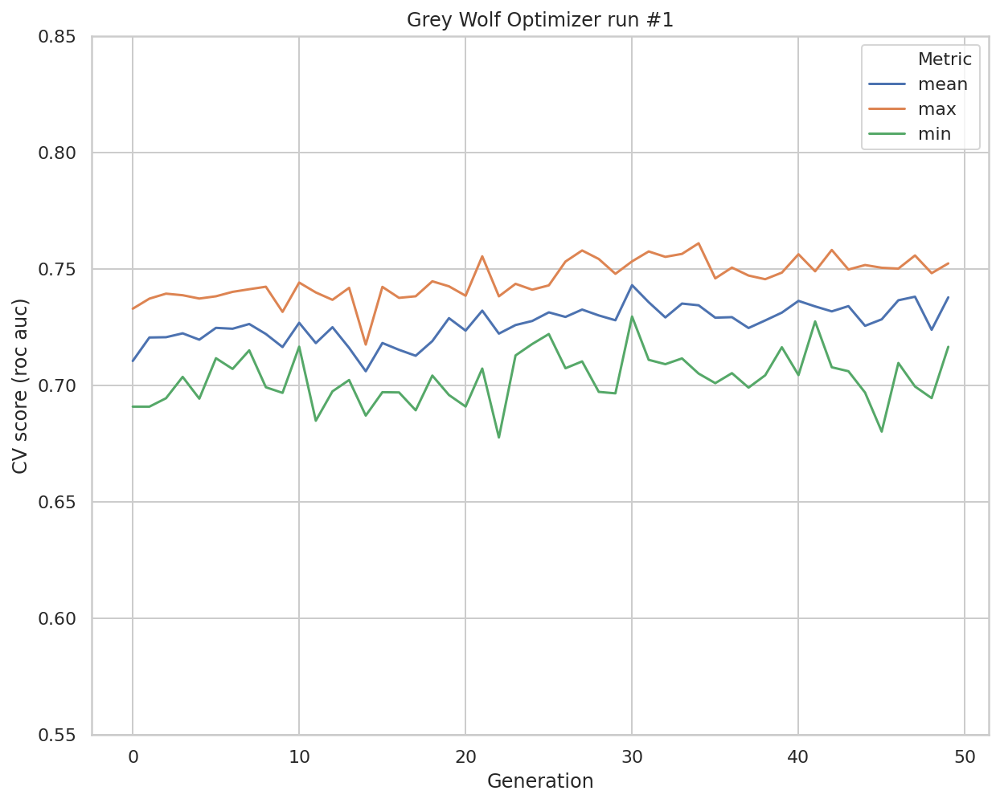

Score: 0.7609651540483855
Number of features selected: 74



--------------
Run 2
--------------


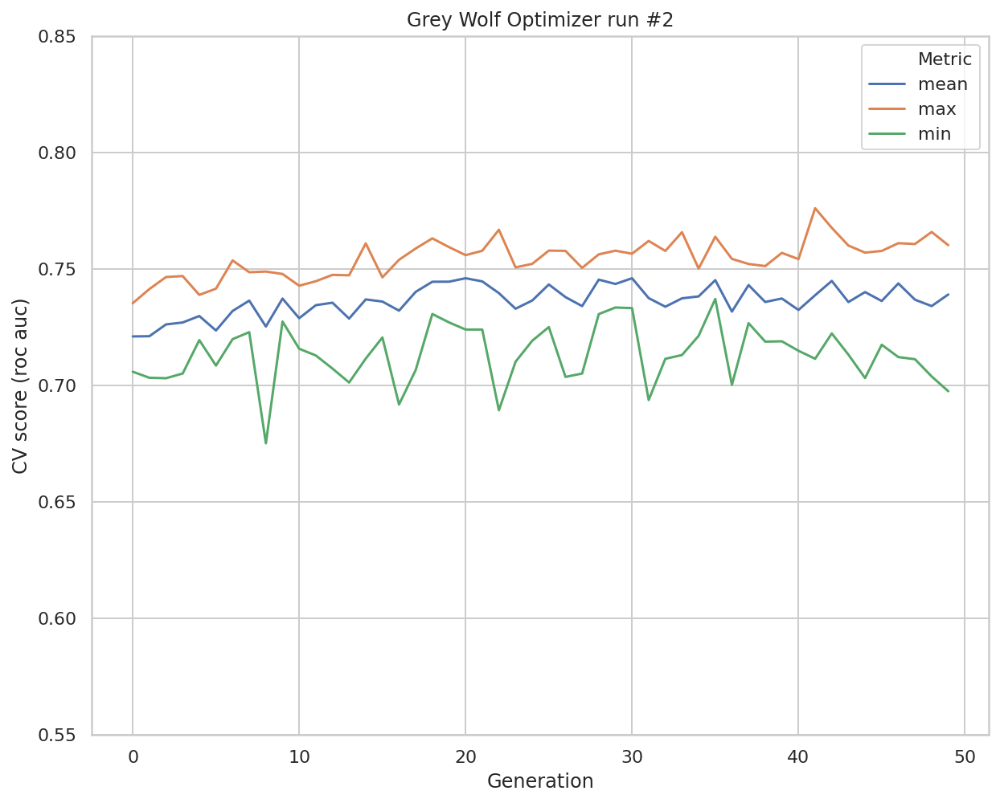

Score: 0.7760339846556527
Number of features selected: 60



--------------
Run 3
--------------


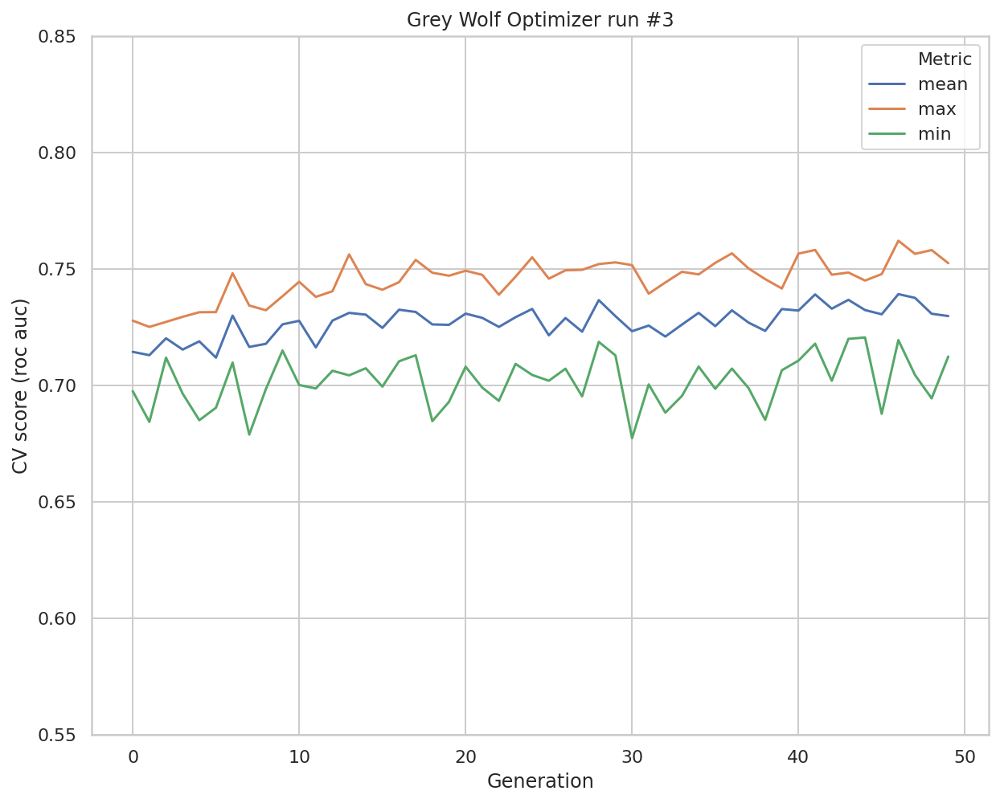

Score: 0.762050766805964
Number of features selected: 61



--------------
Run 4
--------------


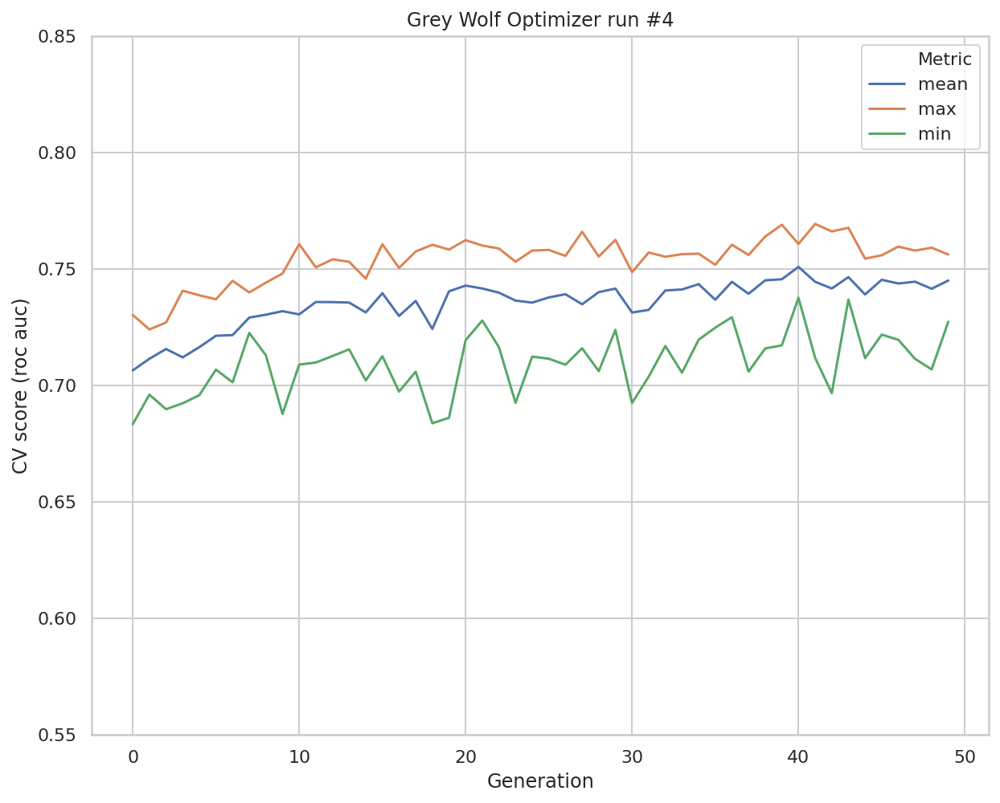

Score: 0.7692657158980184
Number of features selected: 54



--------------
Run 5
--------------


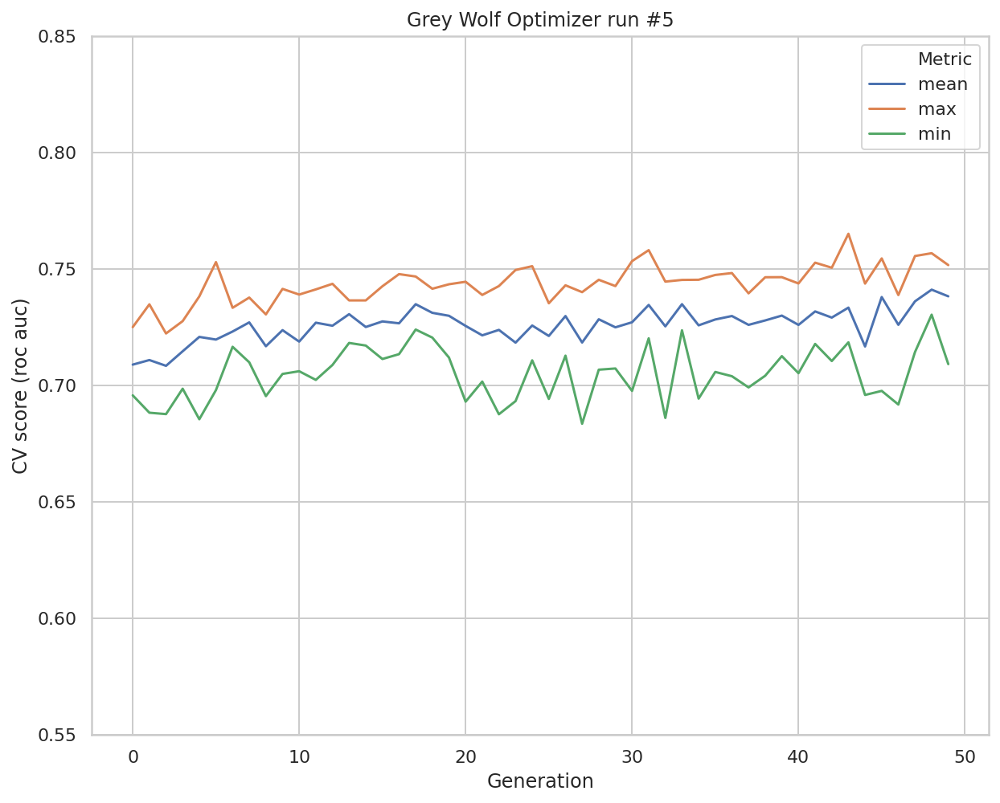

Score: 0.7650517975718877
Number of features selected: 73





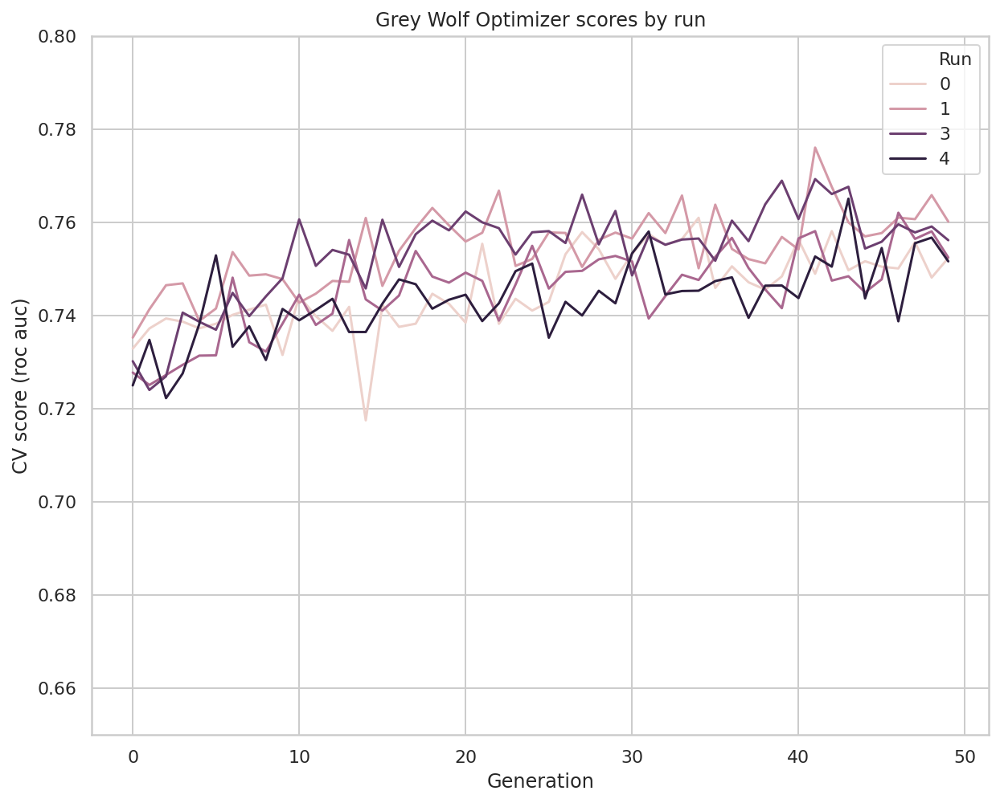

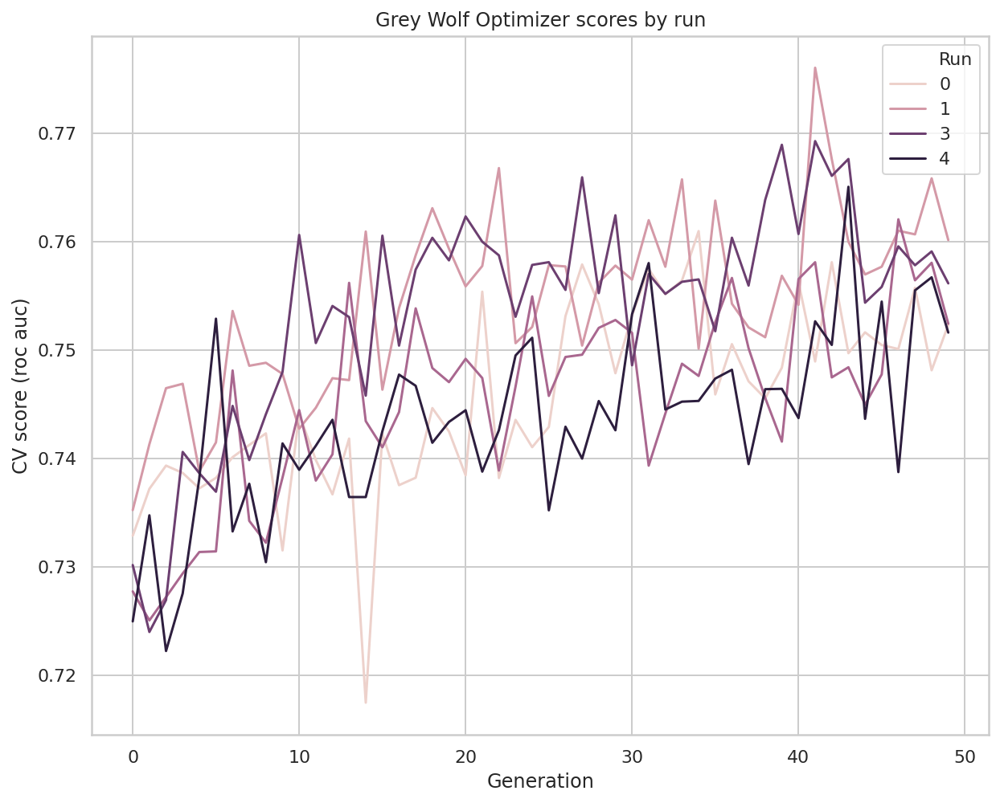


Mean score of 5 runs: 0.7666734837959817



Best score of 5 runs: 0.7760339846556527
Number of features selected: 60



GreyWolfOptimizer
population_size=20
number_of_generations=50
--------------
Run 1
--------------


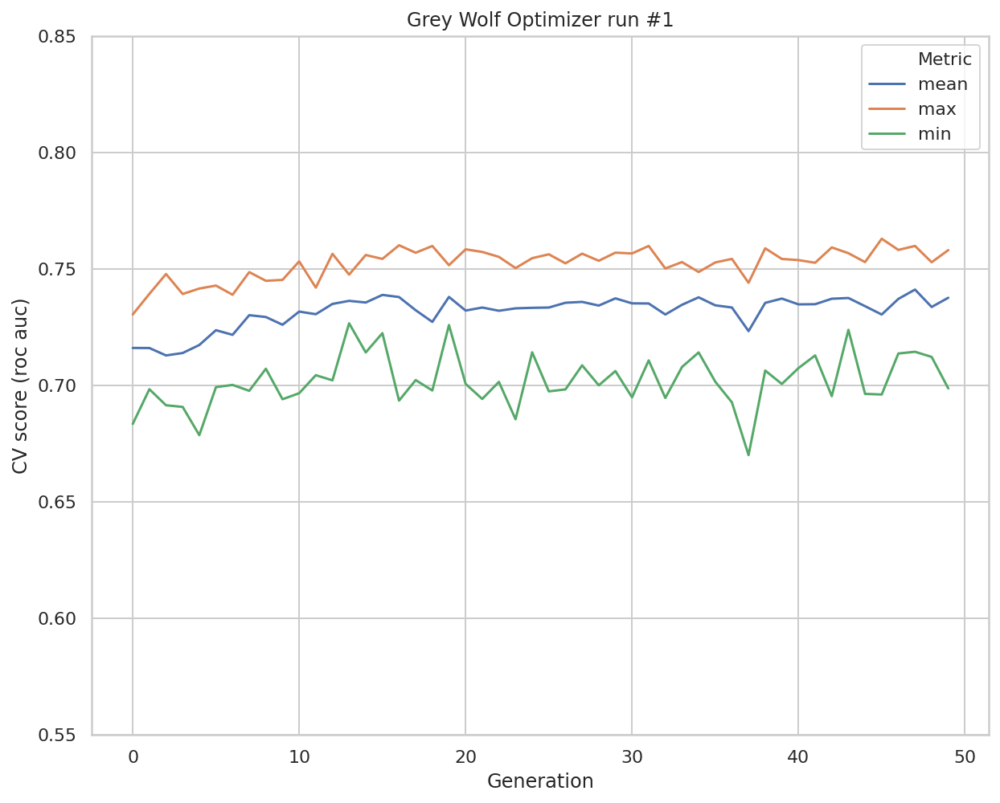

Score: 0.7629186337440584
Number of features selected: 72



--------------
Run 2
--------------


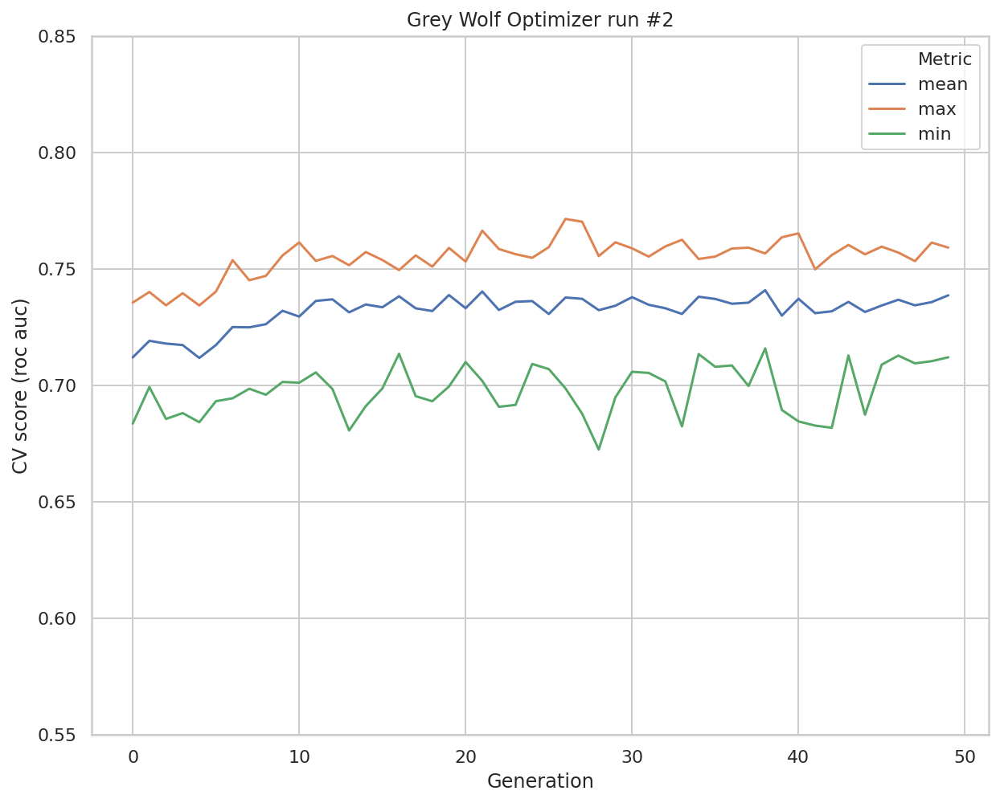

Score: 0.7714224074566737
Number of features selected: 69



--------------
Run 3
--------------


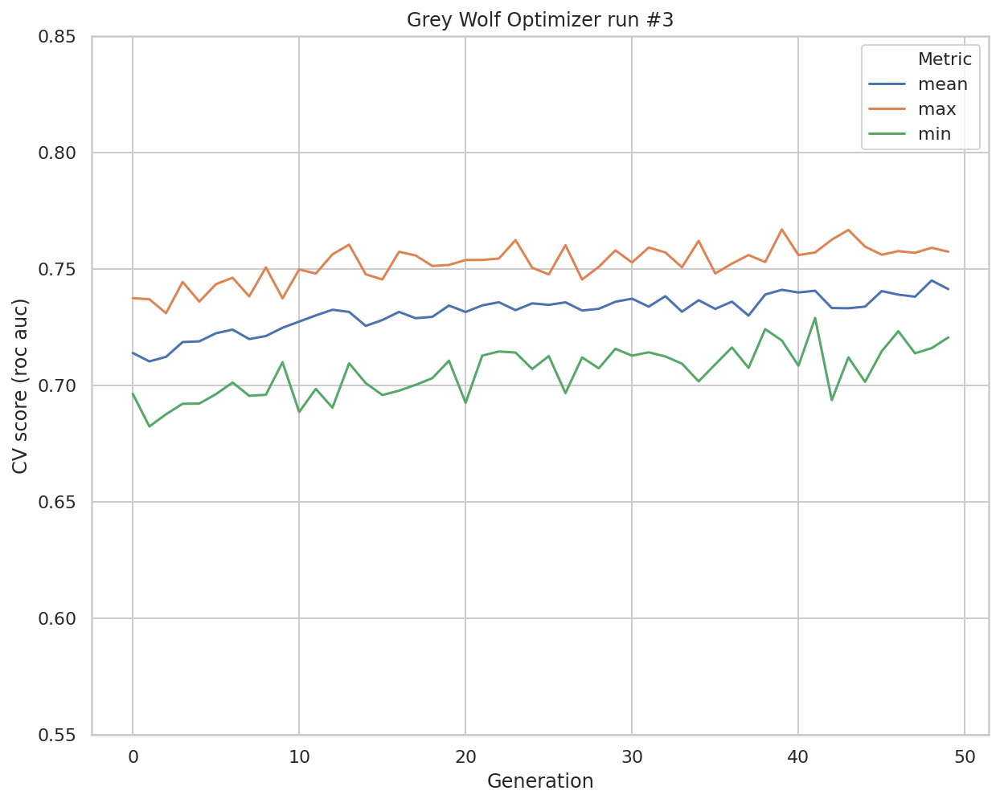

Score: 0.7669049875703624
Number of features selected: 70



--------------
Run 4
--------------


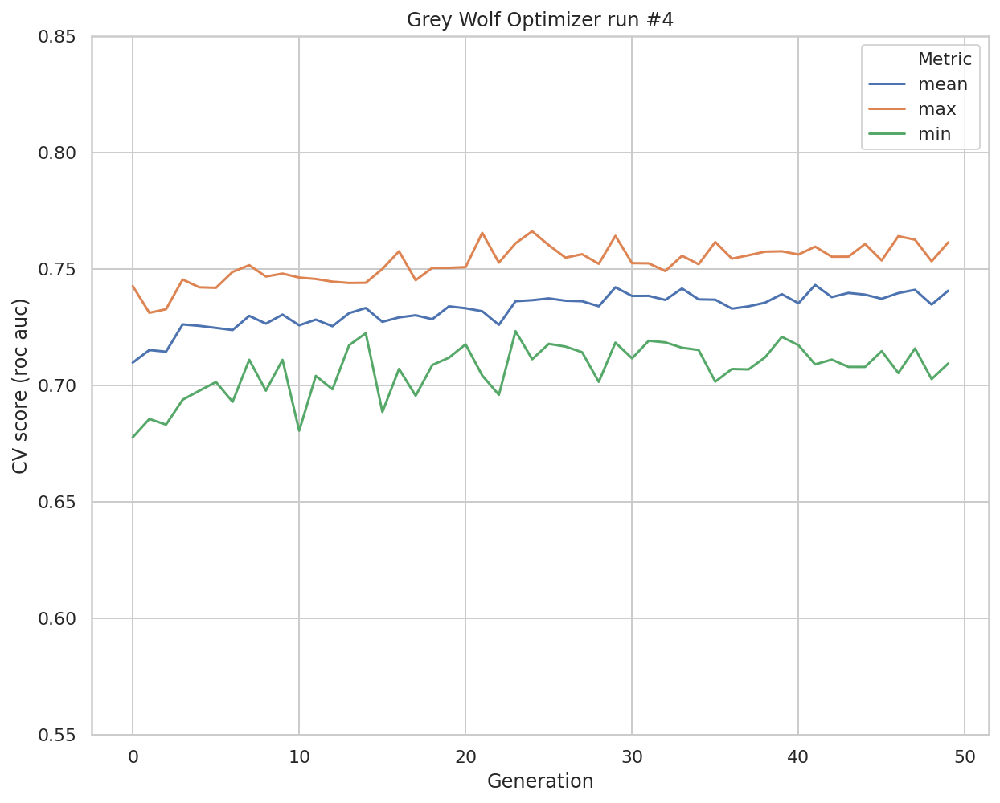

Score: 0.7661092012854372
Number of features selected: 79



--------------
Run 5
--------------


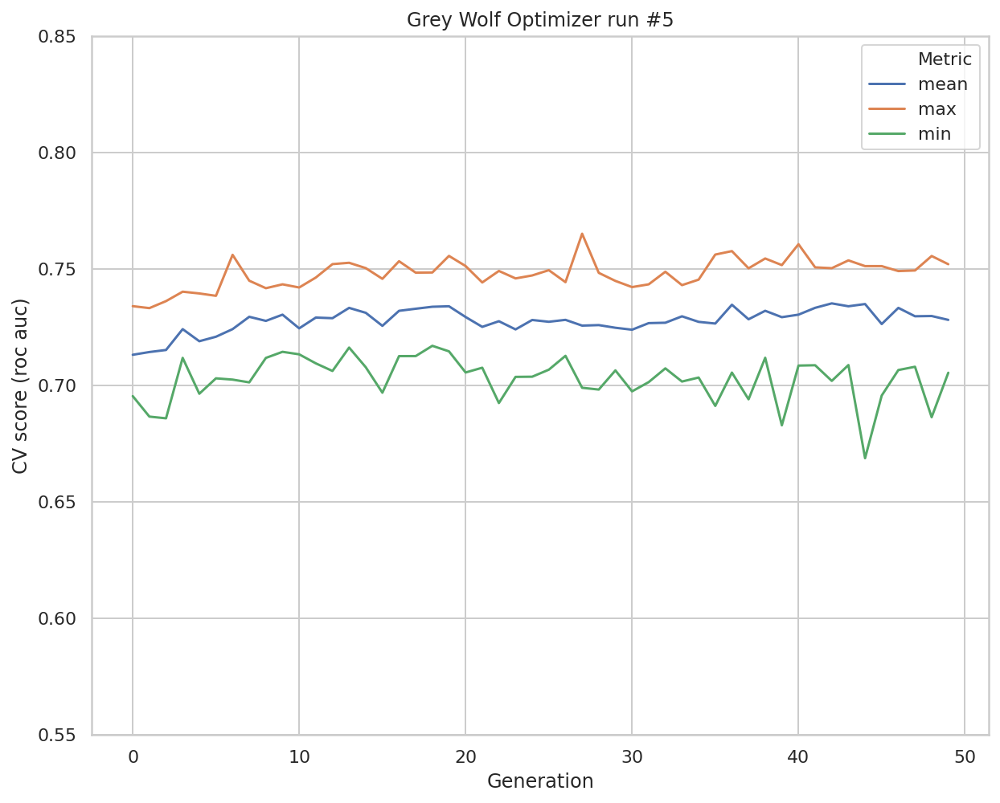

Score: 0.765075849785774
Number of features selected: 76





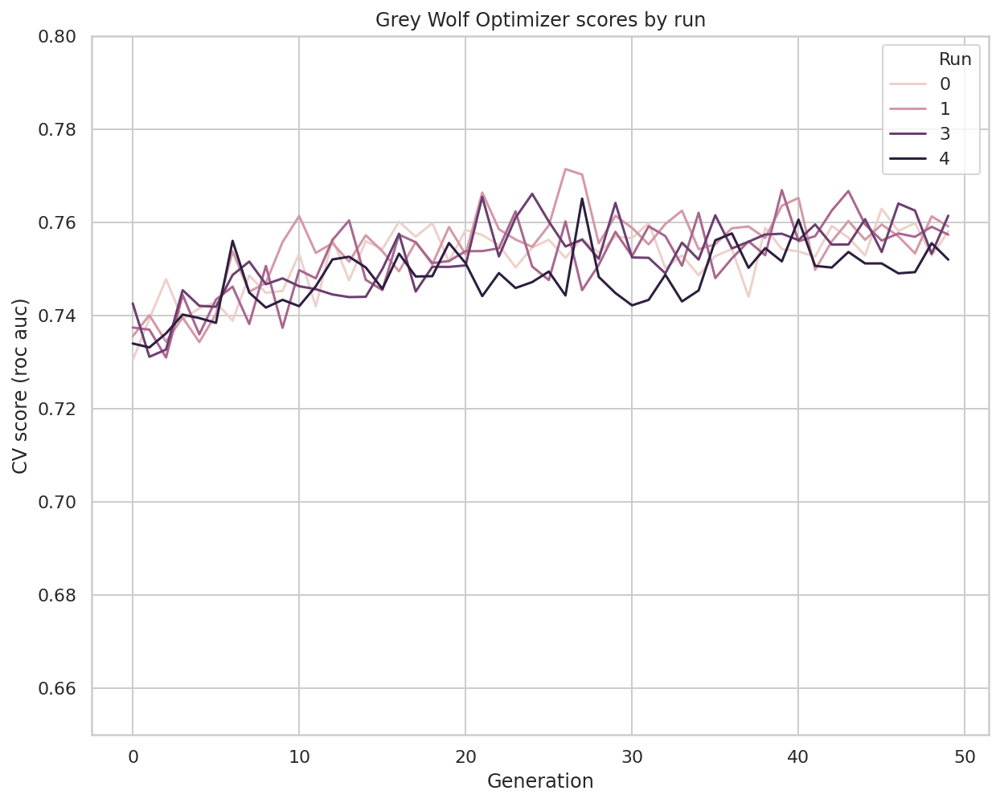

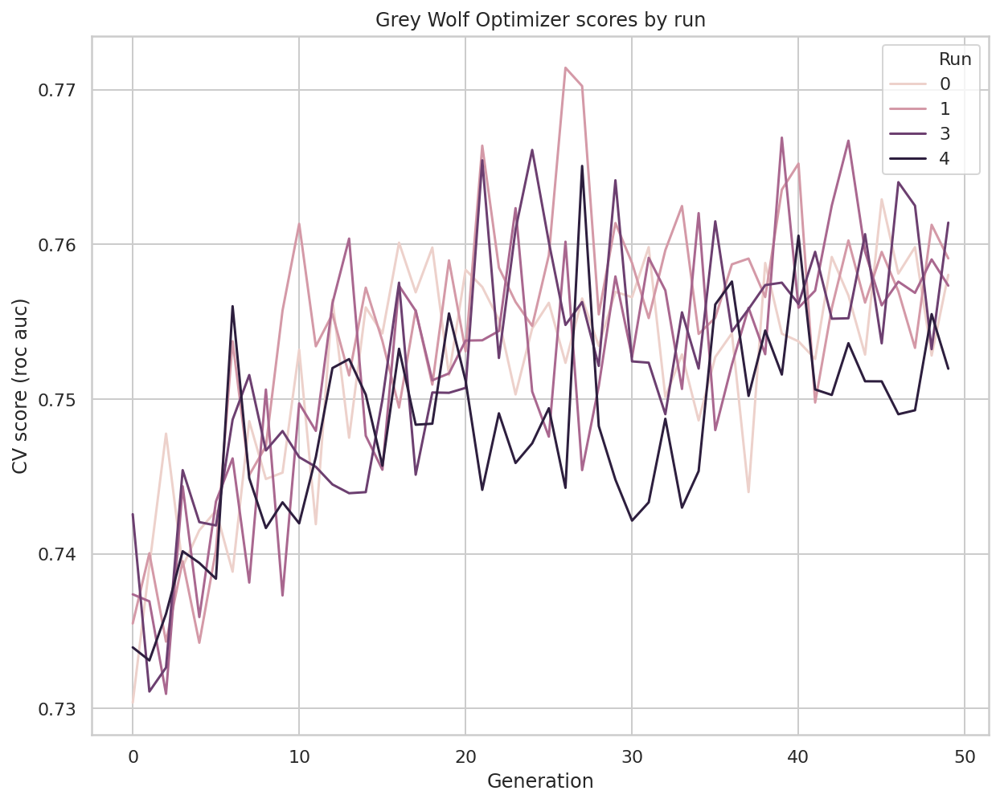


Mean score of 5 runs: 0.7664862159684612



Best score of 5 runs: 0.7714224074566737
Number of features selected: 69



GreyWolfOptimizer
population_size=50
number_of_generations=50
--------------
Run 1
--------------


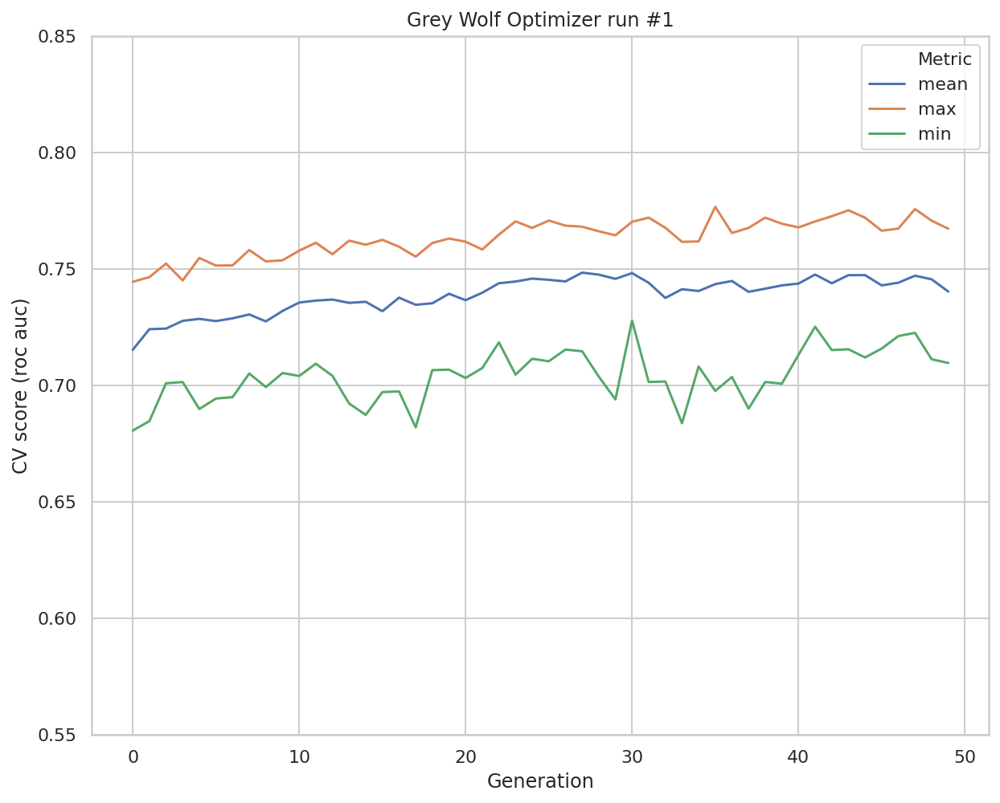

Score: 0.7766285479936542
Number of features selected: 50



--------------
Run 2
--------------


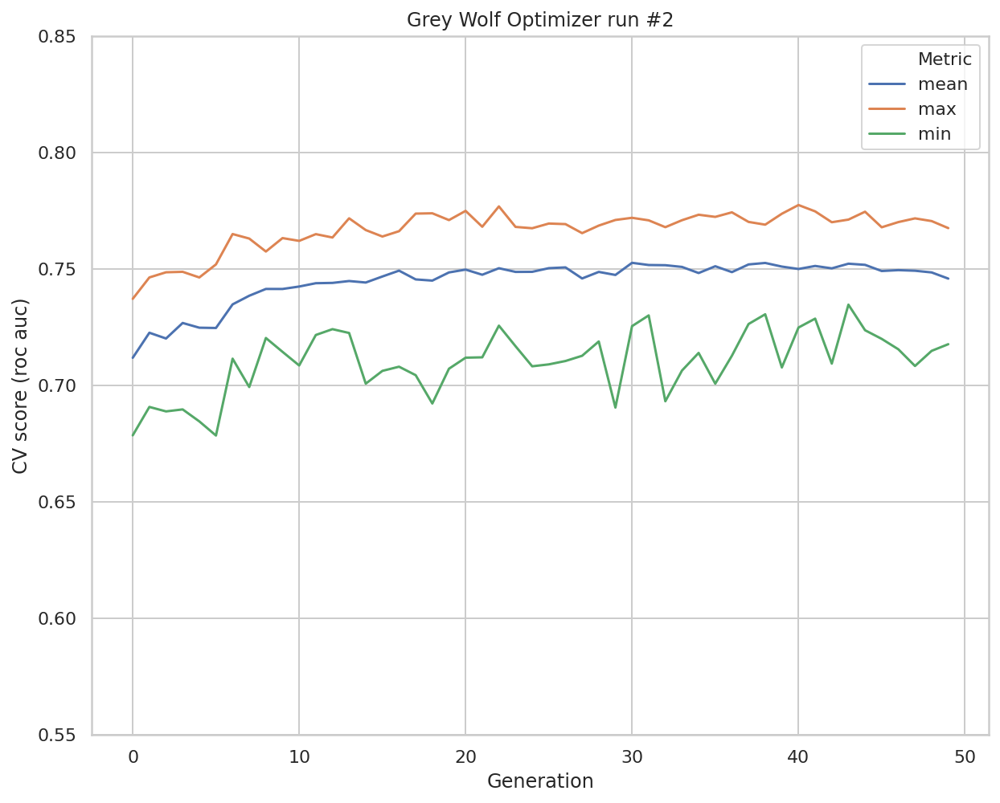

Score: 0.7774017605908456
Number of features selected: 72



--------------
Run 3
--------------


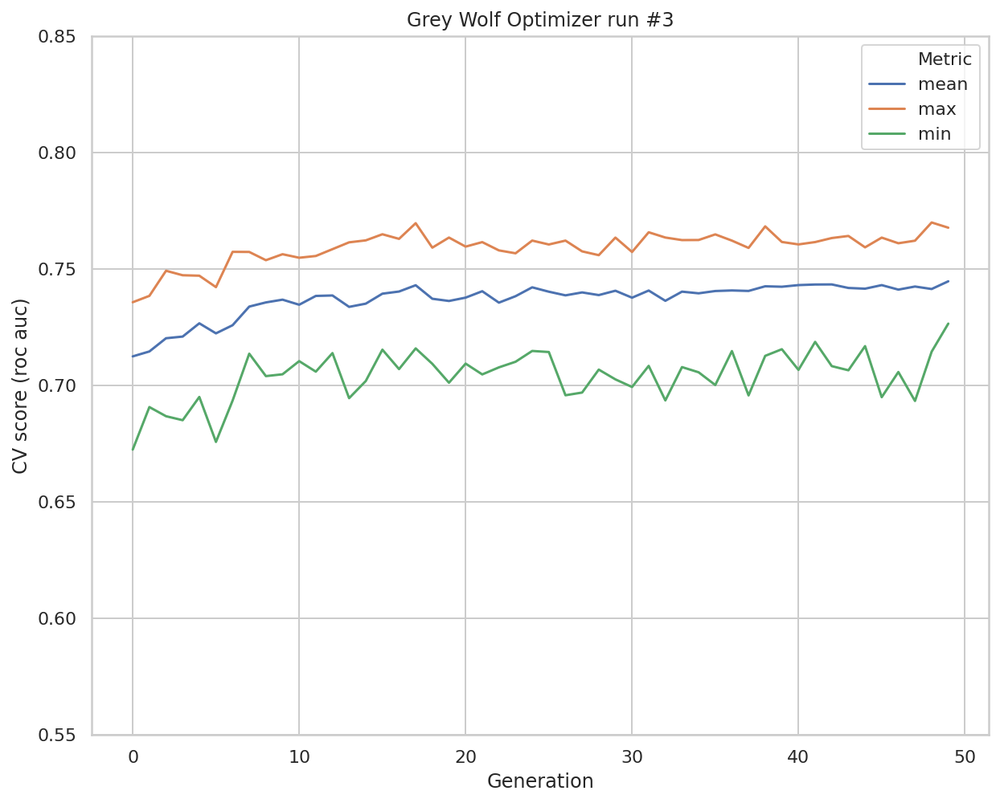

Score: 0.7699034413719392
Number of features selected: 68



--------------
Run 4
--------------


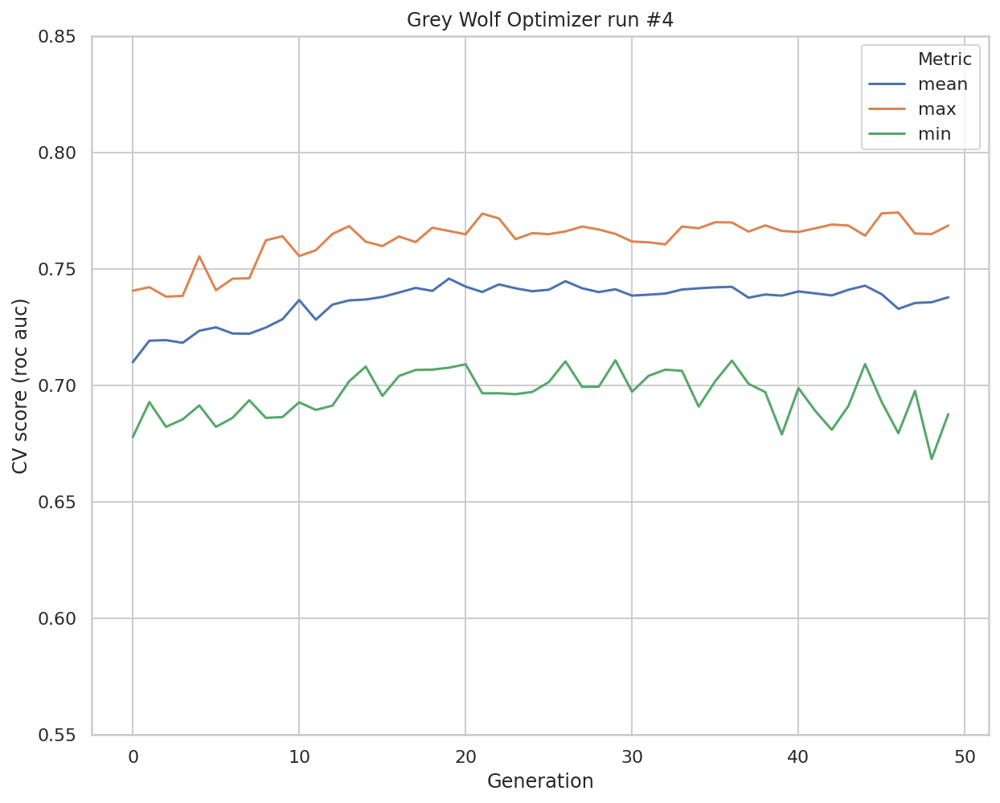

Score: 0.7741863777022542
Number of features selected: 61



--------------
Run 5
--------------


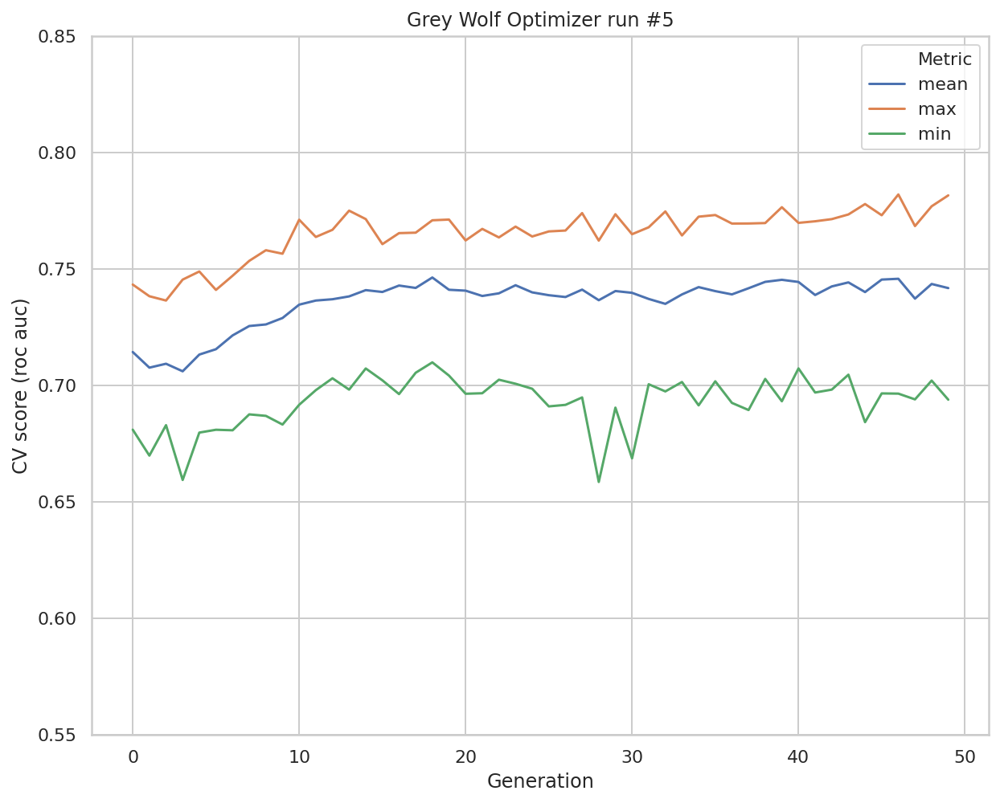

Score: 0.7819367631145667
Number of features selected: 53





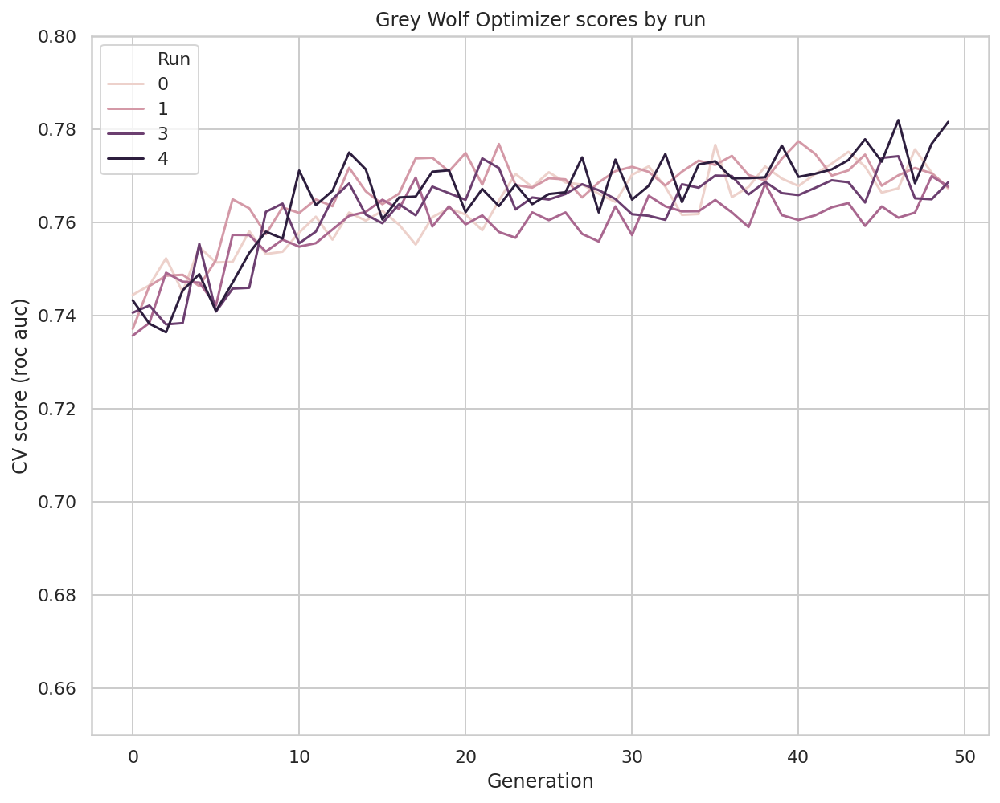

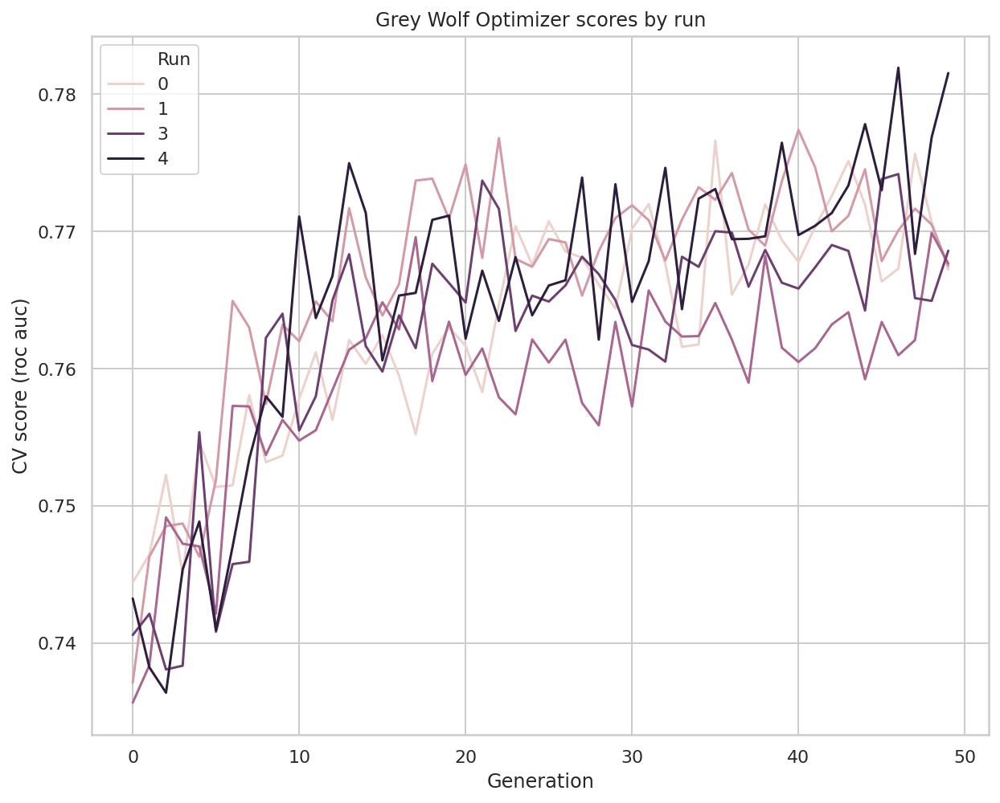


Mean score of 5 runs: 0.7760113781546519



Best score of 5 runs: 0.7819367631145667
Number of features selected: 53



~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
The best score is 0.7819367631145667 with population_size=50

CPU times: user 31min 34s, sys: 3.16 s, total: 31min 37s
Wall time: 31min 38s


In [29]:
%%time

from NiaPy.algorithms.basic import GreyWolfOptimizer


scores_by_run, _, overall_best_features, _, selected_features = run_experiment(GreyWolfOptimizer())

scores_by_algorithm['GreyWolfOptimizer'] = scores_by_run
selected_features_by_algorithm['GreyWolfOptimizer'] = selected_features

not fraud
precision: 0.7289002557544757
recall: 0.9827586206896551
f1-score: 0.8370044052863436
support: 290


is fraud
precision: 0.7368421052631579
recall: 0.11666666666666667
f1-score: 0.20143884892086328
support: 120


accuracy: 0.7292682926829268


macro avg
precision: 0.7328711805088168
recall: 0.5497126436781609
f1-score: 0.5192216271036034
support: 410


weighted avg
precision: 0.7312246995131144
recall: 0.7292682926829268
f1-score: 0.6509852180574225
support: 410


Area Under the Receiver Operating Characteristic Curve (ROC AUC)
Score: 0.7328711805088168


CPU times: user 76.8 ms, sys: 4.05 ms, total: 80.9 ms
Wall time: 76.6 ms


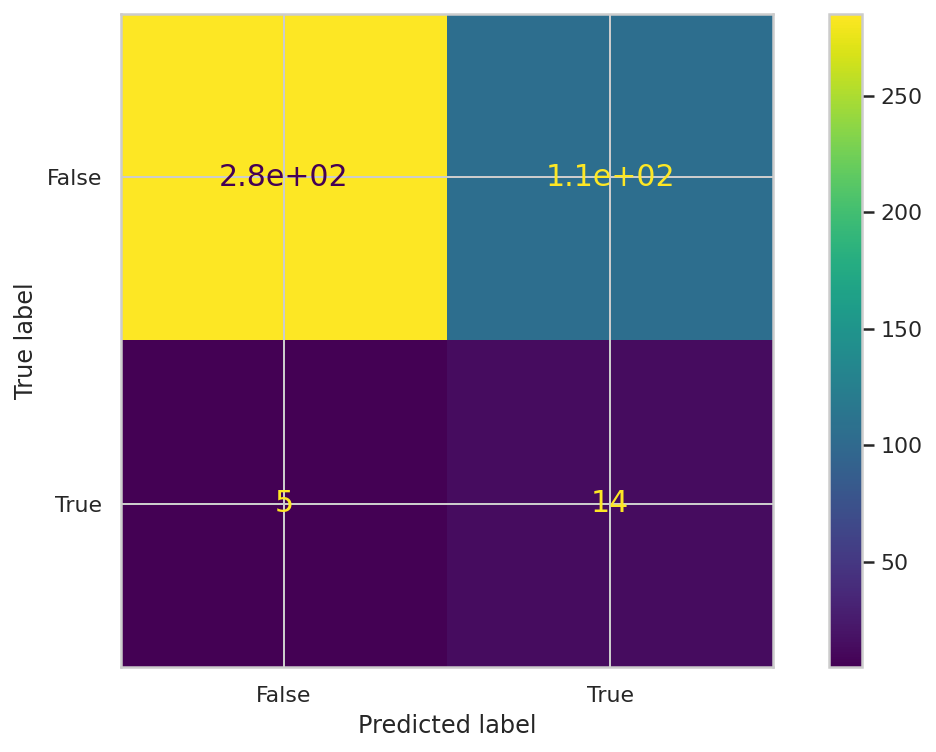

In [30]:
%%time

clf = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf = clf.fit(x_train[overall_best_features], y_train)

custom_classification_report(clf, x_test[overall_best_features], y_test)

## Comparison

Now we will compare all the algorithms with violin plots.

### Scores

In [31]:
from src.helpers import split_pascal_case_string

In [32]:
data_by_population_size = {}

for algorithm, scores_by_run in scores_by_algorithm.items():    
    for population_size, scores in scores_by_run.items():
        if population_size not in data_by_population_size:
            data_by_population_size[population_size] = []
        
        for score in scores:
            data_by_population_size[population_size].append([split_pascal_case_string(algorithm), score])

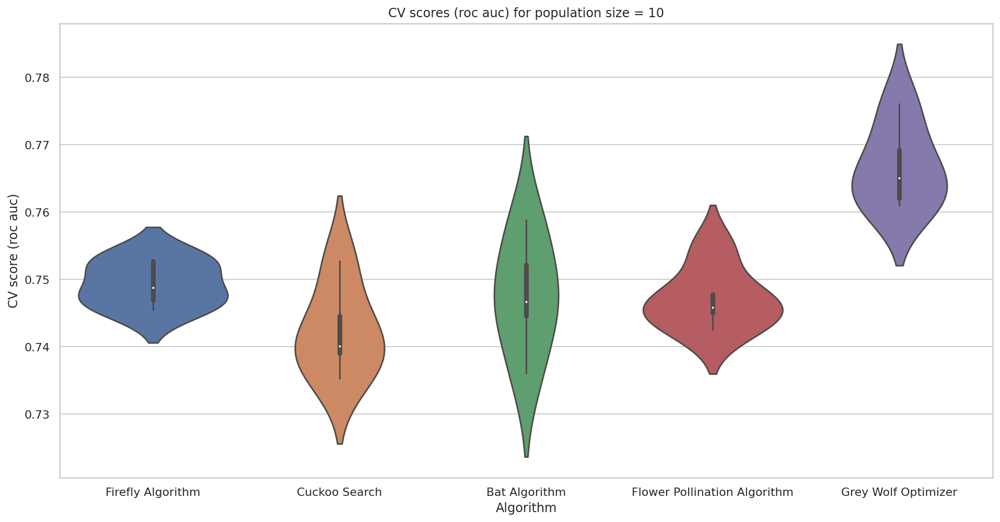

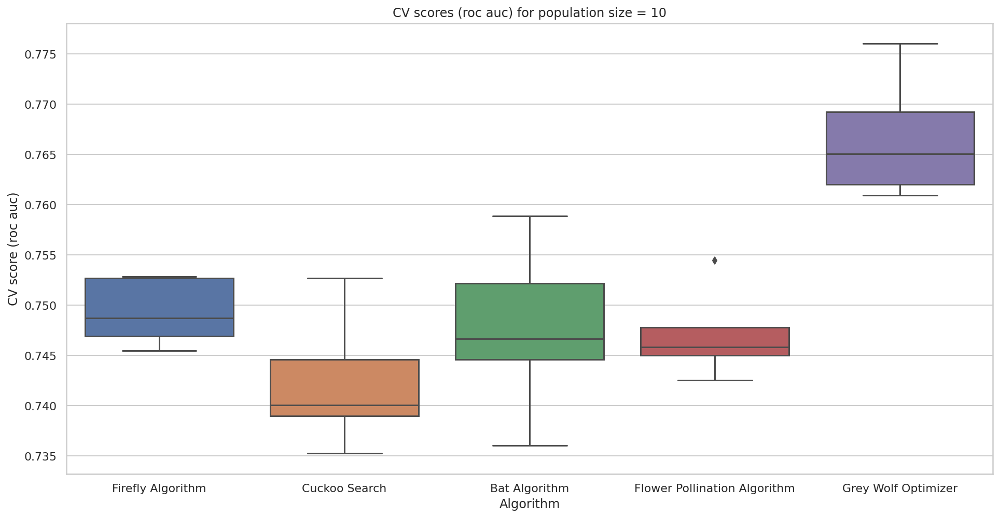

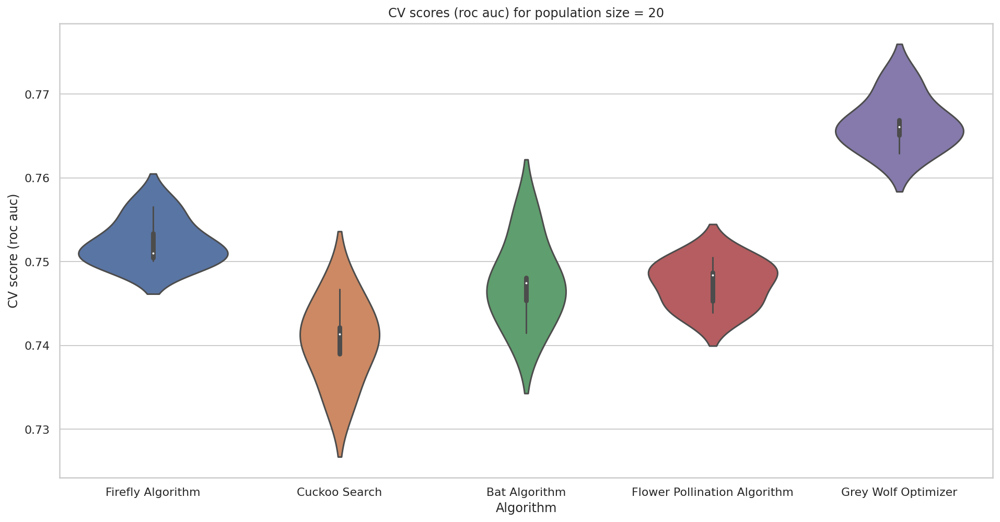

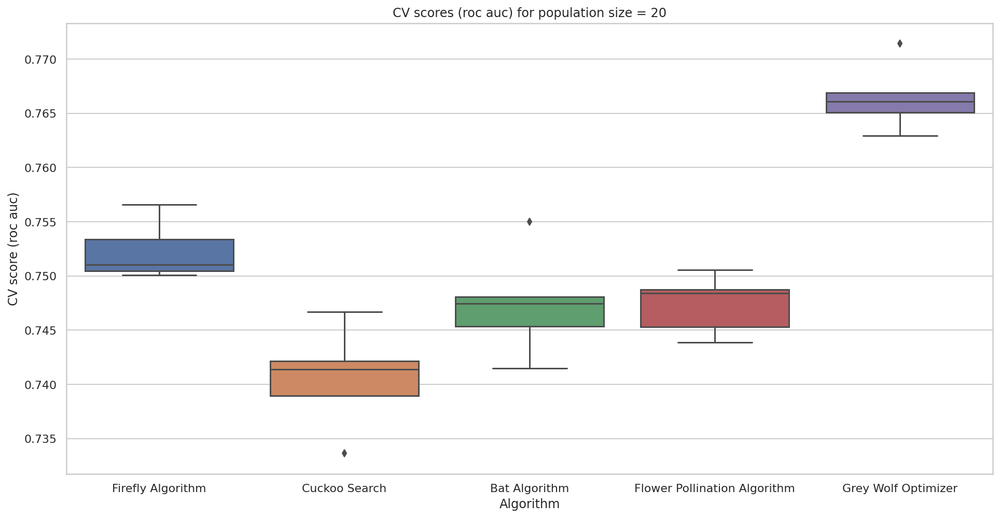

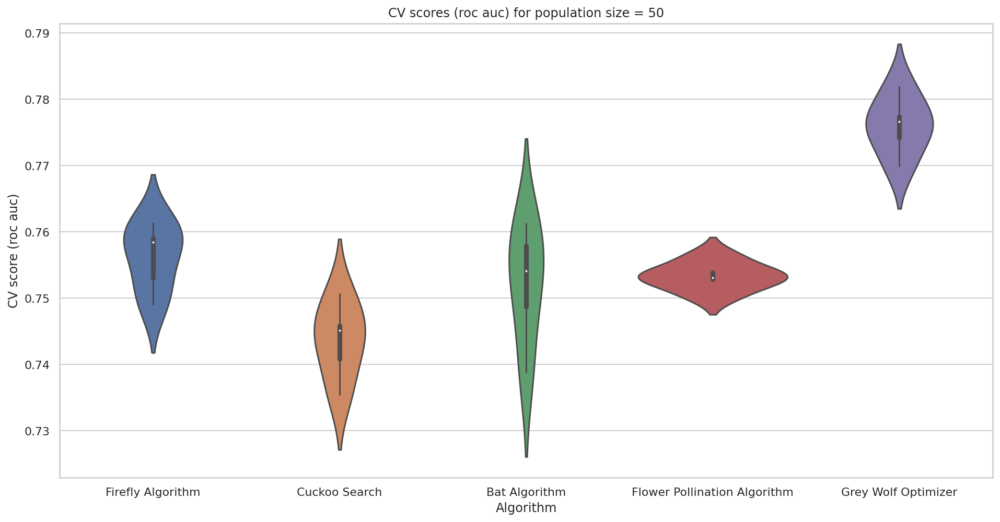

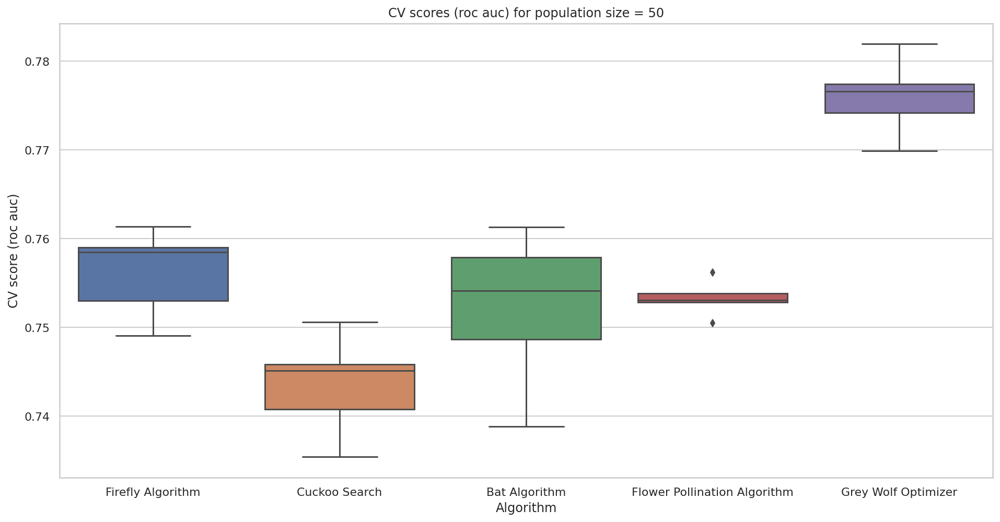

In [33]:
import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt


for population_size, data in data_by_population_size.items():
    df = pd.DataFrame(data, columns=['Algorithm', 'CV score (roc auc)'])
        
    fig, ax = plt.subplots(figsize=(16, 8))
    sns.violinplot(x="Algorithm", y="CV score (roc auc)", data=df).set_title(f'CV scores (roc auc) for population size = {population_size}')
    plt.show()
    
    fig, ax = plt.subplots(figsize=(16, 8))
    sns.boxplot(x="Algorithm", y="CV score (roc auc)", data=df).set_title(f'CV scores (roc auc) for population size = {population_size}')
    plt.show()

### Features

In [34]:
data_by_population_size = {}

for algorithm, selected_features_by_run in selected_features_by_algorithm.items():    
    for population_size, selected_features in selected_features_by_run.items():
        if population_size not in data_by_population_size:
            data_by_population_size[population_size] = []
        
        for features in selected_features:
            data_by_population_size[population_size].append([split_pascal_case_string(algorithm), features])

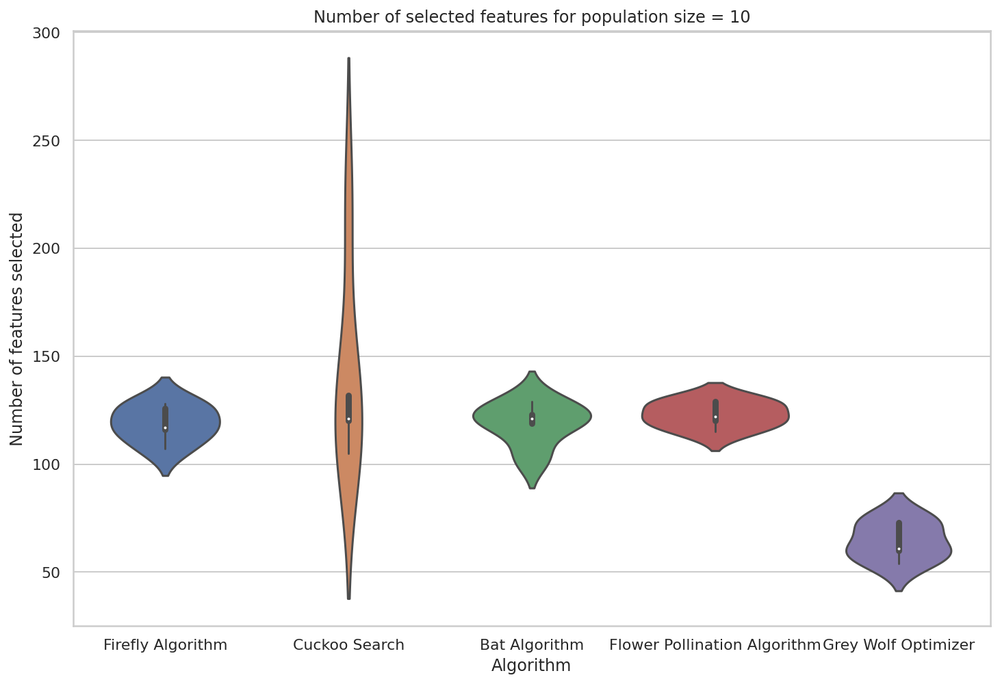

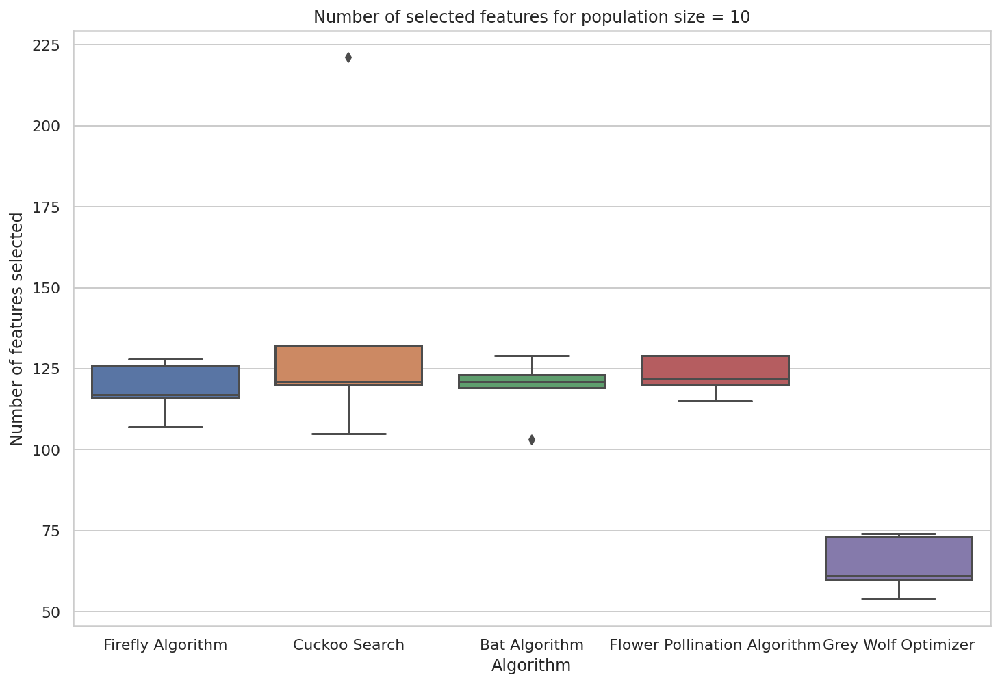

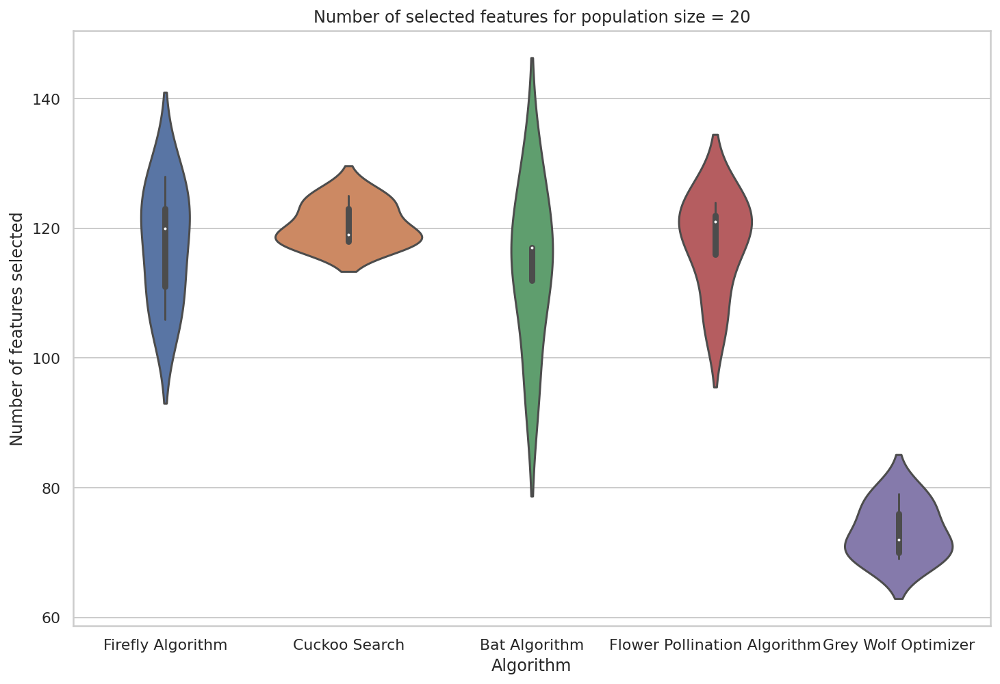

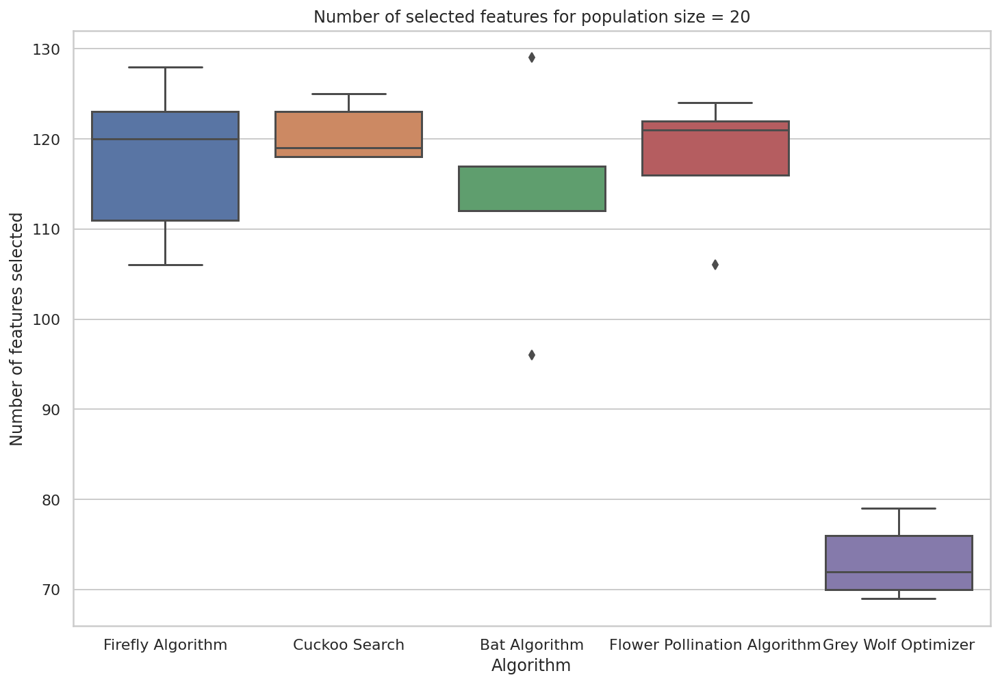

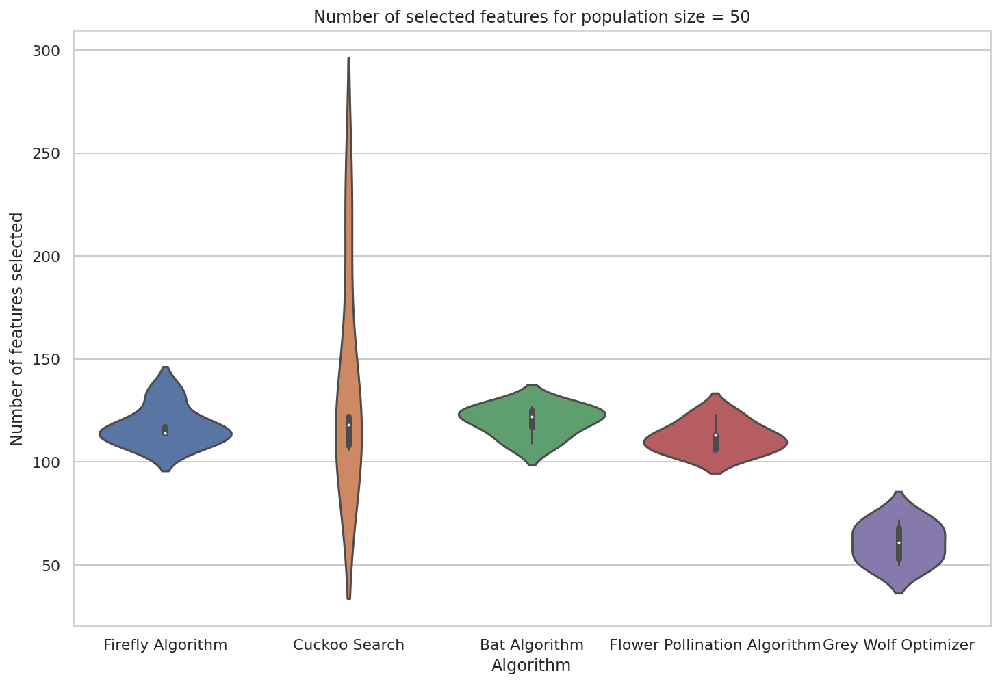

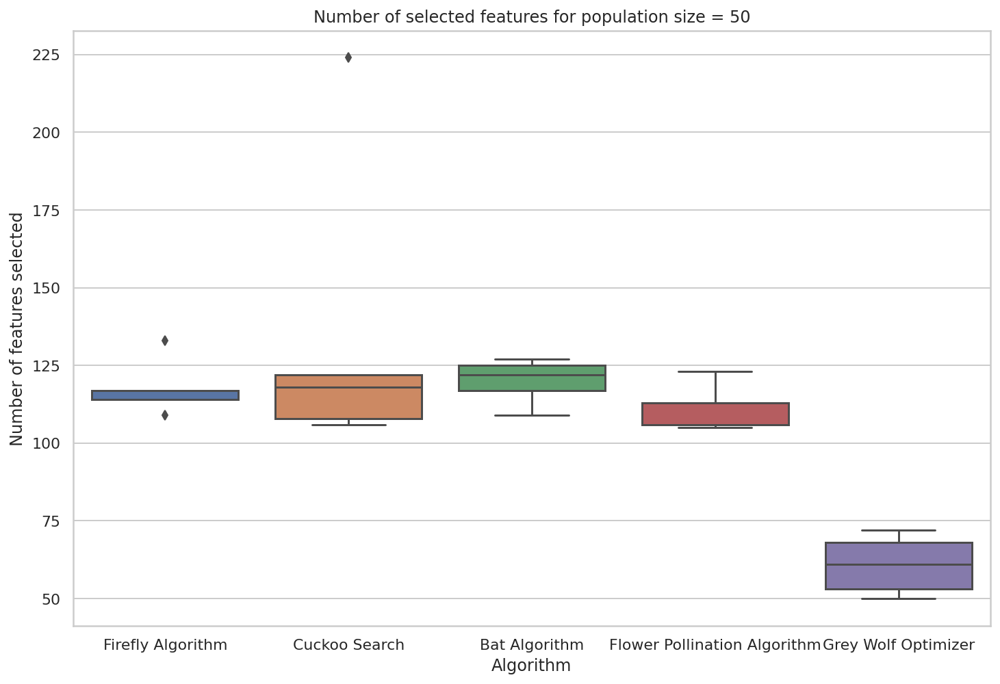

In [35]:
import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt


for population_size, data in data_by_population_size.items():
    df = pd.DataFrame(data, columns=['Algorithm', 'Number of features selected'])
        
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.violinplot(x="Algorithm", y="Number of features selected", data=df).set_title(f'Number of selected features for population size = {population_size}')
    plt.show()
    
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.boxplot(x="Algorithm", y="Number of features selected", data=df).set_title(f'Number of selected features for population size = {population_size}')
    plt.show()

In [38]:
scores_by_algorithm

{'FireflyAlgorithm': {10: [0.7527140320270265,
   0.746926810277507,
   0.7487409027199018,
   0.7528794883311779,
   0.7454613128552874],
  20: [0.7504834642610525,
   0.7533928876329072,
   0.7510444708918255,
   0.7565772259203919,
   0.7500788677678984],
  50: [0.7584658655207278,
   0.7530375275363493,
   0.749057245800297,
   0.7613712931136523,
   0.7590406862241115]},
 'CuckooSearch': {10: [0.7390109133256852,
   0.7400896220936668,
   0.7352741889343166,
   0.7527099836579665,
   0.7446204269588284],
  20: [0.7413695477330166,
   0.7389705878242822,
   0.7421628977680588,
   0.7336412912218256,
   0.7466950042656451],
  50: [0.7451310295243544,
   0.7407976795833374,
   0.7506184001267453,
   0.7354367330665029,
   0.7458584327267103]},
 'BatAlgorithm': {10: [0.7446058255253519,
   0.7588722175799979,
   0.7360347186506677,
   0.7466525611316798,
   0.7522068847124789],
  20: [0.7550193916980538,
   0.7414628824349625,
   0.7474471640897483,
   0.7480927418195609,
   0.7453500

In [37]:
selected_features_by_algorithm

{'FireflyAlgorithm': {10: [128, 107, 116, 126, 117],
  20: [120, 123, 128, 106, 111],
  50: [117, 133, 114, 114, 109]},
 'CuckooSearch': {10: [132, 121, 221, 105, 120],
  20: [123, 118, 125, 119, 118],
  50: [122, 108, 106, 224, 118]},
 'BatAlgorithm': {10: [123, 119, 129, 121, 103],
  20: [117, 129, 96, 112, 117],
  50: [127, 122, 109, 125, 117]},
 'FlowerPollinationAlgorithm': {10: [129, 129, 120, 115, 122],
  20: [124, 106, 121, 116, 122],
  50: [123, 106, 113, 105, 113]},
 'GreyWolfOptimizer': {10: [74, 60, 61, 54, 73],
  20: [72, 69, 70, 79, 76],
  50: [50, 72, 68, 61, 53]}}